* Jay Swaminarayan *


In [6]:
#Install necessary library
!pip install pandas
!pip install seaborn
!pip install matplotlib
!pip install scipy
!pip install statsmodels
!pip install openpyxl
!pip install sklearn


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [ ]:
!pip install pmdarima

In [79]:
#import necessary library
from datetime import date

import pandas as pd
import numpy as np
import math
from functools import reduce
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

from pandas.tseries.offsets import DateOffset
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

import matplotlib.pyplot as plt
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [80]:
import warnings
warnings.simplefilter(action='ignore', category=Warning)

In [81]:
#Load the data set into dataframe
df_Residencial= pd.read_excel('Residential_Sector_Energy_Consumption.xlsx','Monthly Data')
df_Industrial= pd.read_excel('Industrial_Sector_Energy_Consumption.xlsx','Monthly Data')
df_Commercial= pd.read_excel('Commercial_Sector_Energy_Consumption.xlsx','Monthly Data')
df_Transport= pd.read_excel('Transportation_Sector_Energy_Consumption.xlsx','Monthly Data')


In [82]:
#Checking 5 top records
df_Residencial.head()

,Month,Coal Consumed by the Residential Sector,Natural Gas Consumed by the Residential Sector (Excluding Supplemental Gaseous Fuels),Petroleum Consumed by the Residential Sector,Total Fossil Fuels Consumed by the Residential Sector,Geothermal Energy Consumed by the Residential Sector,Solar Energy Consumed by the Residential Sector,Biomass Energy Consumed by the Residential Sector,Total Renewable Energy Consumed by the Residential Sector,Total Primary Energy Consumed by the Residential Sector,Electricity Sales to Ultimate Customers in the Residential Sector,End-Use Energy Consumed by the Residential Sector,Electricity Energy System Losses Proportioned to the Residential Sector,Total Energy Consumed by the Residential Sector
0,1973-01-01,11.894,860.778,436.524,1309.196,Not Available,Not Available,30.074,30.074,1339.270,180.291,1519.560,438.081,1957.641
1,1973-02-01,10.188,762.278,375.271,1147.736,Not Available,Not Available,27.164,27.164,1174.899,169.240,1344.139,368.004,1712.143
2,1973-03-01,8,661.474,283.826,953.300,Not Available,Not Available,30.074,30.074,983.374,158.027,1141.401,368.678,1510.079
3,1973-04-01,5.237,475.184,205.865,686.287,Not Available,Not Available,29.104,29.104,715.391,142.693,858.084,325.337,1183.421
4,1973-05-01,5.313,332.839,167.688,505.841,Not Available,Not Available,30.074,30.074,535.914,135.883,671.797,334.528,1006.326


In [83]:
df_Industrial.head()

,Month,Coal Consumed by the Industrial Sector,Natural Gas Consumed by the Industrial Sector (Excluding Supplemental Gaseous Fuels),Petroleum Consumed by the Industrial Sector (Excluding Biofuels),Total Fossil Fuels Consumed by the Industrial Sector,Conventional Hydroelectric Power Consumed by the Industrial Sector,Geothermal Energy Consumed by the Industrial Sector,Solar Energy Consumed by the Industrial Sector,Wind Energy Consumed by the Industrial Sector,Biomass Energy Consumed by the Industrial Sector,Total Renewable Energy Consumed by the Industrial Sector,Total Primary Energy Consumed by the Industrial Sector,Electricity Sales to Ultimate Customers in the Industrial Sector,End-Use Energy Consumed by the Industrial Sector,Electrical Energy System Losses Proportioned to the Industrial Sector,Total Energy Consumed by the Industrial Sector
0,1973-01-01,363.058,826.344,736.648,1924.933,3.167,Not Available,Not Available,Not Available,98.933,102.100,2027.033,188.594,2215.627,458.255,2673.882
1,1973-02-01,334.333,712.644,702.158,1749.012,2.928,Not Available,Not Available,Not Available,89.359,92.287,1841.299,186.266,2027.565,405.027,2432.592
2,1973-03-01,343.602,746.215,736.431,1824.239,3.240,Not Available,Not Available,Not Available,98.933,102.172,1926.411,190.614,2117.025,444.704,2561.729
3,1973-04-01,337.989,823.507,654.331,1815.181,3.095,Not Available,Not Available,Not Available,95.741,98.836,1914.017,190.856,2104.873,435.147,2540.020
4,1973-05-01,343.906,869.133,764.131,1974.342,3.193,Not Available,Not Available,Not Available,98.933,102.126,2076.468,193.930,2270.397,477.433,2747.831


In [84]:
#We need only first and last column so we are taking only those by using method feature selection
df_Residencial=df_Residencial.iloc[:,[0,-1]]
df_Industrial=df_Industrial.iloc[:,[0,-1]]
df_Commercial=df_Commercial.iloc[:,[0,-1]]
df_Transport=df_Transport.iloc[:,[0,-1]]


In [85]:
df_Residencial.head()

,Month,Total Energy Consumed by the Residential Sector
0,1973-01-01,1957.641
1,1973-02-01,1712.143
2,1973-03-01,1510.079
3,1973-04-01,1183.421
4,1973-05-01,1006.326


In [86]:
df_Industrial.head()

,Month,Total Energy Consumed by the Industrial Sector
0,1973-01-01,2673.882
1,1973-02-01,2432.592
2,1973-03-01,2561.729
3,1973-04-01,2540.020
4,1973-05-01,2747.831


In [87]:
df_Commercial.head()

,Month,Total Energy Consumed by the Commercial Sector
0,1973-01-01,1080.680
1,1973-02-01,1003.913
2,1973-03-01,886.420
3,1973-04-01,736.851
4,1973-05-01,695.636


In [88]:
df_Transport.head()

,Month,Total Energy Consumed by the Transportation Sector
0,1973-01-01,1507.977
1,1973-02-01,1441.064
2,1973-03-01,1564.146
3,1973-04-01,1483.064
4,1973-05-01,1624.965


In [89]:
#combine data
df_Energy =[df_Residencial,df_Industrial,df_Commercial,df_Transport]
df_Energy

[         Month  Total Energy Consumed by the Residential Sector
 0   1973-01-01                                         1957.641
 1   1973-02-01                                         1712.143
 2   1973-03-01                                         1510.079
 3   1973-04-01                                         1183.421
 4   1973-05-01                                         1006.326
 ..         ...                                              ...
 597 2022-10-01                                         1350.020
 598 2022-11-01                                         1729.424
 599 2022-12-01                                         2393.551
 600 2023-01-01                                         2313.019
 601 2023-02-01                                         1988.314
 
 [602 rows x 2 columns],
          Month  Total Energy Consumed by the Industrial Sector
 0   1973-01-01                                        2673.882
 1   1973-02-01                                        2432.592
 

In [90]:
# Use reduce to merge all data
df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Month'], how='outer'), df_Energy)


In [91]:
print(df_merged.head())

       Month  Total Energy Consumed by the Residential Sector  \
0 1973-01-01                                         1957.641   
1 1973-02-01                                         1712.143   
2 1973-03-01                                         1510.079   
3 1973-04-01                                         1183.421   
4 1973-05-01                                         1006.326   

   Total Energy Consumed by the Industrial Sector  \
0                                        2673.882   
1                                        2432.592   
2                                        2561.729   
3                                        2540.020   
4                                        2747.831   

   Total Energy Consumed by the Commercial Sector  \
0                                        1080.680   
1                                        1003.913   
2                                         886.420   
3                                         736.851   
4                        

In [92]:
#Check structure of data
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 602 entries, 0 to 601
Data columns (total 5 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   Month                                               602 non-null    datetime64[ns]
 1   Total Energy Consumed by the Residential Sector     602 non-null    float64       
 2   Total Energy Consumed by the Industrial Sector      602 non-null    float64       
 3   Total Energy Consumed by the Commercial Sector      602 non-null    float64       
 4   Total Energy Consumed by the Transportation Sector  602 non-null    float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 28.2 KB


In [93]:
#rename features names
df_merged = df_merged.rename(columns= {'Total Energy Consumed by the Residential Sector': 'Residential',
    'Total Energy Consumed by the Industrial Sector': 'Industrial',
    'Total Energy Consumed by the Commercial Sector': 'Commercial',
    'Total Energy Consumed by the Transportation Sector': 'Transportation'
})

In [94]:
df_merged.head()

,Month,Residential,Industrial,Commercial,Transportation
0,1973-01-01,1957.641,2673.882,1080.680,1507.977
1,1973-02-01,1712.143,2432.592,1003.913,1441.064
2,1973-03-01,1510.079,2561.729,886.420,1564.146
3,1973-04-01,1183.421,2540.020,736.851,1483.064
4,1973-05-01,1006.326,2747.831,695.636,1624.965


In [95]:
#our study is from 2013 , so we are taking data from 2013
df_merged=df_merged[df_merged['Month'] > '2012-12-31']

In [96]:
#change last date of month for every record
df_merged['Month'] = df_merged['Month'].apply(lambda x: pd.Timestamp(x.year, x.month, 1) + pd.offsets.MonthEnd(0))


In [97]:
df_merged.head()

,Month,Residential,Industrial,Commercial,Transportation
480,2013-01-31,2455.465,2681.823,1699.120,2136.279
481,2013-02-28,2087.734,2434.210,1542.877,1944.032
482,2013-03-31,2014.591,2575.716,1560.782,2223.824
483,2013-04-30,1488.318,2500.597,1353.361,2175.260
484,2013-05-31,1312.459,2648.410,1368.918,2277.548


In [98]:
#check shape of data
df_merged.shape

(122, 5)

In [99]:
# Index reset
df_merged.reset_index(drop =True , inplace=True)


In [100]:
df_merged.head()

,Month,Residential,Industrial,Commercial,Transportation
0,2013-01-31,2455.465,2681.823,1699.120,2136.279
1,2013-02-28,2087.734,2434.210,1542.877,1944.032
2,2013-03-31,2014.591,2575.716,1560.782,2223.824
3,2013-04-30,1488.318,2500.597,1353.361,2175.260
4,2013-05-31,1312.459,2648.410,1368.918,2277.548


Data Cleaning

In [101]:
#checking null values 
df_merged.isnull().sum()

Month             0
Residential       0
Industrial        0
Commercial        0
Transportation    0
dtype: int64

In [102]:
#checking duplicate records
duplicate_rows = df_merged[df_merged.duplicated()] 

In [103]:
print('Number of rows duplicated: ',duplicate_rows.shape[0])

Number of rows duplicated:  0


In [104]:
# checking for outliers
# Compute z-scores
z_scores = np.abs(stats.zscore(df_merged[['Residential', 'Industrial', 'Commercial', 'Transportation']]))

# Create a boolean mask for outliers
mask = (z_scores > 3).any(axis=1)

# Apply the mask to get the outliers
outliers = df_merged[mask]

print(outliers)

        Month  Residential  Industrial  Commercial  Transportation
87 2020-04-30     1457.139    2301.300    1194.546        1568.408
88 2020-05-31     1426.144    2417.404    1193.054        1794.910


There are only two records and as per my knowledge and experince, it is not seems to a outliers.So, I will remain this two records as it is.As per my perspective it is covid period time so it should be a real value.

In [105]:
#Statistical Summary
df_merged.describe()

,Residential,Industrial,Commercial,Transportation
count,122.000000,122.000000,122.000000,122.000000
mean,1748.465311,2664.378049,1493.912459,2271.972230
std,380.612954,112.914594,137.332776,154.526219
min,1278.046000,2301.300000,1193.054000,1568.408000
25%,1435.996000,2594.371250,1389.763250,2199.036000
50%,1672.318000,2680.996000,1479.707000,2298.754500
75%,1999.369000,2742.717000,1563.880500,2365.612000
max,2808.394000,2894.221000,1872.836000,2561.311000


In [106]:
# set figure size
plt.figure(figsize=(14,8))

<Figure size 1400x800 with 0 Axes>

<Figure size 1400x800 with 0 Axes>

In [107]:
#create a function for Histogram to check distribution of data for numeric data
def plot_Histogram(df,column_name):
    # this function plot a histogram for a specified column in the dataframe
    
    sns.histplot(df[column_name], kde=True)
    plt.show()
    


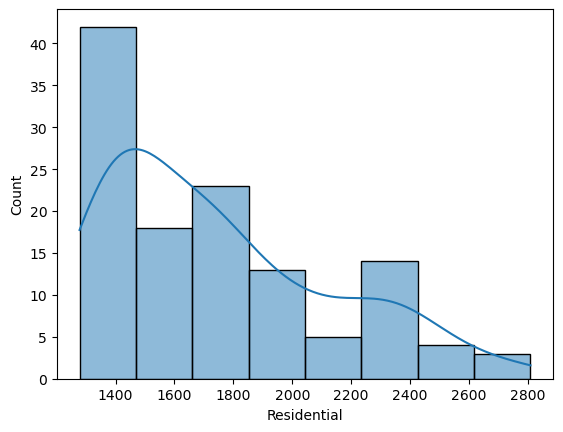

In [108]:
#Checking the distribution of energy consumption in Residual sector
plot_Histogram(df_merged,'Residential')


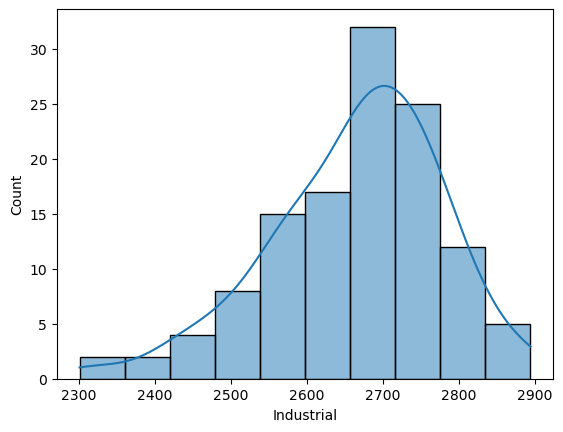

In [109]:
plot_Histogram(df_merged,'Industrial')

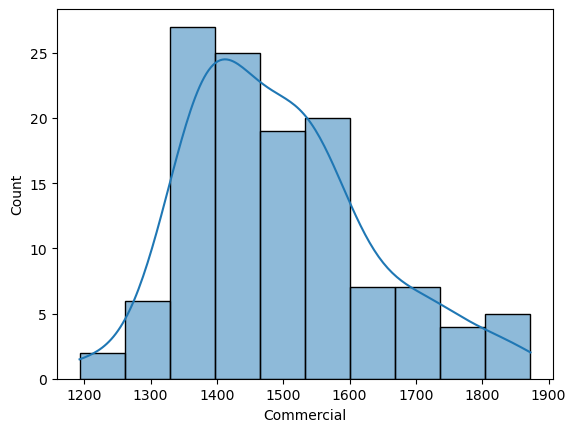

In [110]:
plot_Histogram(df_merged,'Commercial')

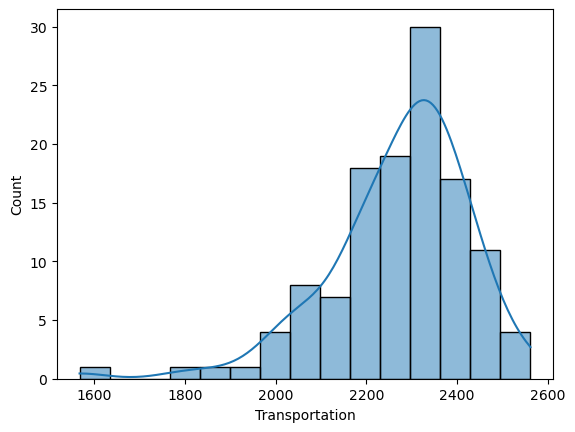

In [111]:
plot_Histogram(df_merged,'Transportation')

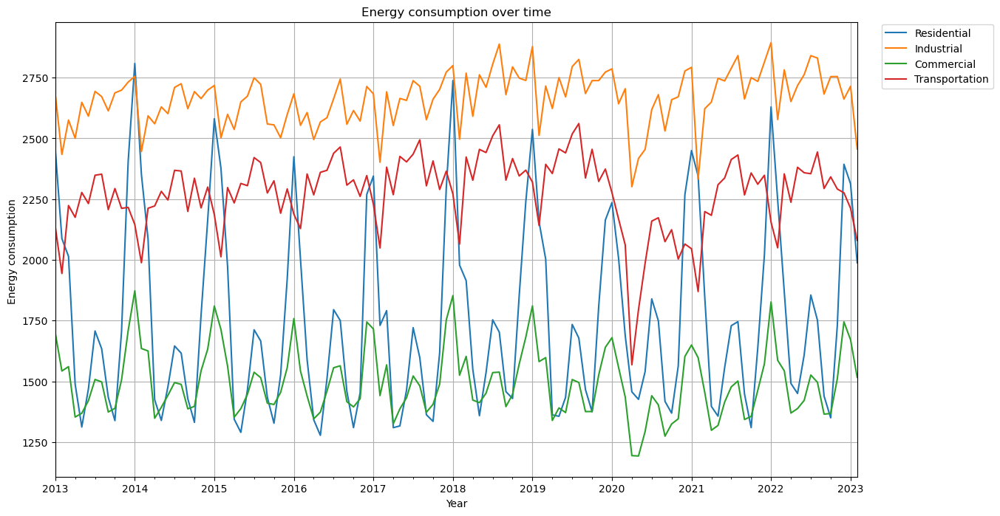

In [112]:
#Now we can check timeseries pattern for all sectors
#Set month as a index column
df_merged.set_index('Month').plot(figsize=(14,8))
plt.title('Energy consumption over time')
plt.legend(loc ='upper center', bbox_to_anchor =(1.1,1.0), ncol=1, borderaxespad =0.2)
plt.xlabel('Year')
plt.ylabel('Energy consumption ')
plt.grid(True)
plt.show()

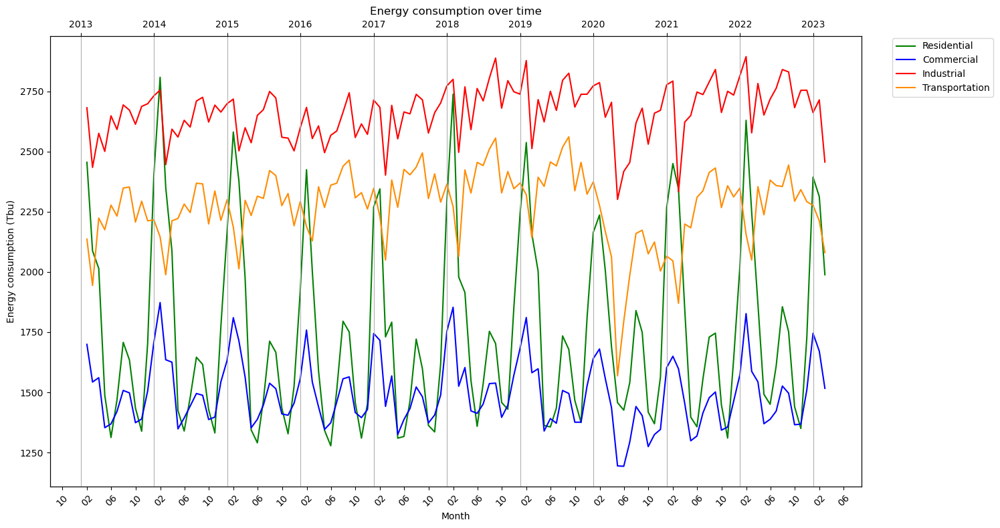

In [113]:
# Define columns to plot
sectors = ['Residential', 'Commercial', 'Industrial', 'Transportation']

# Colors for each sector, ensure this list is at least as long as `sectors`
colors = ['green', 'blue', 'red', 'darkorange']

fig, ax = plt.subplots(figsize=(15,8))

# Iterate over each sector and plot it
for sector, color in zip(sectors, colors):
    ax.plot(df_merged['Month'], df_merged[sector], label=sector, color=color)

# Add title, labels, and legend
plt.title('Energy consumption over time')
plt.xlabel('Month')
plt.ylabel('Energy consumption (Tbu)')
plt.legend(loc ='upper center', bbox_to_anchor=(1.1, 1.0), ncol=1, borderaxespad=0.2)
# Format x-axis labels to display months
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=4))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m'))
plt.xticks(rotation=45) 

# Create a second x-axis at the top of the figure
ax2 = ax.twiny()

# Set the limits of the new axis from the original axis's limits
ax2.set_xlim(ax.get_xlim())

# Add major ticks in the second x-axis at the positions where the year changes
ax2.xaxis.set_major_locator(mdates.YearLocator())
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Rotate the labels for better visibility
plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

plt.grid(True)
plt.tight_layout()  # Adjust layout for better appearance
plt.show()

In [114]:
#Now we are checking timeseries for only specific variable

def Timeseries_plot(df,column_name_index,column_sector,color_name,Label):
    
    #create a figure with a specified size 
    fig,ax = plt.subplots(figsize=(25,12))

    #create the plot on the figure
    ax.plot(df_merged[column_name_index],df_merged[column_sector], color =color_name)

    #set the title and labels
    plt.title(Label +' Energy consumption over time')

    plt.xlabel('Month')
    plt.ylabel('Energy consumption(Tbu)')

    # Format x-axis labels to display  months
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m'))
    # Rotate the axis for better visibility
    plt.xticks(rotation=45) 


    # Create a second x-axis at the top of the figure
    ax2 = ax.twiny()

    # Set the limits of the new axis from the original axis's limits
    ax2.set_xlim(ax.get_xlim())

    # Add major ticks in the second x-axis at the positions where the year changes
    ax2.xaxis.set_major_locator(mdates.YearLocator())
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Rotate the labels for better visibility
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

    plt.grid(True)
    plt.show()

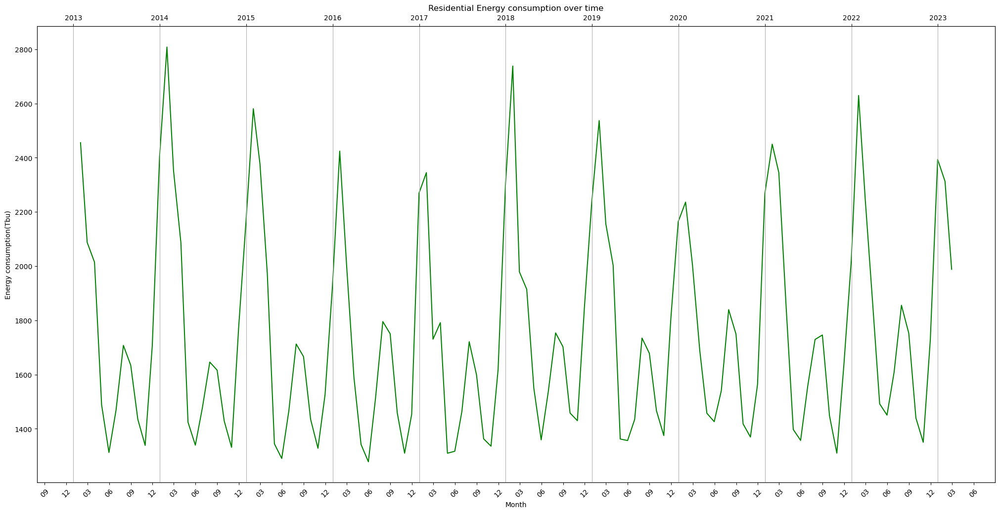

In [115]:
Timeseries_plot(df_merged,'Month','Residential','green','Residential')

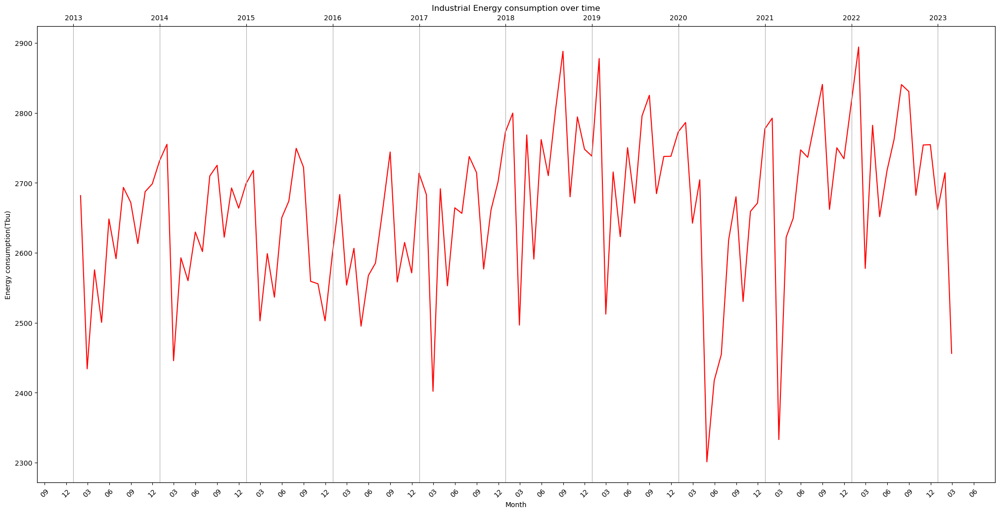

In [116]:
Timeseries_plot(df_merged,'Month','Industrial','red','Industrial')

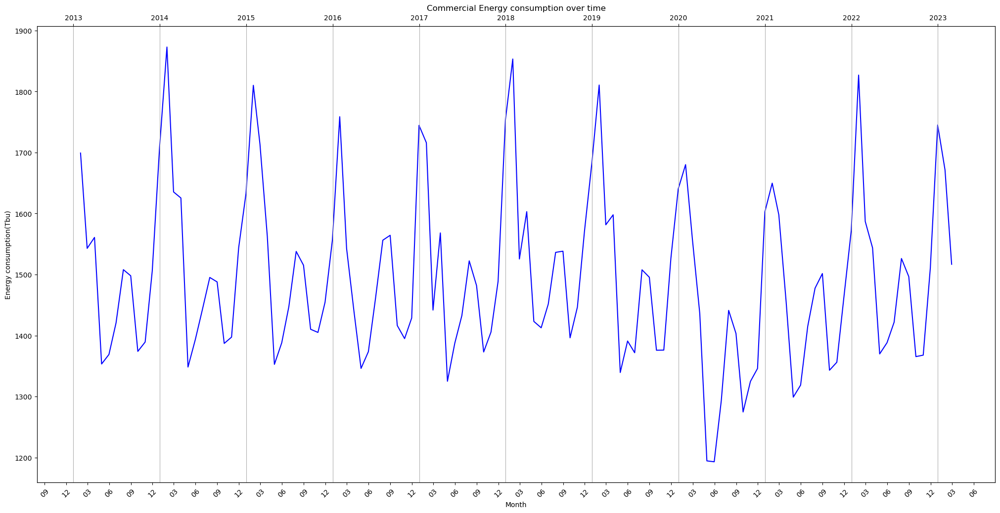

In [117]:
Timeseries_plot(df_merged,'Month','Commercial','blue','Commercial')

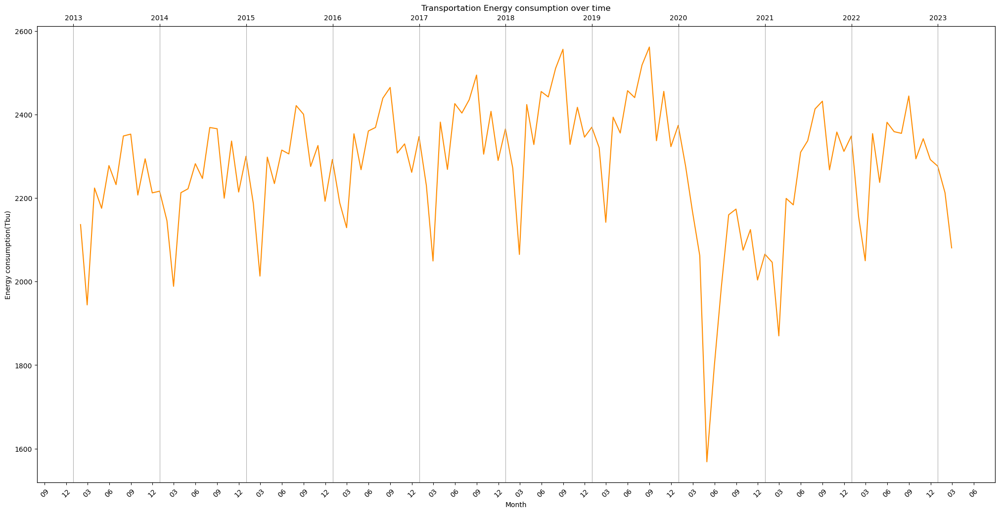

In [118]:
Timeseries_plot(df_merged,'Month','Transportation','darkorange','Transportation')

In [119]:
#Check stationarity for applying ARIMA method
def test_stationarity(timeseries):
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)' % key] = value
    print(dfoutput)

for column in df_merged.columns:
    print(f"\nTesting stationarity of '{column}' series")
    test_stationarity(df_merged[column])


Testing stationarity of 'Month' series
Results of Dickey-Fuller Test:
Test Statistic                  -0.284105
p-value                          0.927726
#Lags Used                      12.000000
Number of Observations Used    109.000000
Critical Value (1%)             -3.491818
Critical Value (5%)             -2.888444
Critical Value (10%)            -2.581120
dtype: float64

Testing stationarity of 'Residential' series
Results of Dickey-Fuller Test:
Test Statistic                  -1.994593
p-value                          0.288949
#Lags Used                      12.000000
Number of Observations Used    109.000000
Critical Value (1%)             -3.491818
Critical Value (5%)             -2.888444
Critical Value (10%)            -2.581120
dtype: float64

Testing stationarity of 'Industrial' series
Results of Dickey-Fuller Test:
Test Statistic                  -2.184865
p-value                          0.211784
#Lags Used                      12.000000
Number of Observations Used    1

In [120]:
#first difference to make stationary
df_diff = df_merged.diff().dropna()

In [121]:
df_diff

,Month,Residential,Industrial,Commercial,Transportation
1,28 days,-367.731,-247.613,-156.243,-192.247
2,31 days,-73.143,141.506,17.905,279.792
3,30 days,-526.273,-75.119,-207.421,-48.564
4,31 days,-175.859,147.813,15.557,102.288
5,30 days,156.484,-56.751,51.802,-45.624
...,...,...,...,...,...
117,31 days,-89.909,72.043,2.415,48.092
118,30 days,379.404,0.405,142.916,-49.988
119,31 days,664.127,-92.847,234.335,-15.540
120,31 days,-80.532,52.743,-73.625,-63.772


In [122]:
#Checking again stationarity with new data df_diff
for column in df_diff.columns:
    if column != 'Month':
        print(f"\nTesting stationarity of differenced '{column}' series")
        test_stationarity(df_diff[column])


Testing stationarity of differenced 'Residential' series
Results of Dickey-Fuller Test:
Test Statistic                -1.341049e+01
p-value                        4.383661e-25
#Lags Used                     1.000000e+01
Number of Observations Used    1.100000e+02
Critical Value (1%)           -3.491245e+00
Critical Value (5%)           -2.888195e+00
Critical Value (10%)          -2.580988e+00
dtype: float64

Testing stationarity of differenced 'Industrial' series
Results of Dickey-Fuller Test:
Test Statistic                  -3.820634
p-value                          0.002703
#Lags Used                      12.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64

Testing stationarity of differenced 'Commercial' series
Results of Dickey-Fuller Test:
Test Statistic                  -2.987863
p-value                          0.036043
#Lags Used         

In [123]:
from statsmodels.tsa.stattools import acf, pacf

# Calculate and print ACF and PACF values for each series
for column in df_diff.columns:
    if column != 'Month':
        print(f"\nACF and PACF values for differenced '{column}' series")
        acf_values = acf(df_diff[column])
        pacf_values = pacf(df_diff[column])

        print('ACF Values:', acf_values)
        print('PACF Values:', pacf_values)


ACF and PACF values for differenced 'Residential' series
ACF Values: [ 1.          0.33447618 -0.24156271 -0.57911383 -0.32597228  0.16676563
  0.40705539  0.10875383 -0.3434932  -0.58041856 -0.19152332  0.37735251
  0.76042922  0.3162378  -0.20549297 -0.50469871 -0.27307222  0.15526753
  0.35695765  0.11162192 -0.31058717]
PACF Values: [ 1.          0.33726348 -0.40549268 -0.46000571 -0.09812662  0.1045639
  0.03663999 -0.2730933  -0.36814017 -0.5494042  -0.41934427 -0.29731459
  0.39115356  0.17868008  0.21750618  0.06827385 -0.102615   -0.28067172
 -0.32244655 -0.04774834  0.24445832]

ACF and PACF values for differenced 'Industrial' series
ACF Values: [ 1.         -0.51407521  0.18699155 -0.13603646 -0.15406578  0.32490081
 -0.35179635  0.30722033 -0.12597722 -0.15785709  0.28659773 -0.5050088
  0.71718305 -0.43492234  0.19142408 -0.08794164 -0.15216961  0.30105579
 -0.3314468   0.28587343 -0.11554683]
PACF Values: [ 1.         -0.51835917 -0.10742726 -0.11902    -0.37814041  0.11


ACF and PACF plots for differenced 'Residential' series


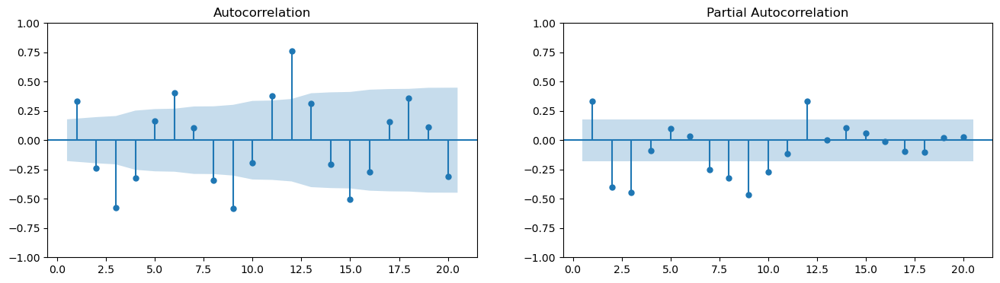


ACF and PACF plots for differenced 'Industrial' series


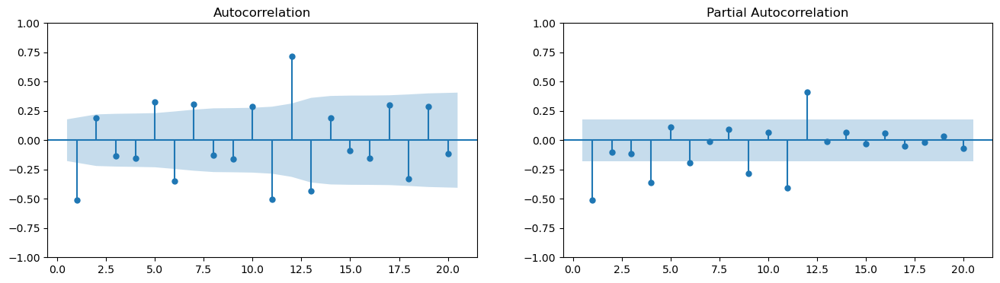


ACF and PACF plots for differenced 'Commercial' series


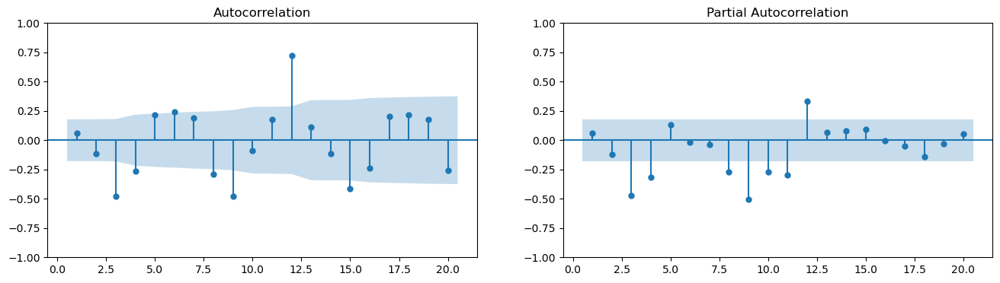


ACF and PACF plots for differenced 'Transportation' series


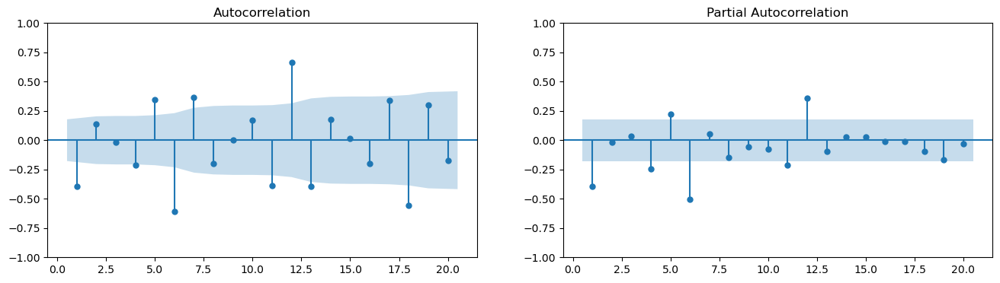

In [124]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Generate ACF and PACF plots for each series
for column in df_diff.columns:
    if column != 'Month':
        print(f"\nACF and PACF plots for differenced '{column}' series")
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 4))

        plot_acf(df_diff[column], lags=20, zero=False, ax=ax1)
        plot_pacf(df_diff[column], lags=20, zero=False, ax=ax2)

        plt.show()

In [125]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt


In [126]:
# Define a function to fit an ARIMA model and make predictions with 80-20 train and test data
def fit_and_forecast(data, order, split_ratio=0.8):
    # Split the data into training and testing sets
    train_size = int(len(data) * split_ratio)
    train, test = data[0:train_size], data[train_size:len(data)]
    
    # Fit the model
    model = ARIMA(train, order=order)
    model_fit = model.fit()
    print(model_fit.summary())

    # Make predictions (in-sample + out-of-sample forecasting)
    forecast = model_fit.forecast(steps=len(test))
    
    # Compute the root mean squared error (RMSE)
    rmse = sqrt(mean_squared_error(test, forecast))
    print(f'Root Mean Squared Error: {rmse}\n')
    
    # Visualization
    plt.figure(figsize=(12, 6))
    plt.plot(train, label='Training Data')
    plt.plot(test.index, test, label='Test Data')
    plt.plot(test.index, forecast, label='Predicted Data', color='red')
    plt.legend(loc='best')
    plt.title('Actual vs Predicted')
    plt.show()
    
    residuals = model_fit.resid
    plt.plot(residuals)
    plt.title('Residuals from ARIMA Model')
    plt.show()

    return model_fit, forecast, rmse



Fitting ARIMA model for differenced 'Month' series
                               SARIMAX Results                                
Dep. Variable:            Residential   No. Observations:                   97
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -654.493
Date:                Mon, 11 Sep 2023   AIC                           1318.987
Time:                        00:14:49   BIC                           1331.808
Sample:                             0   HQIC                          1324.169
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9953      0.007    149.356      0.000       0.982       1.008
ar.L2         -1.0000   6.79e-05  -1.47e+04      0.000      -1.000      -1.000


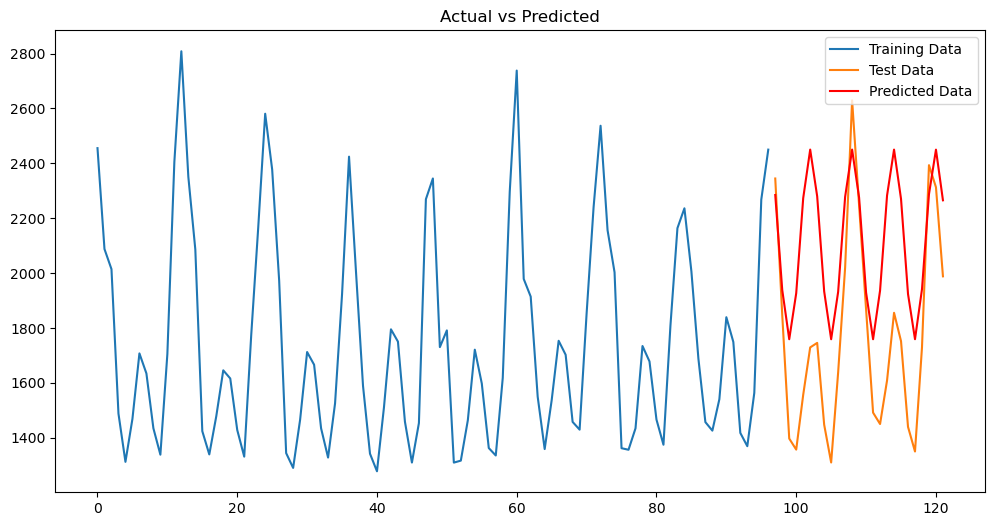

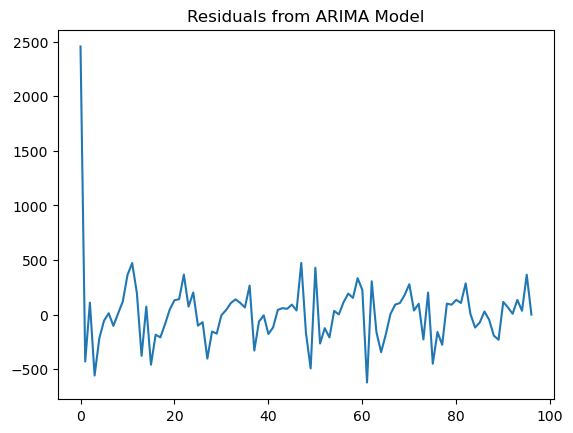


Fitting ARIMA model for differenced 'Residential' series
                               SARIMAX Results                                
Dep. Variable:            Residential   No. Observations:                   97
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -654.493
Date:                Mon, 11 Sep 2023   AIC                           1318.987
Time:                        00:14:49   BIC                           1331.808
Sample:                             0   HQIC                          1324.169
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9953      0.007    149.356      0.000       0.982       1.008
ar.L2         -1.0000   6.79e-05  -1.47e+04      0.000      -1.000      -

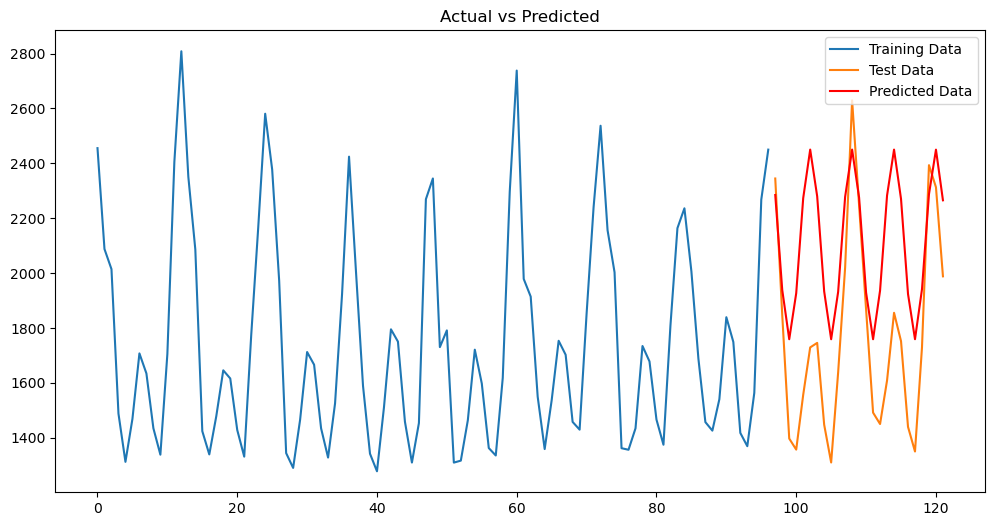

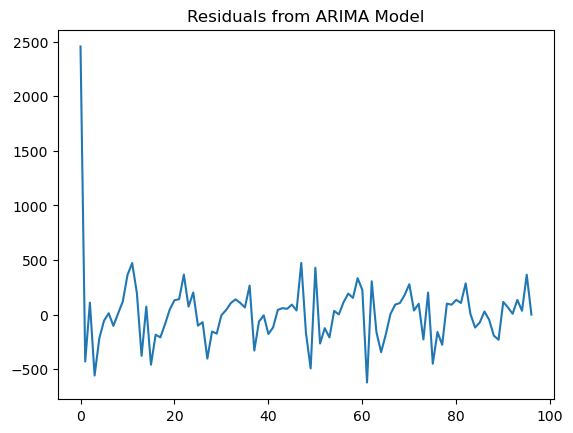


Fitting ARIMA model for differenced 'Industrial' series
                               SARIMAX Results                                
Dep. Variable:            Residential   No. Observations:                   97
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -654.493
Date:                Mon, 11 Sep 2023   AIC                           1318.987
Time:                        00:14:50   BIC                           1331.808
Sample:                             0   HQIC                          1324.169
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9953      0.007    149.356      0.000       0.982       1.008
ar.L2         -1.0000   6.79e-05  -1.47e+04      0.000      -1.000      -1

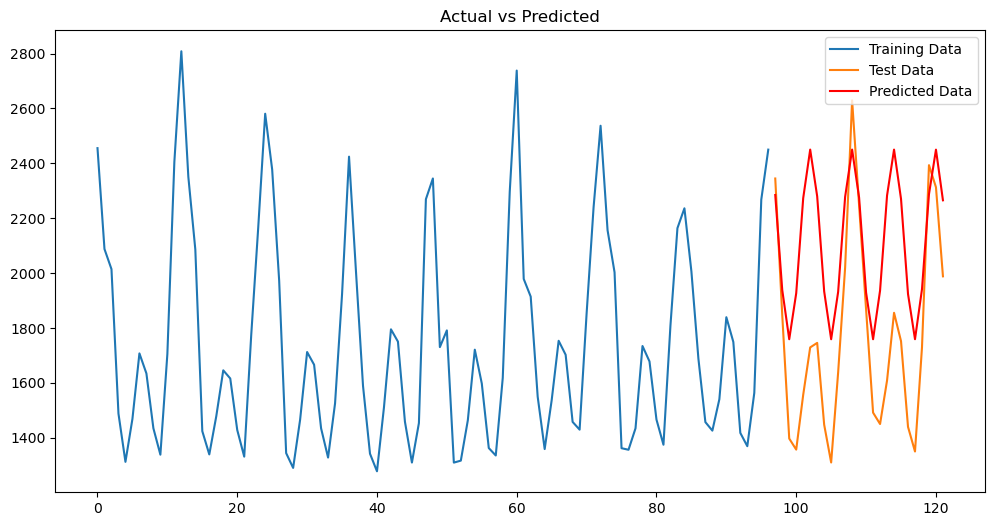

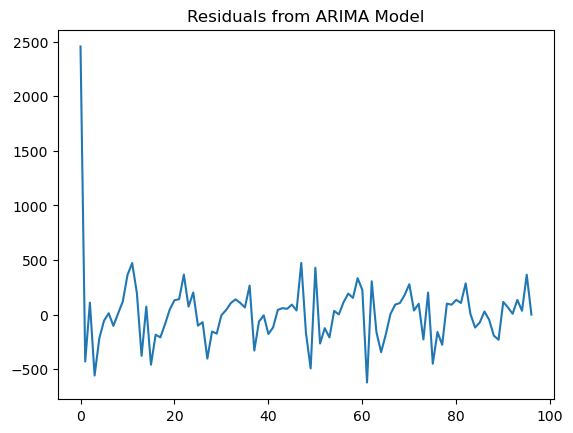


Fitting ARIMA model for differenced 'Commercial' series
                               SARIMAX Results                                
Dep. Variable:            Residential   No. Observations:                   97
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -654.493
Date:                Mon, 11 Sep 2023   AIC                           1318.987
Time:                        00:14:51   BIC                           1331.808
Sample:                             0   HQIC                          1324.169
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9953      0.007    149.356      0.000       0.982       1.008
ar.L2         -1.0000   6.79e-05  -1.47e+04      0.000      -1.000      -1

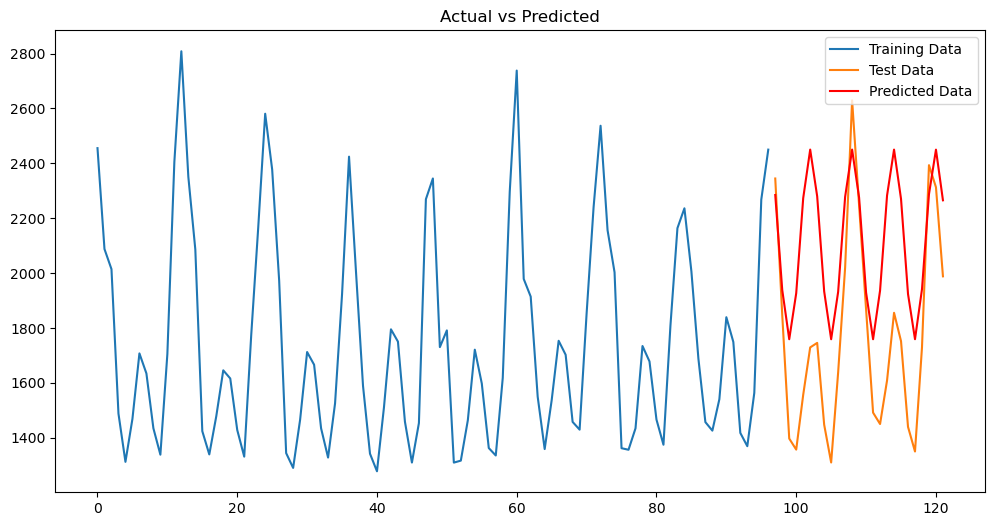

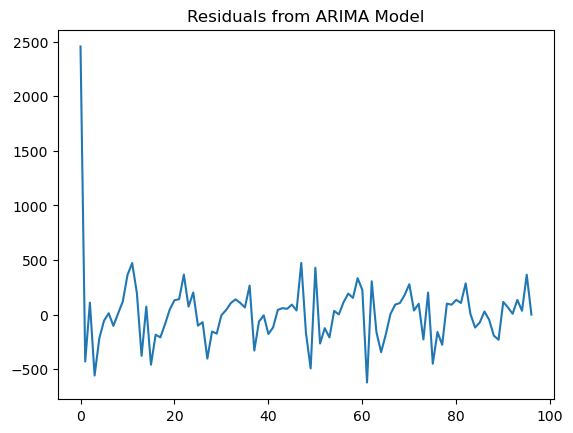


Fitting ARIMA model for differenced 'Transportation' series
                               SARIMAX Results                                
Dep. Variable:            Residential   No. Observations:                   97
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -654.493
Date:                Mon, 11 Sep 2023   AIC                           1318.987
Time:                        00:14:51   BIC                           1331.808
Sample:                             0   HQIC                          1324.169
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9953      0.007    149.356      0.000       0.982       1.008
ar.L2         -1.0000   6.79e-05  -1.47e+04      0.000      -1.000    

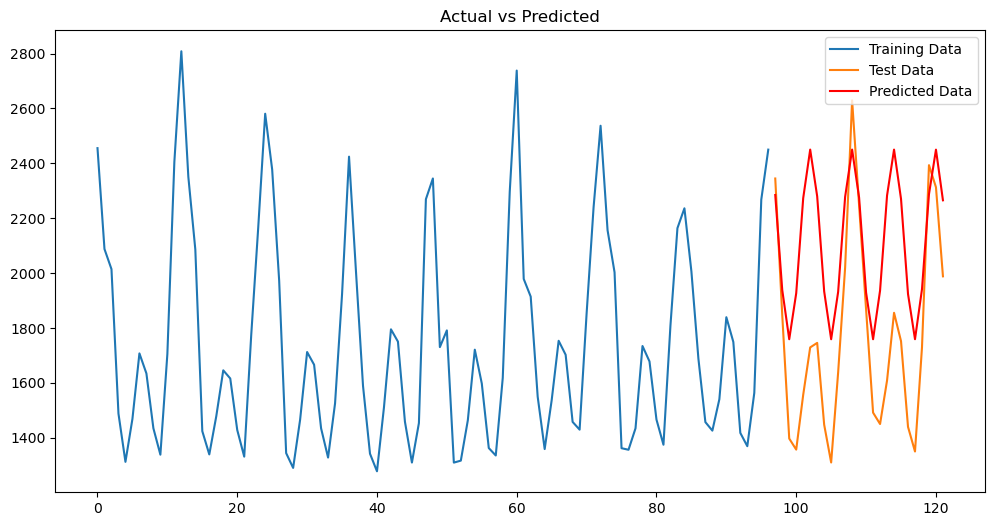

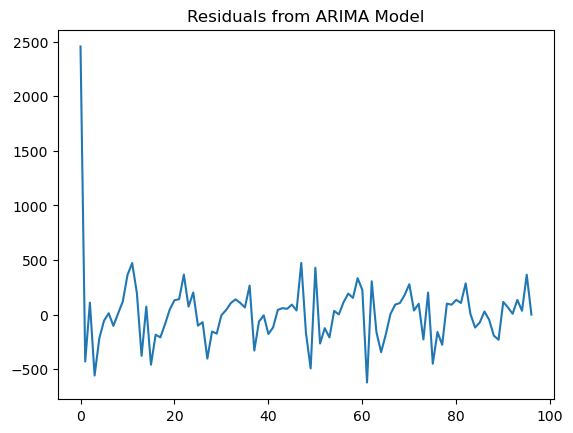

In [127]:
# For each series
for column in df_merged.columns:
    print(f"\nFitting ARIMA model for differenced '{column}' series")

    # Here we need to set the order of your ARIMA model, which can be determined by looking at the ACF and PACF plots
    # I'll use (1, 1, 1) as a placeholder, we need to replace it with the actual order
    order = (2, 1,2)

    fit_and_forecast(df_merged['Residential'], order)
    


ARIMA model for 'Residential' series
                               SARIMAX Results                                
Dep. Variable:            Residential   No. Observations:                   97
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -684.685
Date:                Mon, 11 Sep 2023   AIC                           1375.370
Time:                        00:14:52   BIC                           1383.063
Sample:                             0   HQIC                          1378.480
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0828      0.230      0.360      0.719      -0.368       0.534
ma.L1          0.3068      0.223      1.376      0.169      -0.130       0.744
sigma2      9.

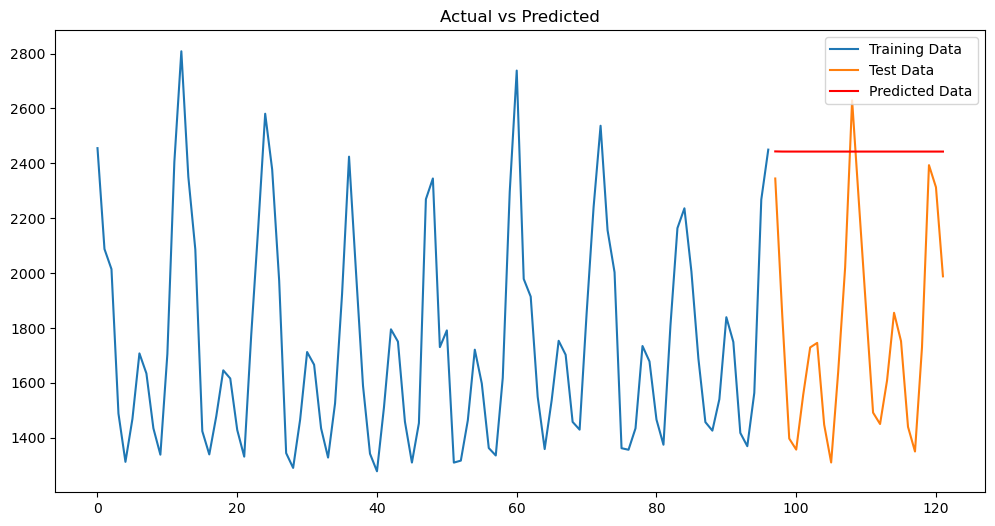

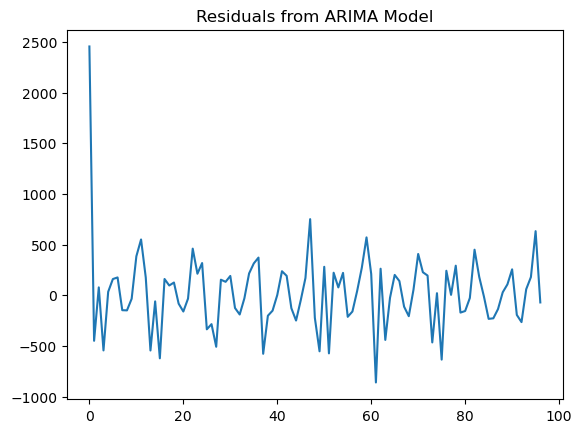


ARIMA model for 'Commercial' series
                               SARIMAX Results                                
Dep. Variable:             Commercial   No. Observations:                   97
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -602.575
Date:                Mon, 11 Sep 2023   AIC                           1211.150
Time:                        00:14:52   BIC                           1218.843
Sample:                             0   HQIC                          1214.260
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0000      0.005   -192.320      0.000      -1.010      -0.990
ma.L1          0.9985      0.164      6.095      0.000       0.677       1.320
sigma2      1.6

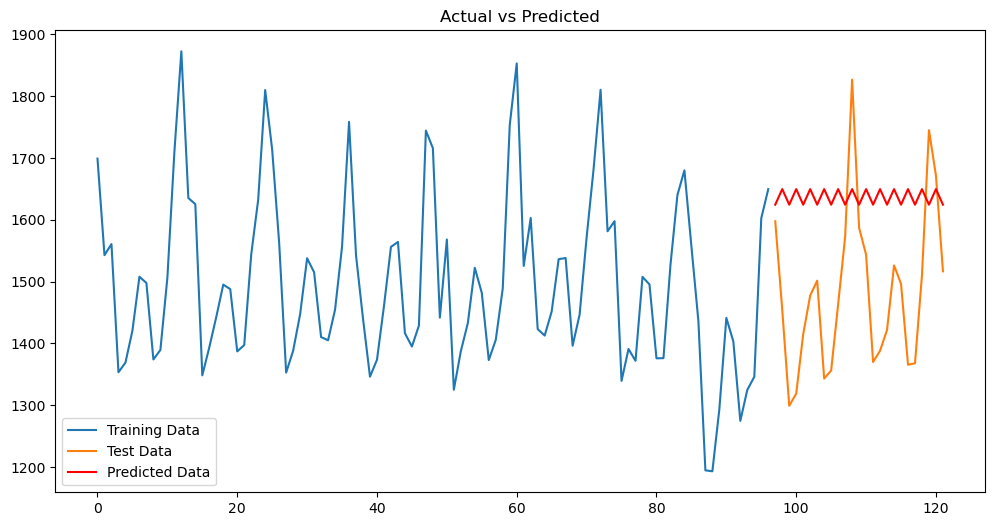

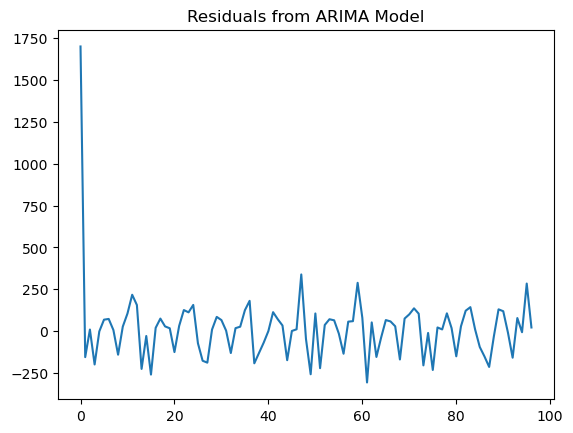


ARIMA model for 'Industrial' series
                               SARIMAX Results                                
Dep. Variable:             Industrial   No. Observations:                   97
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -583.119
Date:                Mon, 11 Sep 2023   AIC                           1172.237
Time:                        00:14:53   BIC                           1179.930
Sample:                             0   HQIC                          1175.347
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2030      0.104      1.956      0.050      -0.000       0.406
ma.L1         -0.9238      0.050    -18.521      0.000      -1.022      -0.826
sigma2       1.

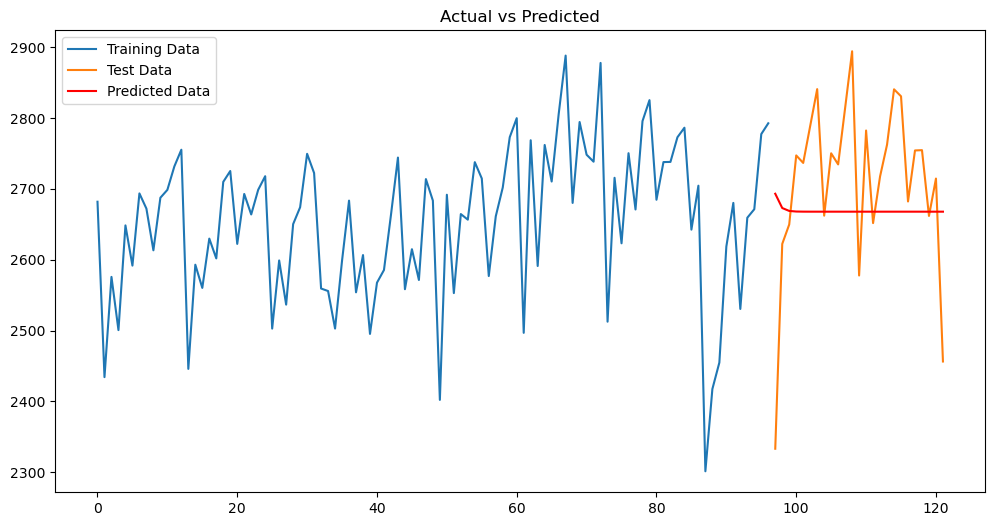

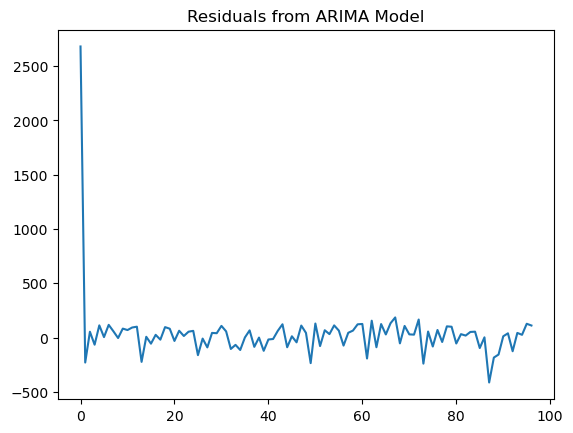


ARIMA model for 'Transportation' series
                               SARIMAX Results                                
Dep. Variable:         Transportation   No. Observations:                   97
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -601.030
Date:                Mon, 11 Sep 2023   AIC                           1208.059
Time:                        00:14:53   BIC                           1215.752
Sample:                             0   HQIC                          1211.169
                                 - 97                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3897      0.219     -1.783      0.075      -0.818       0.039
ma.L1         -0.0147      0.202     -0.073      0.942      -0.410       0.380
sigma2     

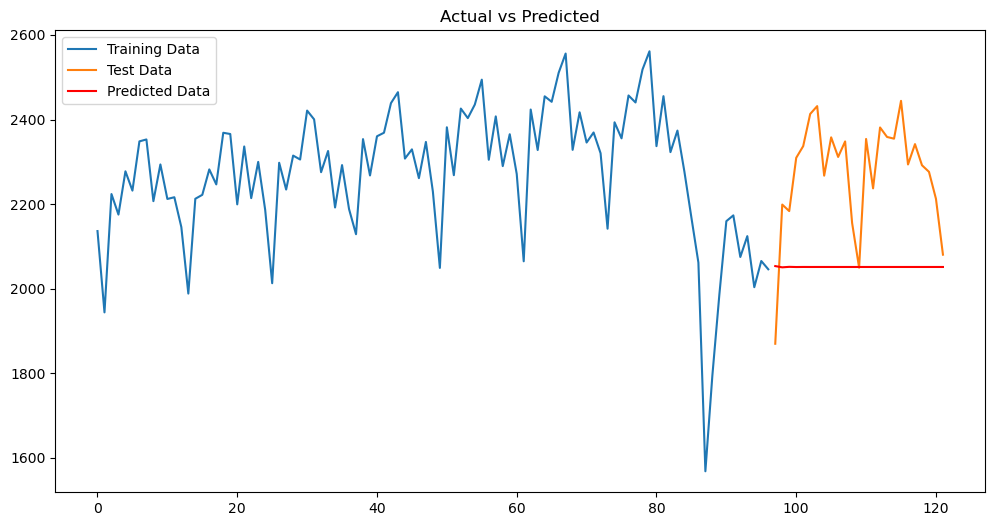

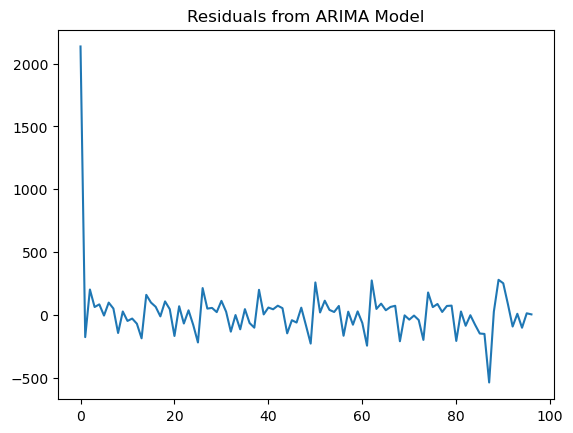

(<statsmodels.tsa.arima.model.ARIMAResultsWrapper at 0x23741639910>,
 97     2053.495999
 98     2050.555289
 99     2051.701145
 100    2051.254659
 101    2051.428633
 102    2051.360844
 103    2051.387258
 104    2051.376966
 105    2051.380976
 106    2051.379413
 107    2051.380022
 108    2051.379785
 109    2051.379877
 110    2051.379841
 111    2051.379855
 112    2051.379850
 113    2051.379852
 114    2051.379851
 115    2051.379852
 116    2051.379851
 117    2051.379852
 118    2051.379852
 119    2051.379852
 120    2051.379852
 121    2051.379852
 Name: predicted_mean, dtype: float64,
 257.51900366522557)

In [128]:
# Fit and forecast for 'Residential' series
print("\nARIMA model for 'Residential' series")
fit_and_forecast(df_merged['Residential'], order=(1, 1, 1))

# Fit and forecast for 'Commercial' series
print("\nARIMA model for 'Commercial' series")
fit_and_forecast(df_merged['Commercial'], order=(1, 1, 1))

# Fit and forecast for 'Industrial' series
print("\nARIMA model for 'Industrial' series")
fit_and_forecast(df_merged['Industrial'], order=(1, 1, 1))

# Fit and forecast for 'Transportation' series
print("\nARIMA model for 'Transportation' series")
fit_and_forecast(df_merged['Transportation'], order=(1, 1, 1))



ARIMA Results for Month:
Failed to fit ARIMA(1, 0, 1) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(1, 0, 2) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(2, 0, 1) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(2, 0, 2) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(0, 0, 1) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(0, 0, 2) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(1, 0, 0) for Month. Reason: ufunc 'subtract' cannot use operands with types dtype('<m8[ns]') and dtype('O')
Failed to fit ARIMA(2, 0, 0) for Month. Reason: ufunc 'subtract' cannot use op

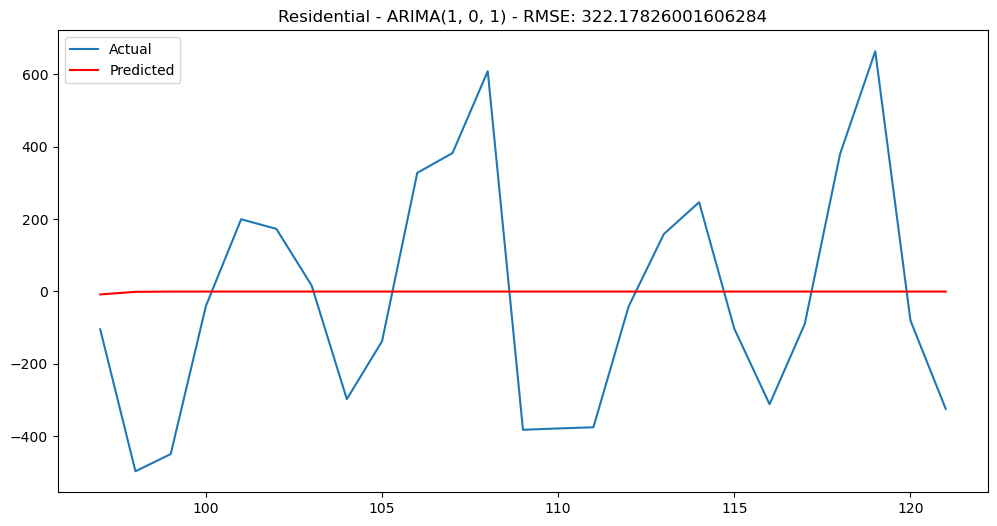

ARIMA(1, 0, 2) RMSE: 308.3424511778062


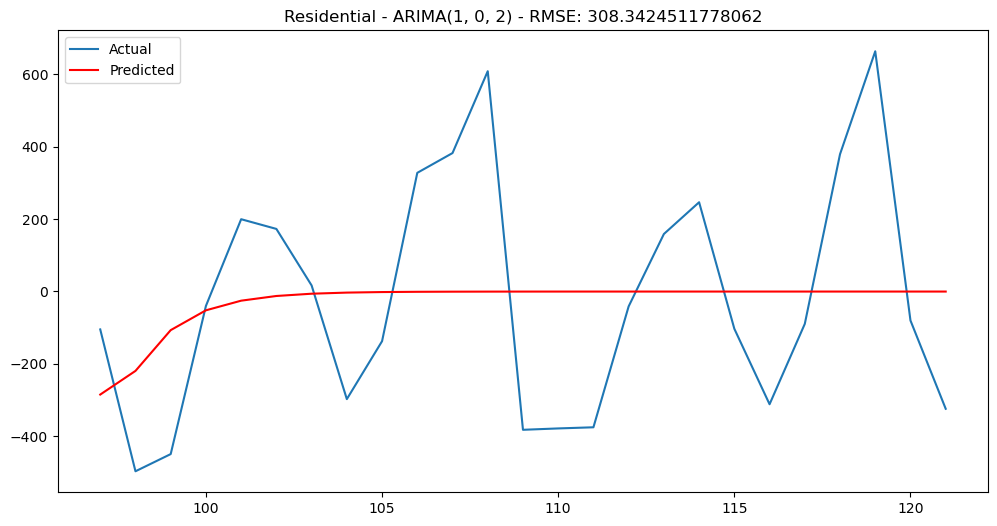

ARIMA(2, 0, 1) RMSE: 296.7568793177997


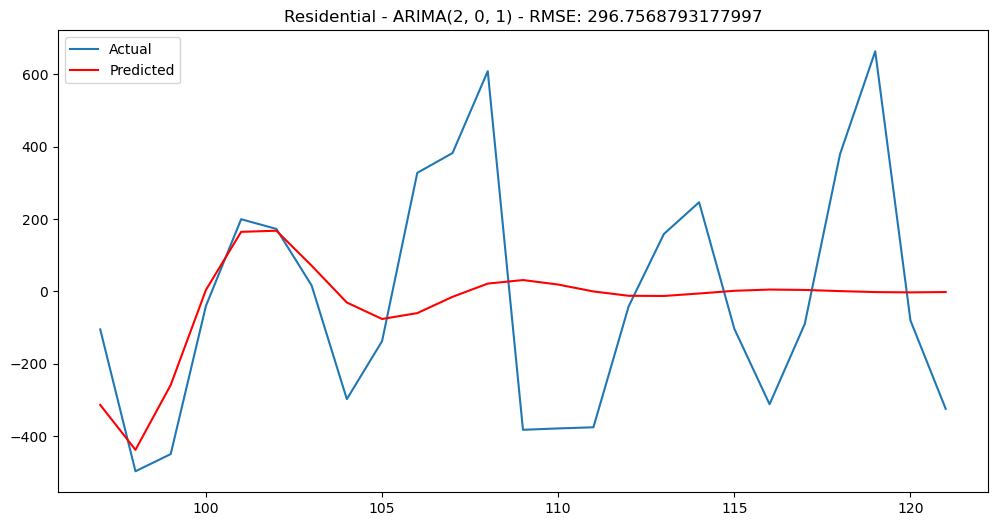

ARIMA(2, 0, 2) RMSE: 181.16692081573626


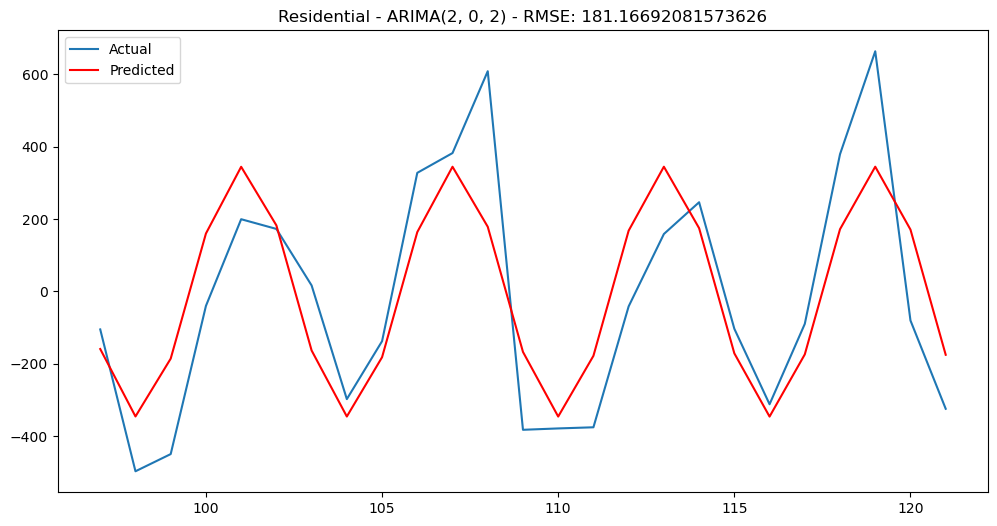

ARIMA(0, 0, 1) RMSE: 322.0725023730492


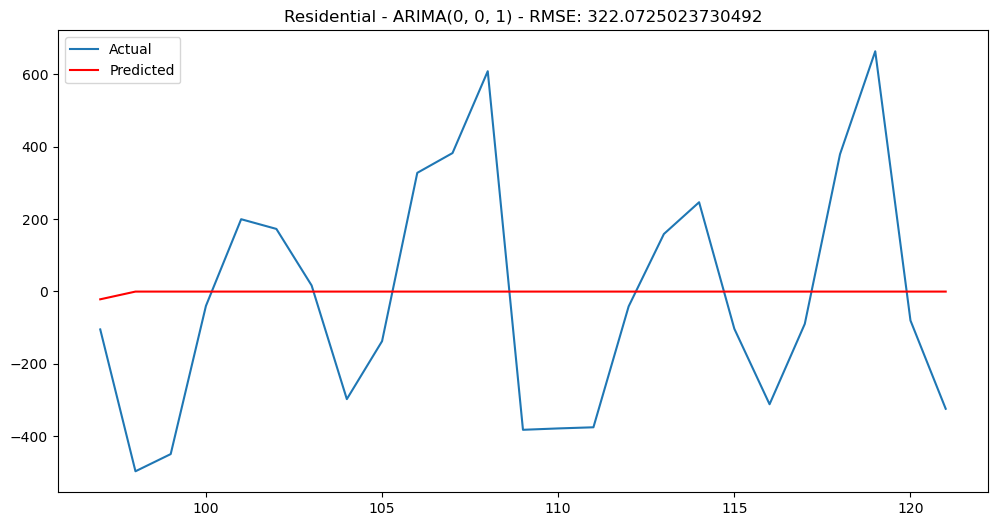

ARIMA(0, 0, 2) RMSE: 321.27677567345086


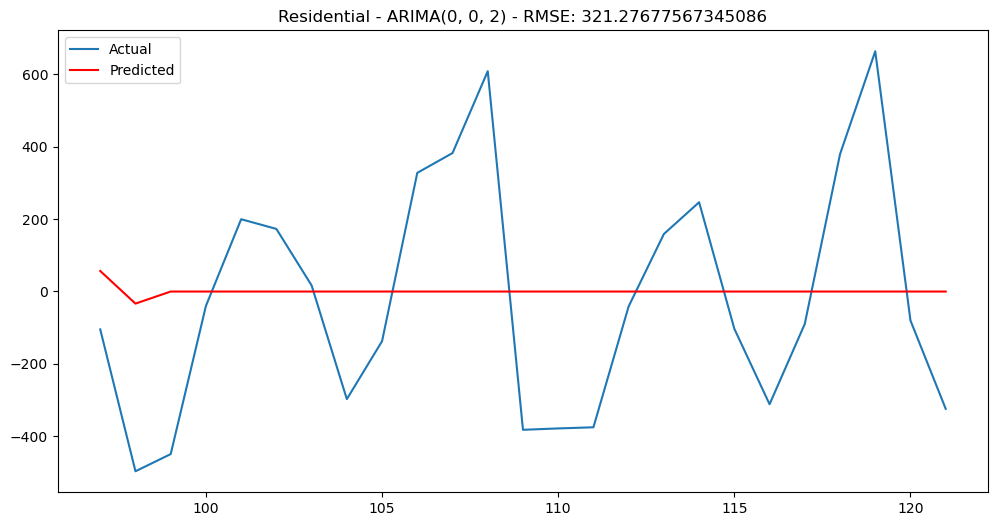

ARIMA(1, 0, 0) RMSE: 324.88547156045126


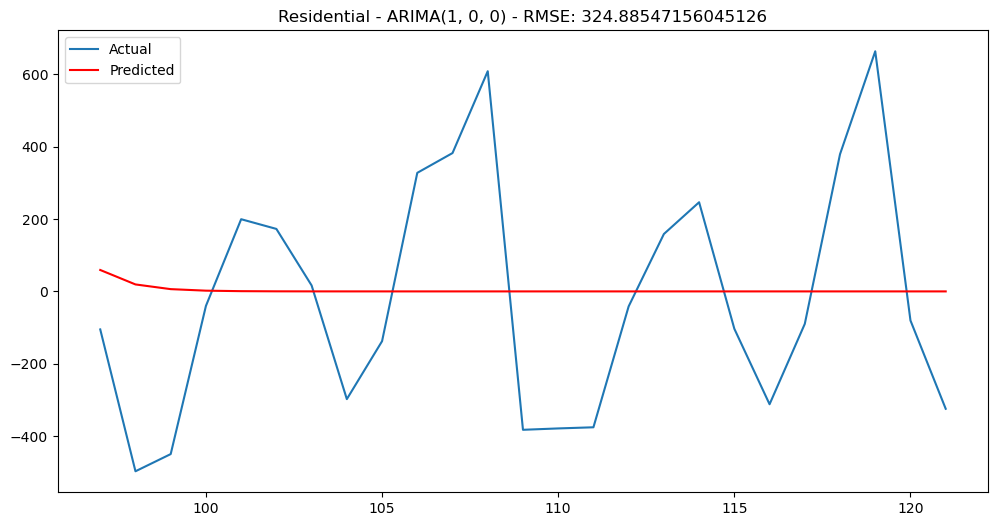

ARIMA(2, 0, 0) RMSE: 314.4592770591435


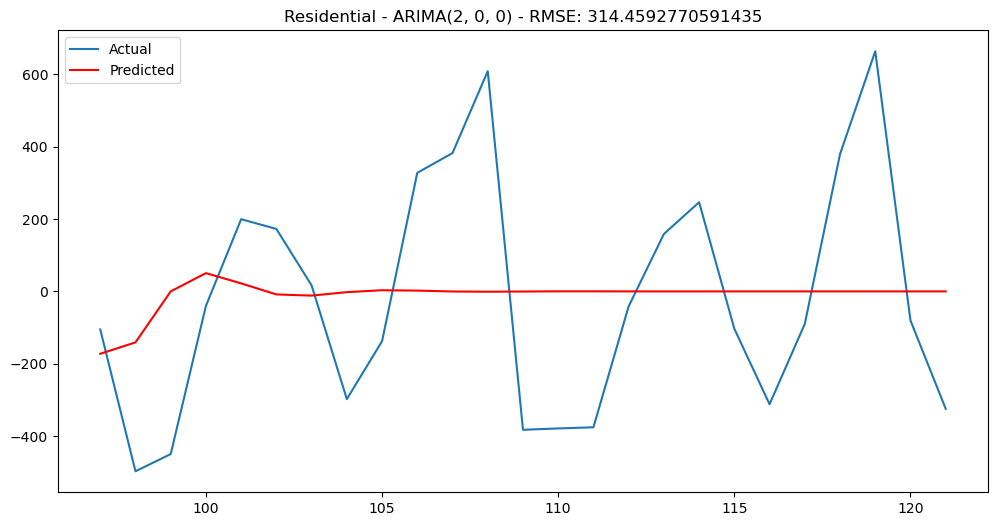


ARIMA Results for Industrial:
ARIMA(1, 0, 1) RMSE: 153.50585490463058


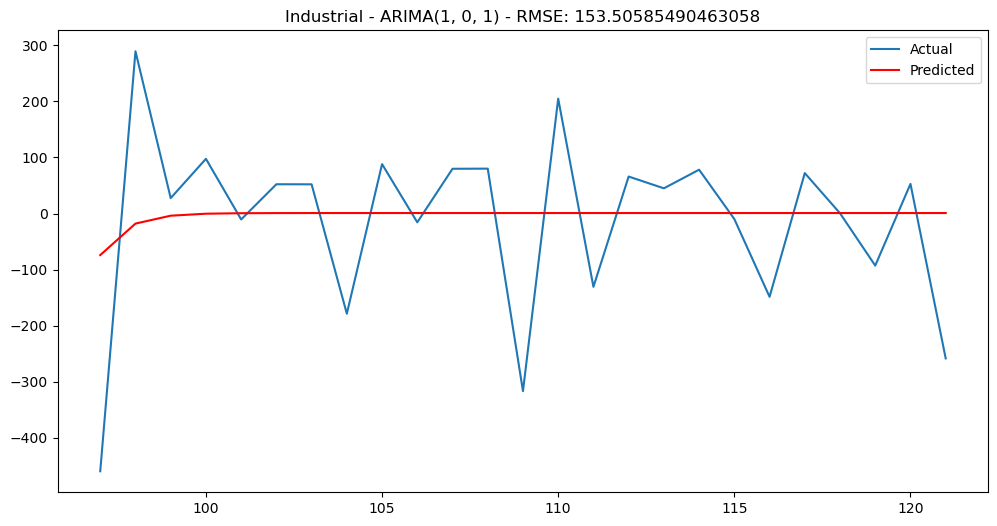

ARIMA(1, 0, 2) RMSE: 141.2257430330022


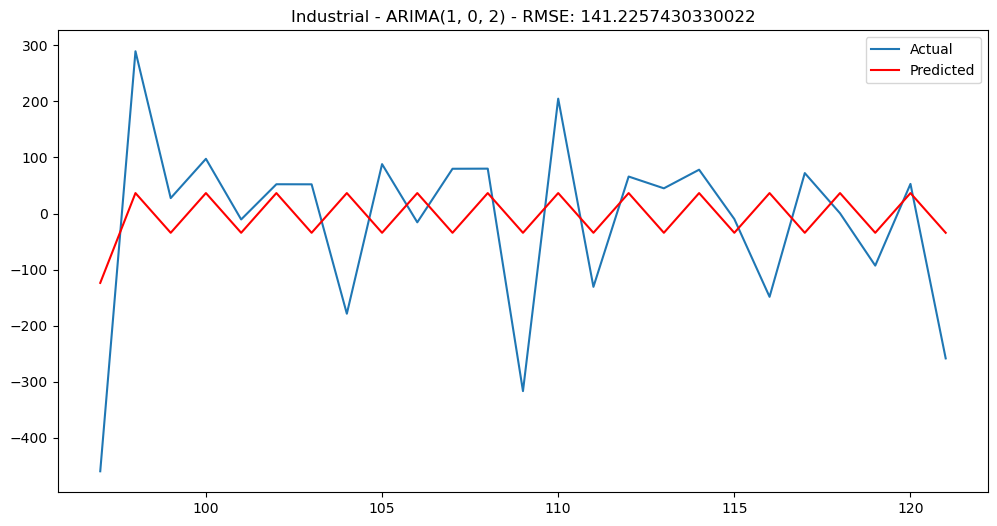

ARIMA(2, 0, 1) RMSE: 154.81771401280432


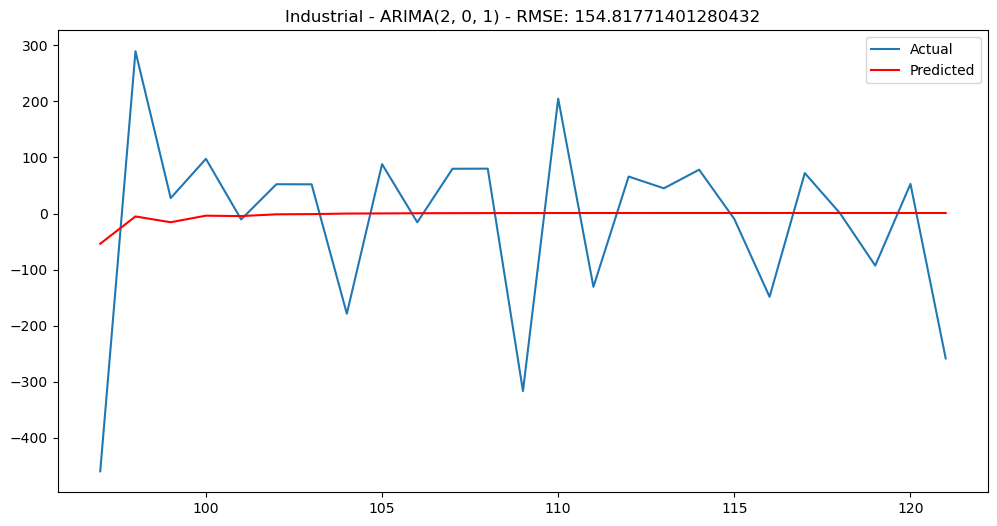

ARIMA(2, 0, 2) RMSE: 145.46623454242453


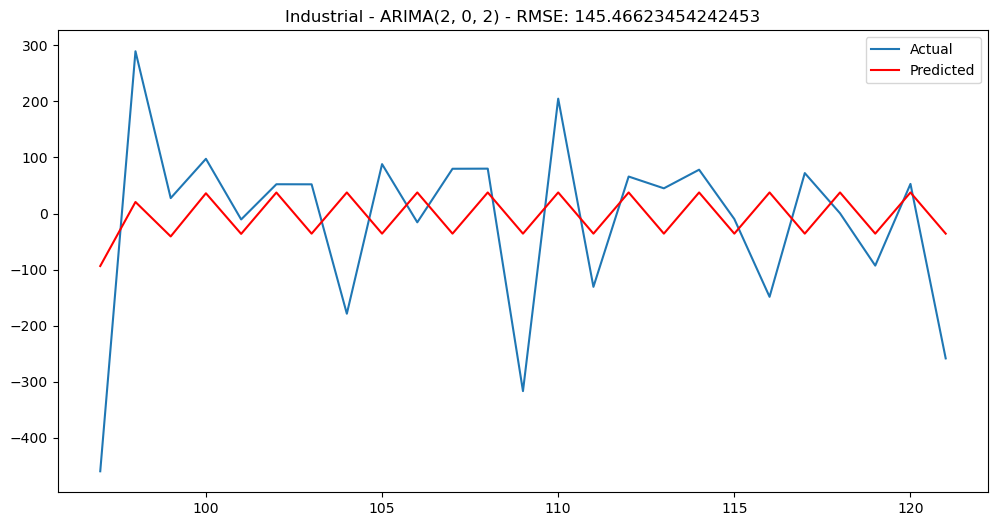

ARIMA(0, 0, 1) RMSE: 148.22985550893281


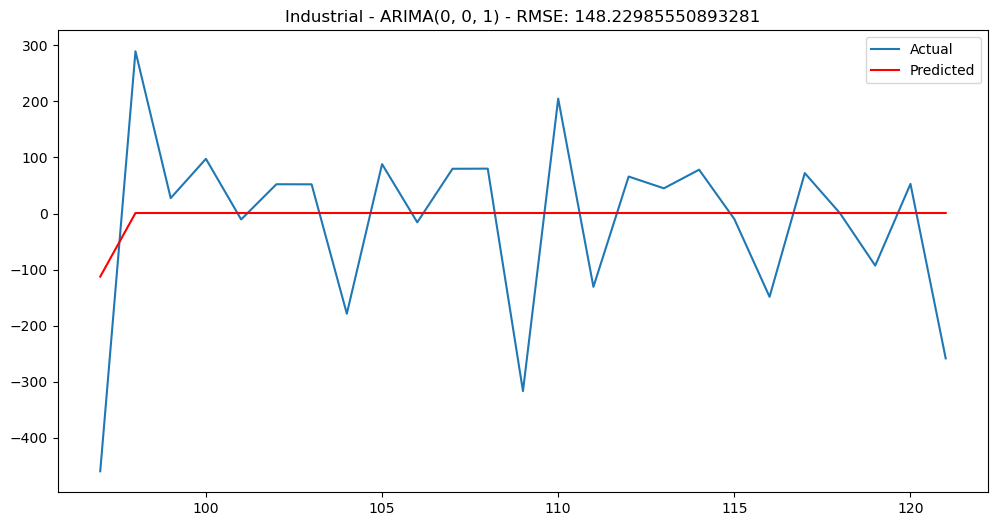

ARIMA(0, 0, 2) RMSE: 149.28722824442696


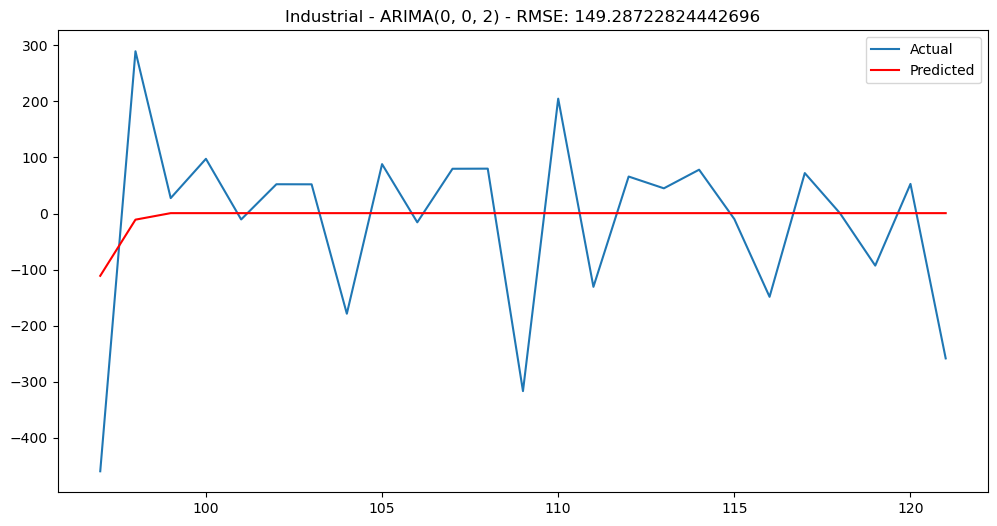

ARIMA(1, 0, 0) RMSE: 159.09290648457974


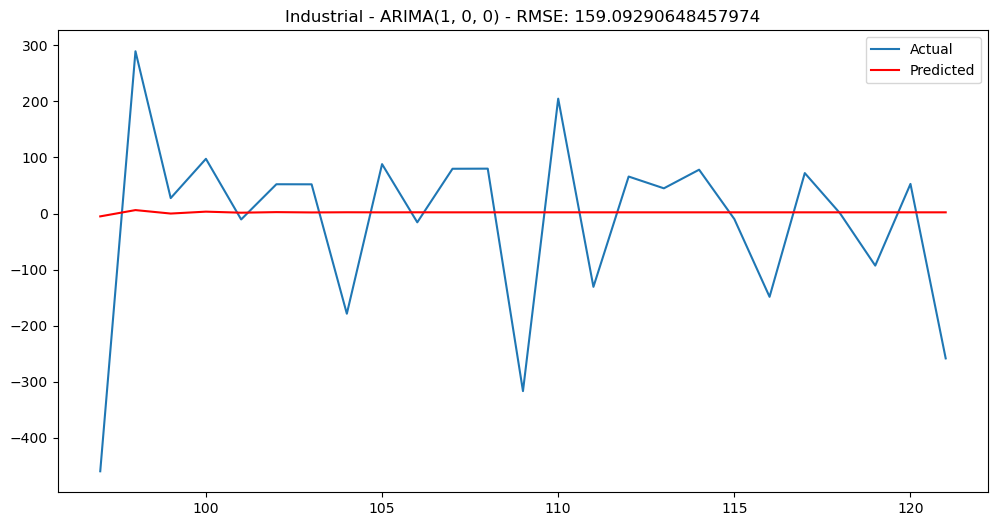

ARIMA(2, 0, 0) RMSE: 158.05366286748165


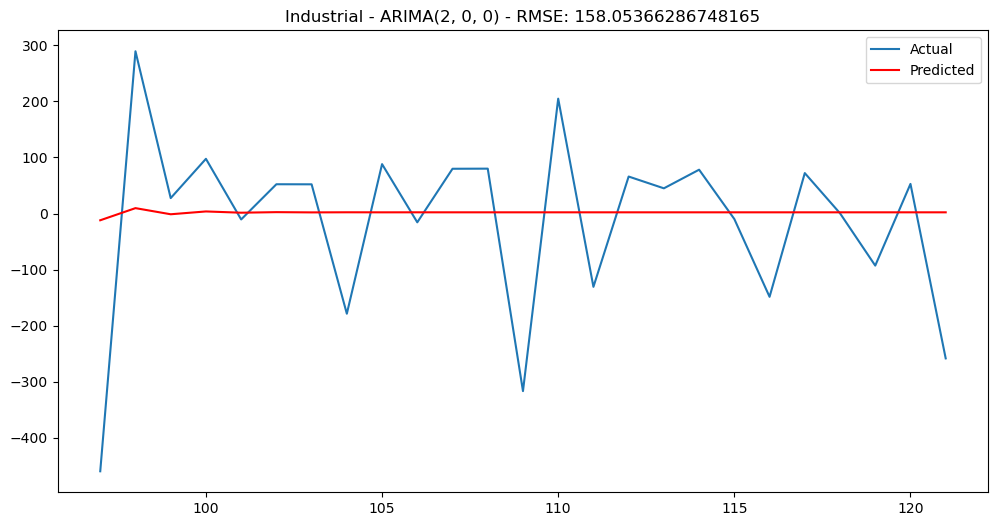


ARIMA Results for Commercial:
ARIMA(1, 0, 1) RMSE: 125.31007518840048


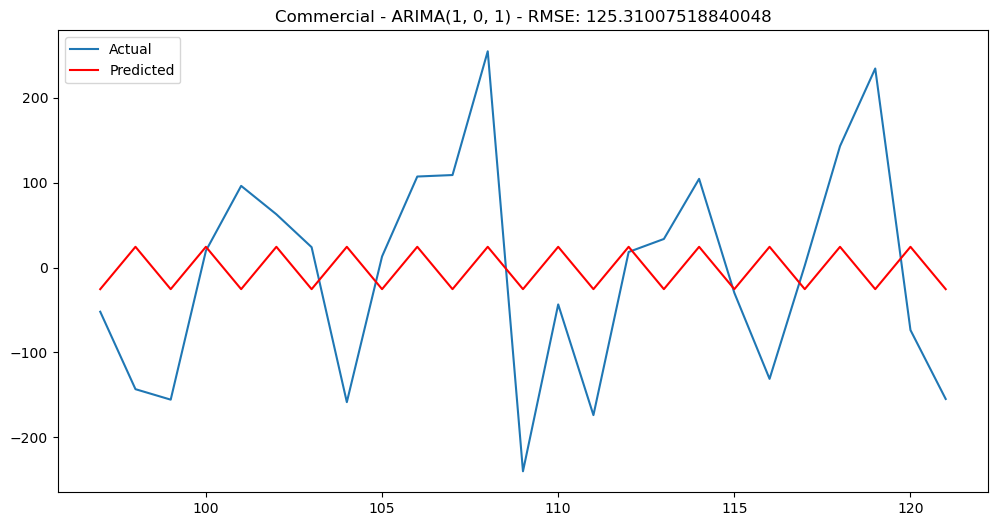

ARIMA(1, 0, 2) RMSE: 123.33419633211703


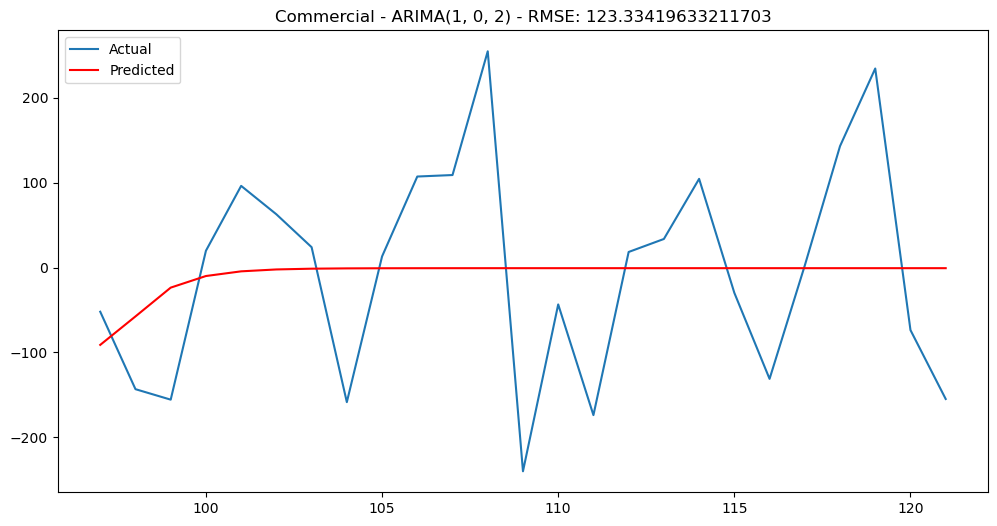

ARIMA(2, 0, 1) RMSE: 121.35244182094188


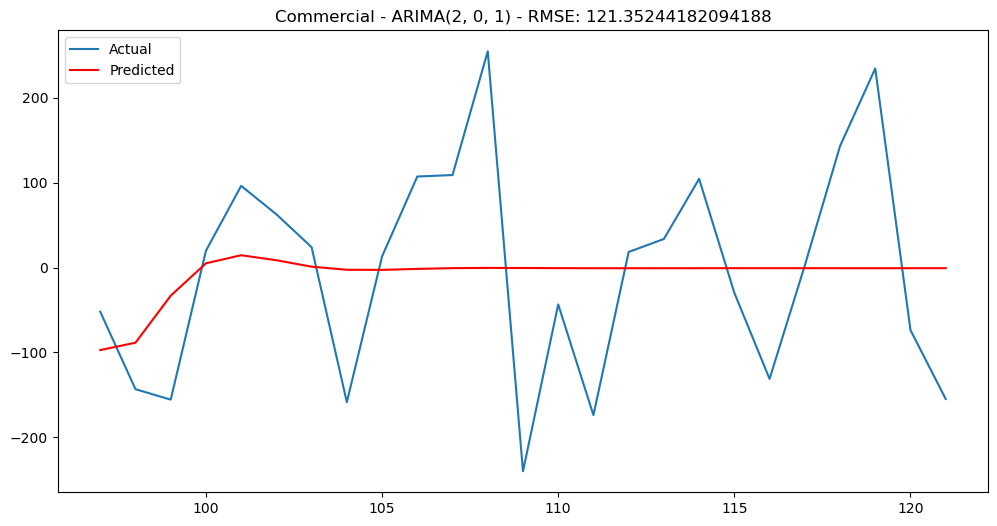

ARIMA(2, 0, 2) RMSE: 84.54135740772236


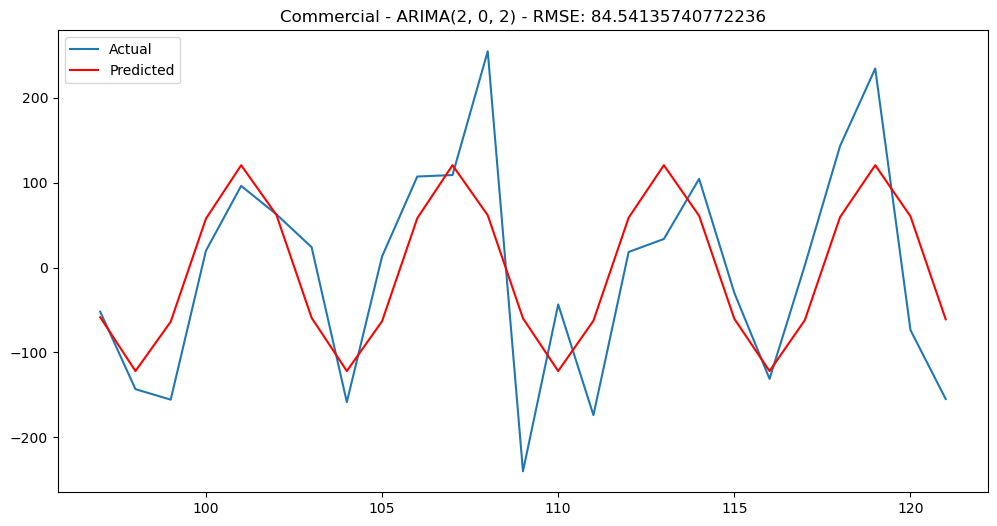

ARIMA(0, 0, 1) RMSE: 126.4552256259773


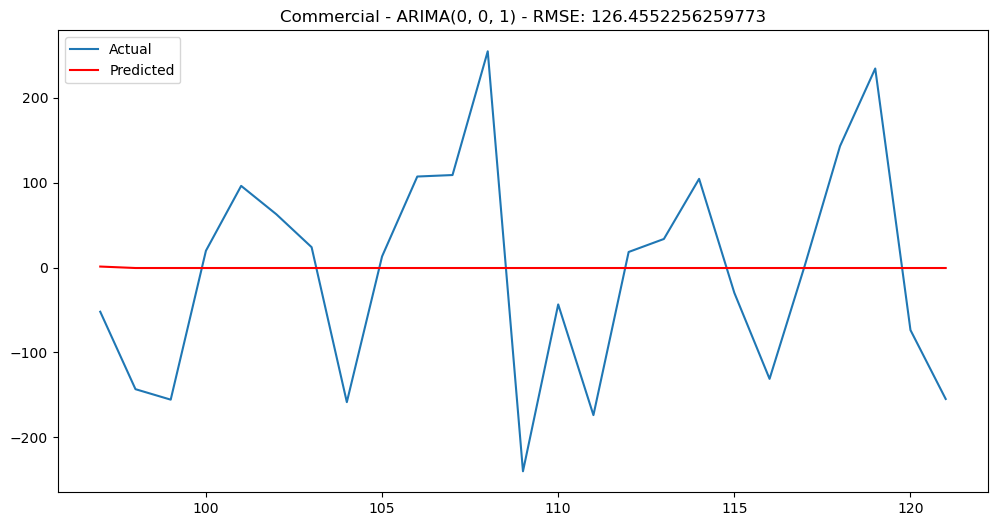

ARIMA(0, 0, 2) RMSE: 125.46218455838446


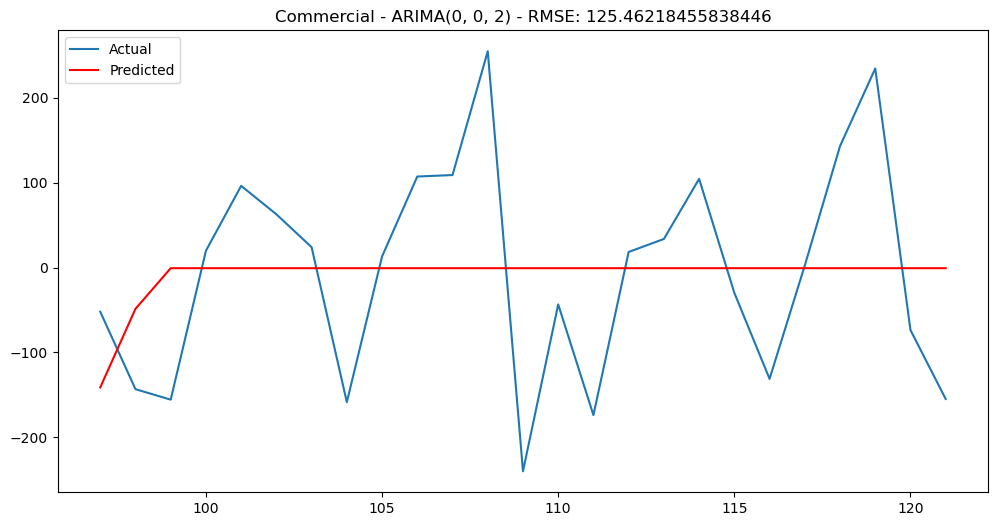

ARIMA(1, 0, 0) RMSE: 126.46701246469335


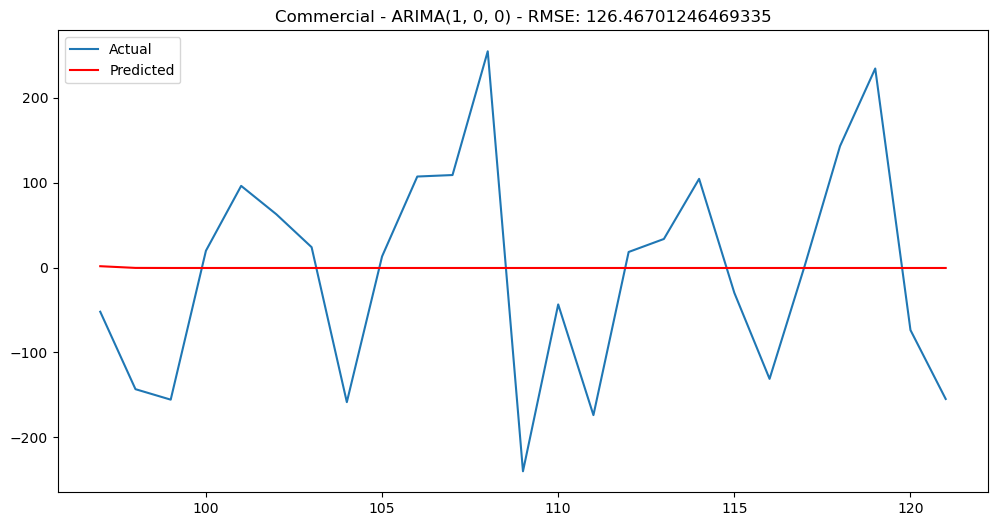

ARIMA(2, 0, 0) RMSE: 126.01786587081554


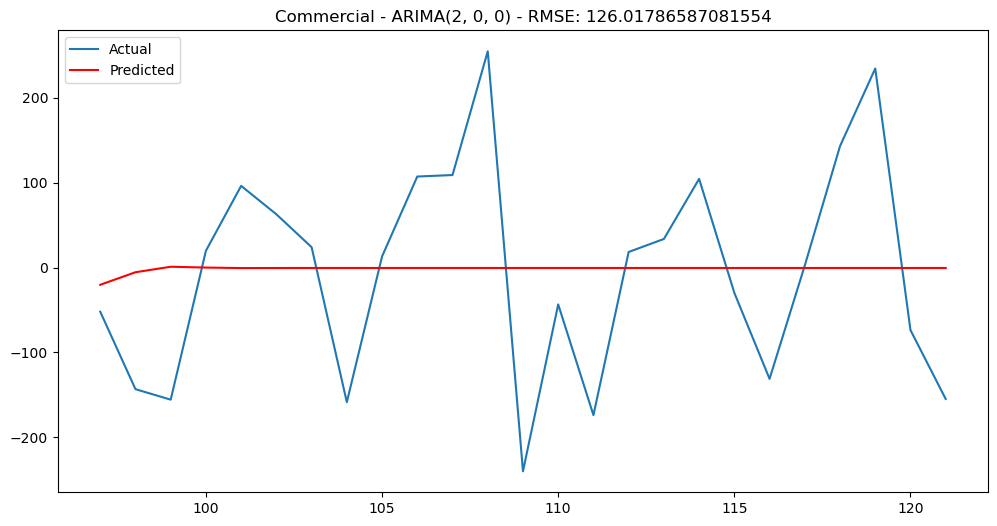


ARIMA Results for Transportation:
ARIMA(1, 0, 1) RMSE: 132.42730604335986


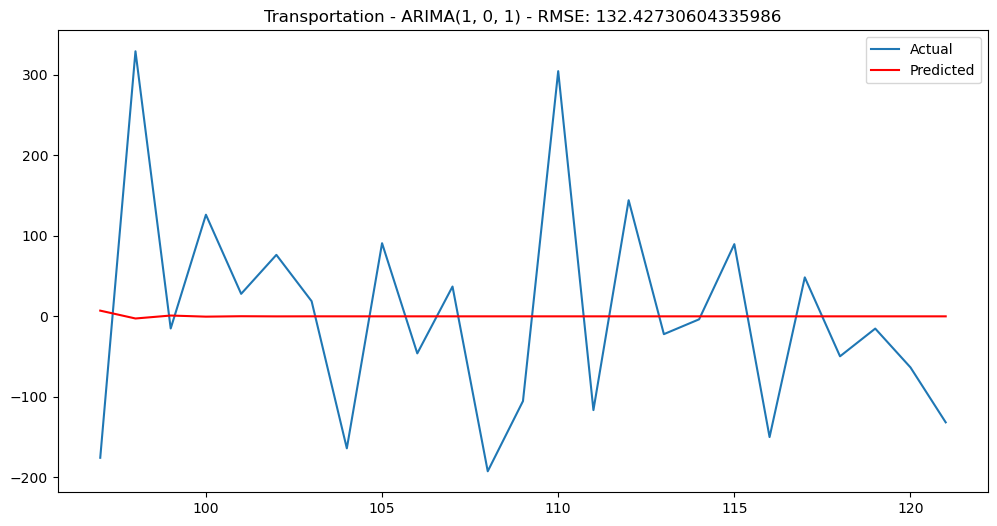

ARIMA(1, 0, 2) RMSE: 132.44560769637073


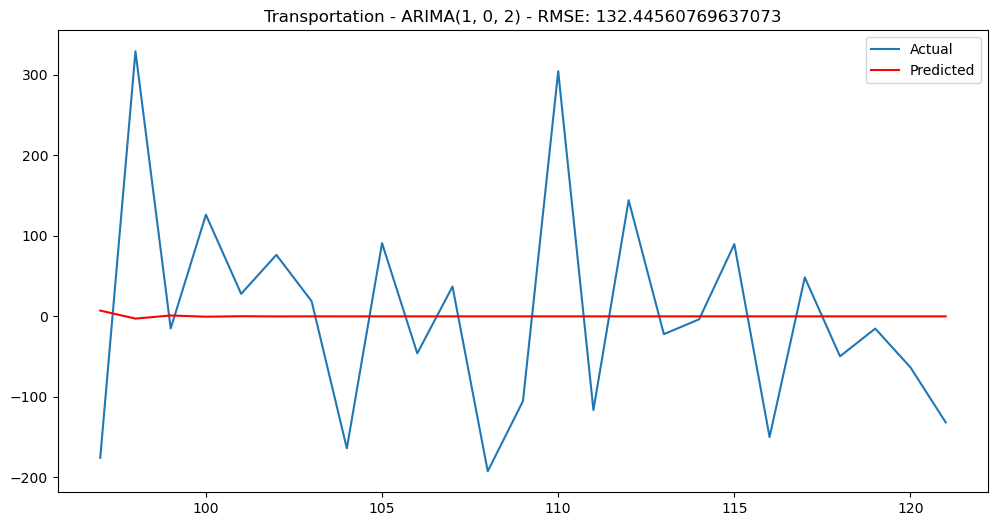

ARIMA(2, 0, 1) RMSE: 128.53938976689696


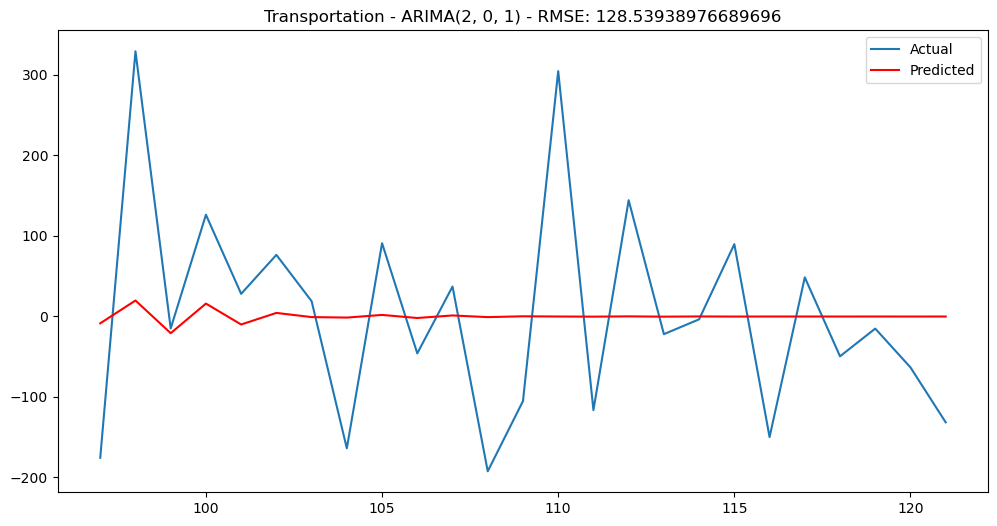

ARIMA(2, 0, 2) RMSE: 133.11871465563476


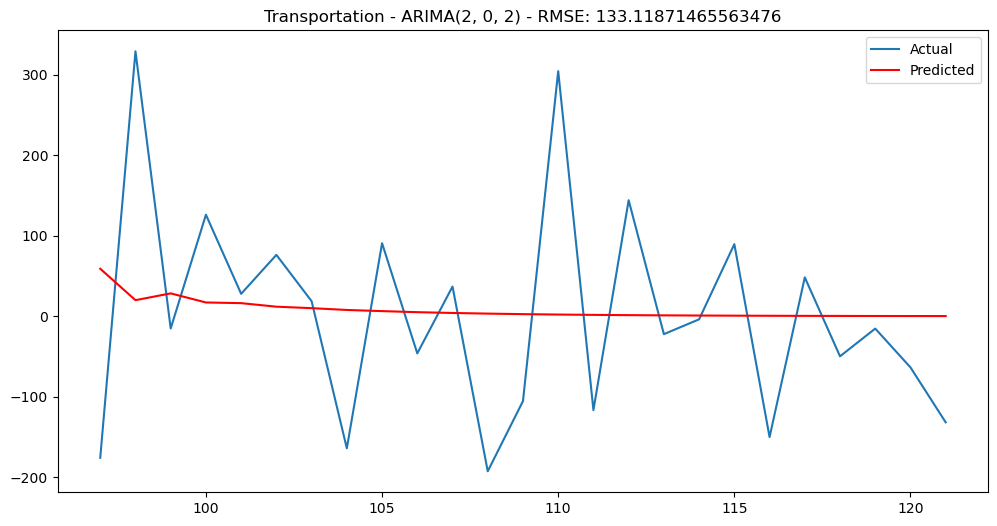

ARIMA(0, 0, 1) RMSE: 132.0055648233726


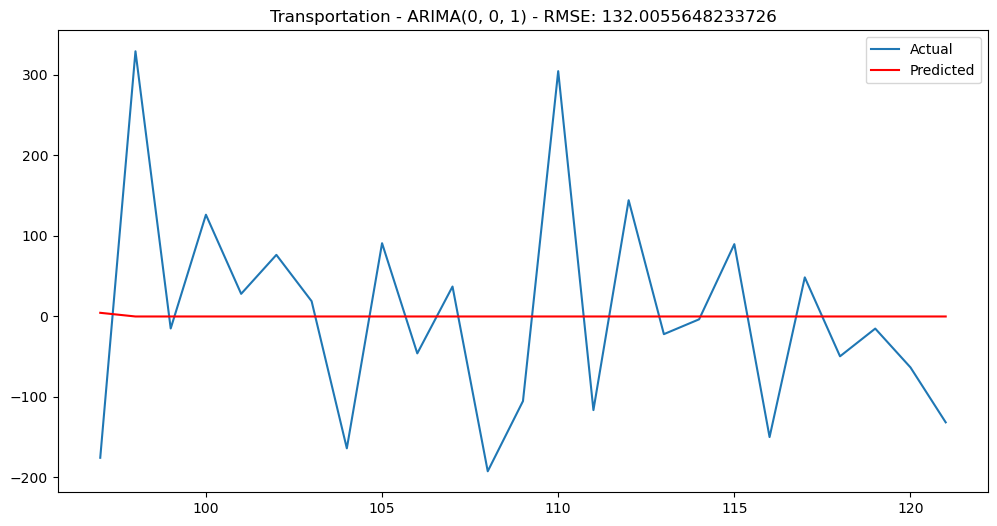

ARIMA(0, 0, 2) RMSE: 131.926892003648


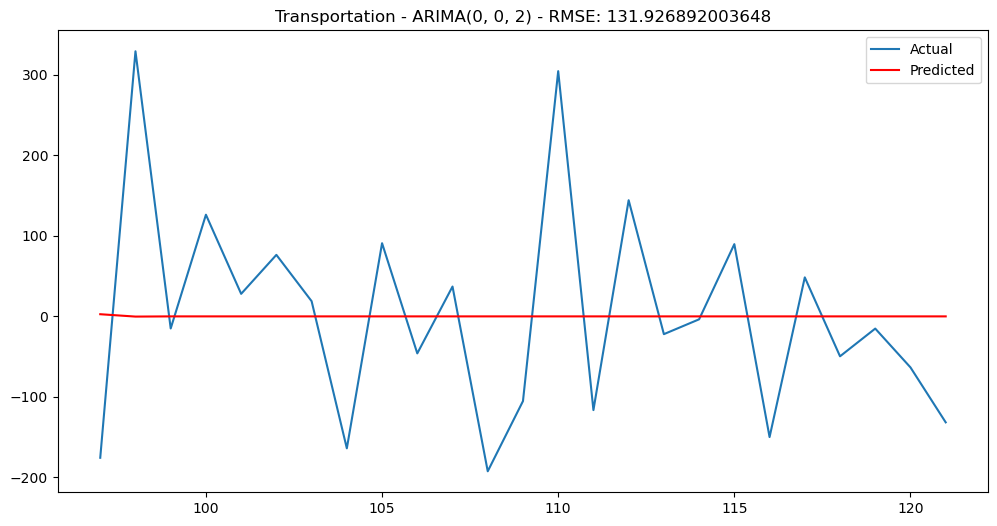

ARIMA(1, 0, 0) RMSE: 132.50408497726988


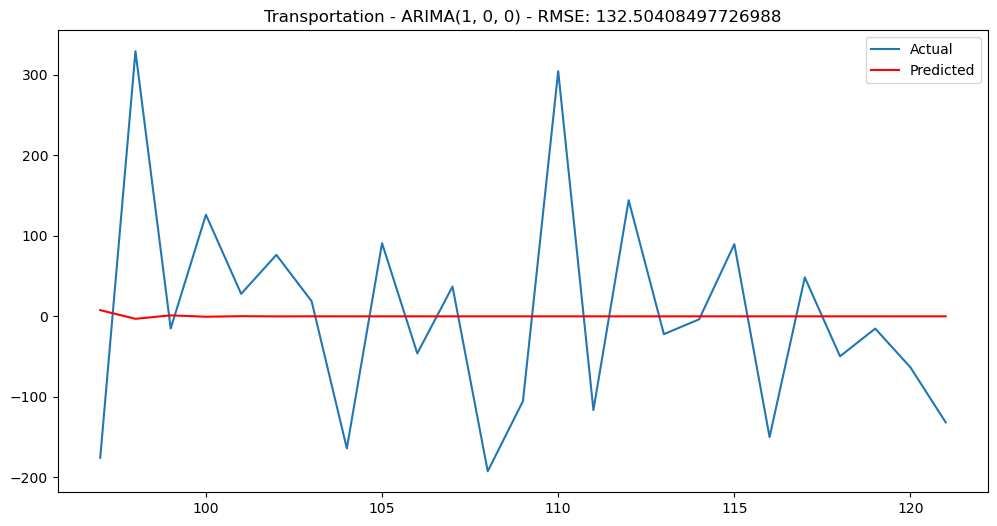

ARIMA(2, 0, 0) RMSE: 132.42462846777664


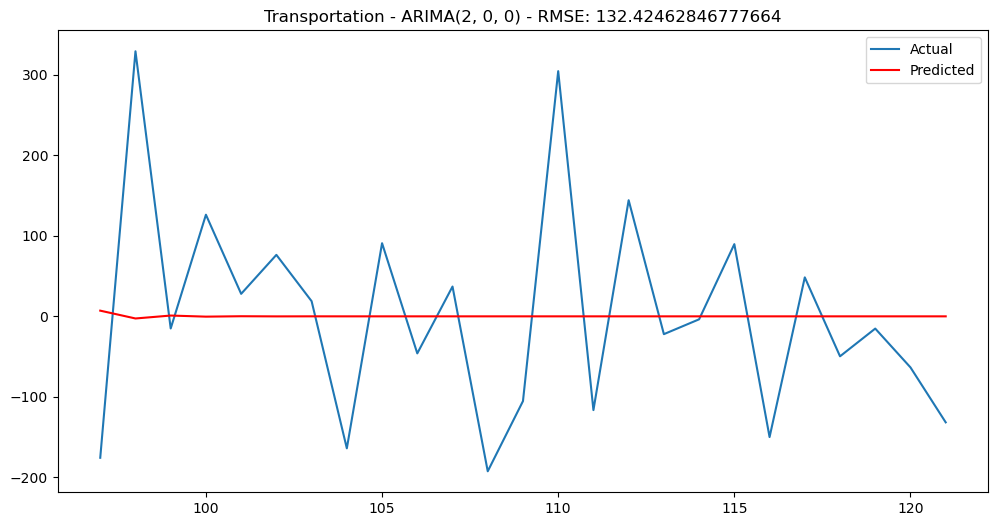

In [129]:
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

# Define a list of ARIMA orders to try
orders = [(1, 0, 1), (1, 0, 2), (2,0, 1), (2, 0, 2),(0, 0, 1),(0, 0, 2),(1,0,0),(2,0,0)]

# Define a function to fit an ARIMA model and compute the RMSE
def ARIMA_order_rmse(data, order):
    # Split the data into training and testing sets
    train_size = int(len(data) * 0.8)
    train, test = data[0:train_size], data[train_size:len(data)]

    # Fit the model
    model = ARIMA(train, order=order)
    model_fit = model.fit()

    # Make predictions (in-sample + out-of-sample forecasting)
    forecast = model_fit.forecast(steps=len(test))

    # Compute the root mean squared error (RMSE)
    rmse = sqrt(mean_squared_error(test, forecast))
    return rmse, forecast, test

# Define a function to plot actual vs predicted values
def plot_predictions(test, predictions, column, order, rmse):
    plt.figure(figsize=(12, 6))
    plt.plot(test.index, test.values, label='Actual')
    plt.plot(test.index, predictions, color='red', label='Predicted')
    plt.legend()
    plt.title(f'{column} - ARIMA{order} - RMSE: {rmse}')
    plt.show()

# Evaluate all combinations
for column in df_diff.columns:
    print(f'\nARIMA Results for {column}:')
    for order in orders:
        try:
            rmse, predictions, test = ARIMA_order_rmse(df_diff[column], order)
            print(f'ARIMA{order} RMSE: {rmse}')
            plot_predictions(test, predictions, column, order, rmse)
        except Exception as e:
            print(f'Failed to fit ARIMA{order} for {column}. Reason: {str(e)}')



Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1537.929, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1461.091, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1492.123, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1535.931, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1519.312, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1492.065, Time=0.14 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1459.091, Time=0.13 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1441.495, Time=0.19 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1442.6

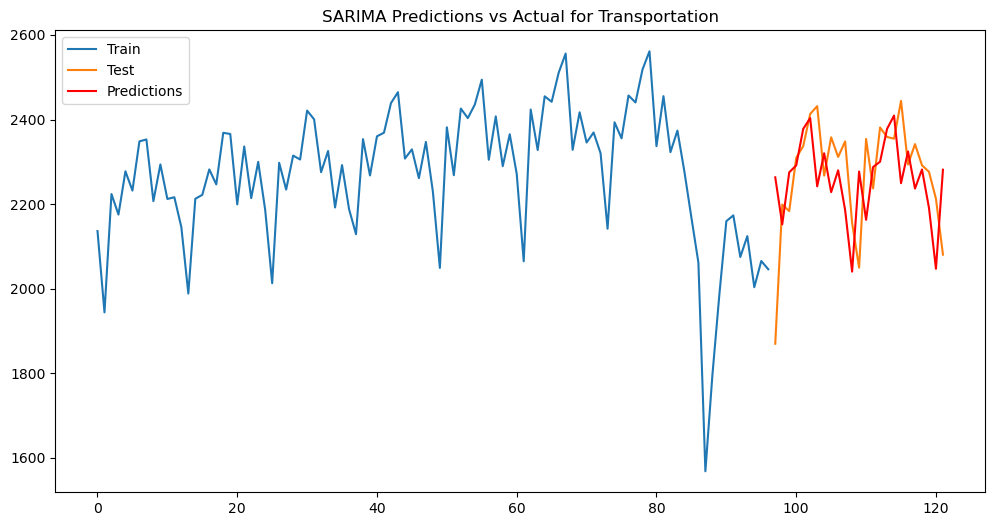

In [130]:
from pmdarima import auto_arima
import matplotlib.pyplot as plt
import numpy as np

best_model = auto_arima(df_diff[column], seasonal=True, m=12, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True)
print(best_model.summary())

# Split the data for visualization (using 80% as the training set)
train_size = int(len(df_merged[column]) * 0.8)
train, test = df_merged[column][0:train_size], df_merged[column][train_size:len(df_merged[column])]

# Predict the differences using the best model
differenced_predictions = best_model.predict(n_periods=len(test))

# Revert the differencing to get predictions on the original scale
predictions = np.r_[train.iloc[-1], train.iloc[-1] + np.cumsum(differenced_predictions)].astype(float)[1:]

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(train.index, train, label="Train")
plt.plot(test.index, test, label="Test")
plt.plot(test.index, predictions, color='red', label="Predictions")
plt.title(f"SARIMA Predictions vs Actual for {column}")
plt.legend()
plt.show()



In [131]:
from pmdarima import auto_arima
import matplotlib.pyplot as plt
import numpy as np

def fit_and_plot_sarima(data, column, seasonal_period=12):
    """
    Fit and plot a SARIMA model for a given column (sector) in the data.
    
    Parameters:
    - data: DataFrame containing the time series data.
    - column: The column (sector) to model.
    - seasonal_period: The seasonal period for the SARIMA model.
    
    Returns:
    - best_model: The trained SARIMA model.
    """
    
    # Difference the data to make it stationary
    data_diff = data[column].diff().dropna()

    # Fit the SARIMA model on the differenced data
    best_model = auto_arima(data_diff, seasonal=True, m=seasonal_period, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True)
    print(best_model.summary())

    # Split the data for visualization (using 80% as the training set)
    train_size = int(len(data[column]) * 0.8)
    train, test = data[column][0:train_size], data[column][train_size:len(data[column])]

    # Predict the differences using the best model
    differenced_predictions = best_model.predict(n_periods=len(test))

    # Revert the differencing to get predictions on the original scale
    predictions = np.r_[train.iloc[-1], train.iloc[-1] + np.cumsum(differenced_predictions)].astype(float)[1:]

    # Plot the results
    plt.figure(figsize=(12, 6))
    plt.plot(train.index, train, label="Train")
    plt.plot(test.index, test, label="Test")
    plt.plot(test.index, predictions, color='red', label="Predictions")
    plt.title(f"SARIMA Predictions vs Actual for {column}")
    plt.legend()
    plt.show()
    
    return best_model



Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1445.634, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1418.873, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1443.739, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1428.895, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1407.403, Time=0.26 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1421.535, Time=0.19 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=1397.822, Time=0.35 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=1413.342, Time=0.16 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=1399.3

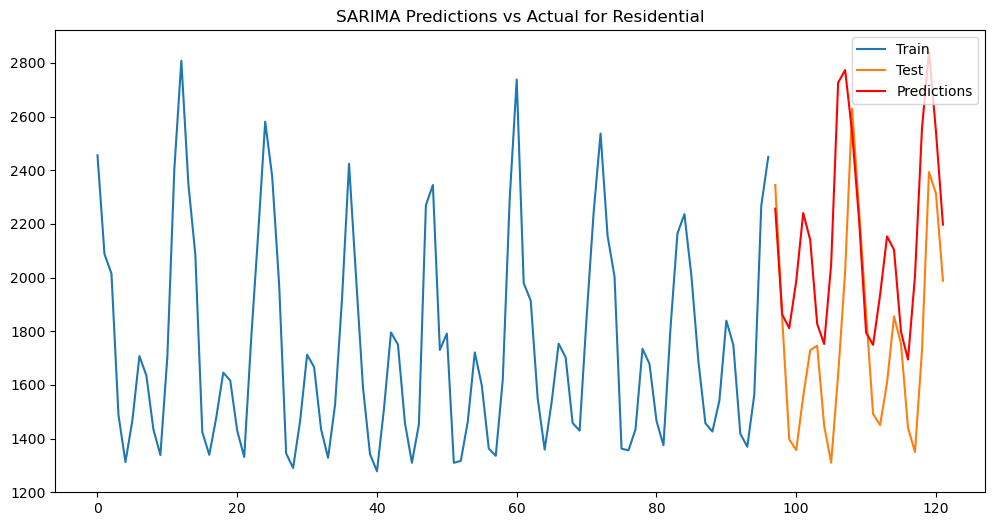

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1536.954, Time=0.00 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1438.885, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1462.905, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1534.976, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1499.516, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1473.451, Time=0.11 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1440.742, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1434.506, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1499.872, Time=0.05 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=i

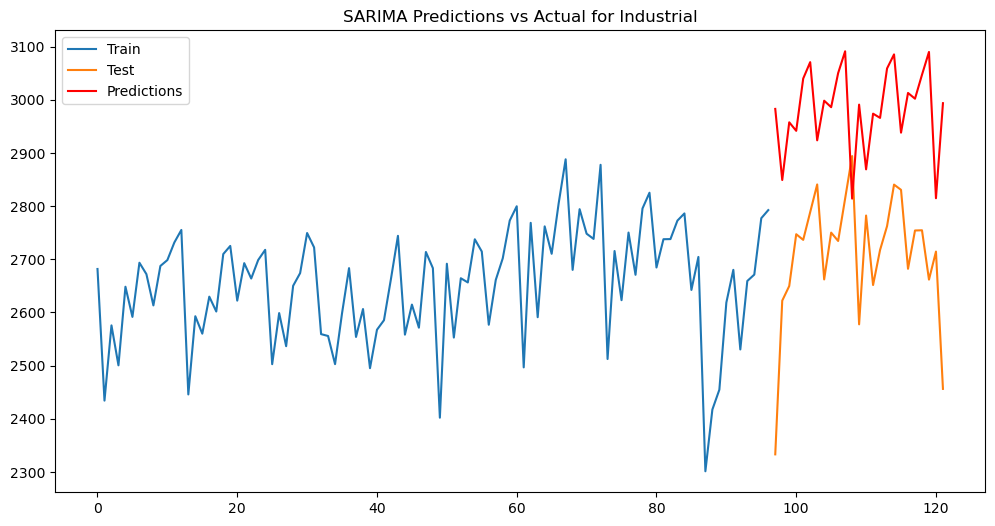

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1281.734, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1244.483, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1279.810, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1248.194, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1225.728, Time=0.26 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1253.403, Time=0.25 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=1214.264, Time=0.40 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=1235.177, Time=0.20 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=1214.3

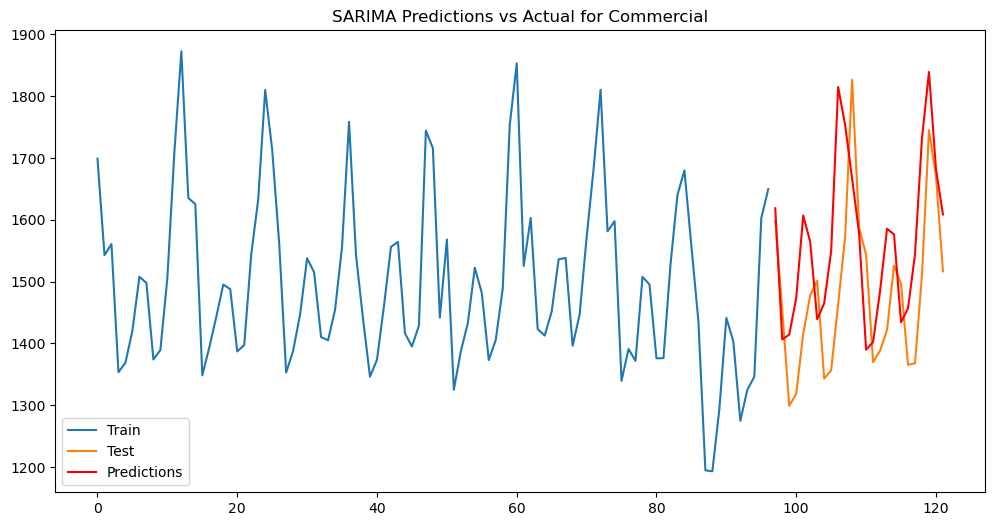

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1537.929, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1461.091, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1492.123, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1535.931, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1519.312, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1492.065, Time=0.07 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1459.091, Time=0.10 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1441.495, Time=0.18 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1442.6

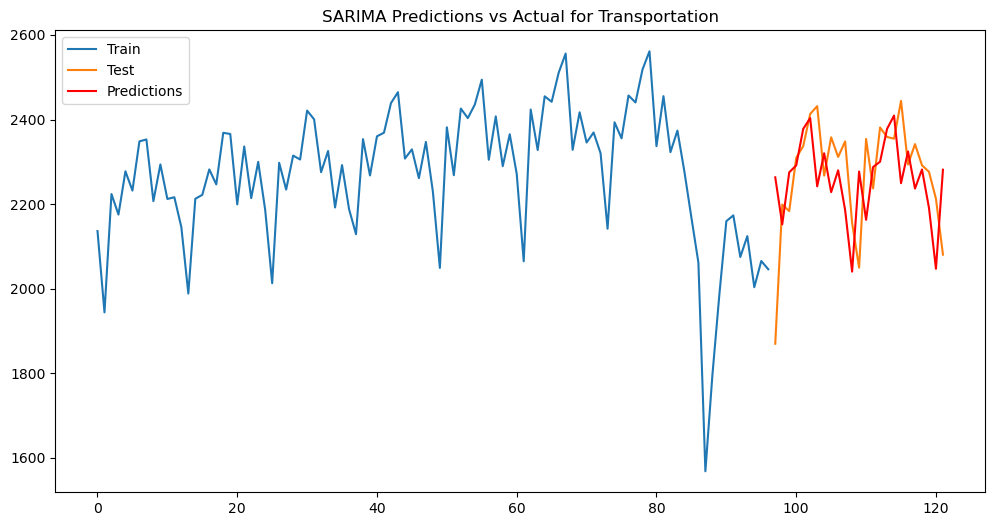

In [132]:
for column in df_merged.columns:
    if column != 'Month':
        fit_and_plot_sarima(df_merged, column)

In [133]:
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX


In [134]:
def fit_sarima1(data, sector_name):
    # Determine the best SARIMA order with auto_arima
    best_fit = auto_arima(data[sector_name], seasonal=True, m=12, trace=True,
                          error_action='ignore', suppress_warnings=True, stepwise=True)
    
    print(f"Best SARIMA order for {sector_name}: {best_fit.order}")
    print(f"Best seasonal order for {sector_name}: {best_fit.seasonal_order}")
    
    # Fit the SARIMA model using the best orders
    model = SARIMAX(data[sector_name], order=best_fit.order, seasonal_order=best_fit.seasonal_order)
    model_fit = model.fit(disp=0)
    
    # Get in-sample predictions to visualize fit
    predictions = model_fit.get_prediction(start=1, end=len(data)).predicted_mean

    
     # Compute MAPE
    mape = ((abs(data[sector_name] - predictions) / data[sector_name]) * 100).mean()

    print(f"Mean Absolute Percentage Error for {sector_name}: {mape:.2f}%")

    # Accuracy in percentage
    accuracy = 100 - mape
    print(f"Accuracy for {sector_name}: {accuracy:.2f}%")
    
    
    
    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(data[sector_name], label="Actual")
    
    plt.plot(data.index, predictions, color='red', label="Predicted")
    plt.title(f"{sector_name} - Actual vs Predicted")
    plt.legend()
    plt.show()

    return model_fit




In [135]:
print(df_diff.columns)
print(df_merged.columns)

Index(['Month', 'Residential', 'Industrial', 'Commercial', 'Transportation'], dtype='object')
Index(['Month', 'Residential', 'Industrial', 'Commercial', 'Transportation'], dtype='object')


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1445.634, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1418.873, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1443.739, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1428.895, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1407.403, Time=0.27 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1421.535, Time=0.17 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=1397.822, Time=0.33 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=1413.342, Time=0.18 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=1399.3

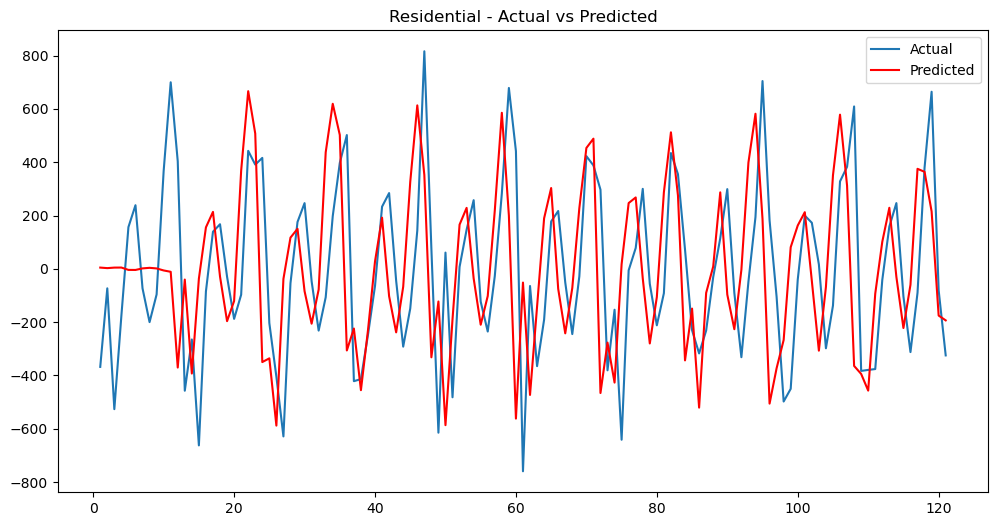

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1536.954, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1438.885, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1462.905, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1534.976, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1499.516, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1473.451, Time=0.10 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1440.742, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1434.506, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1499.872, Time=0.05 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=i

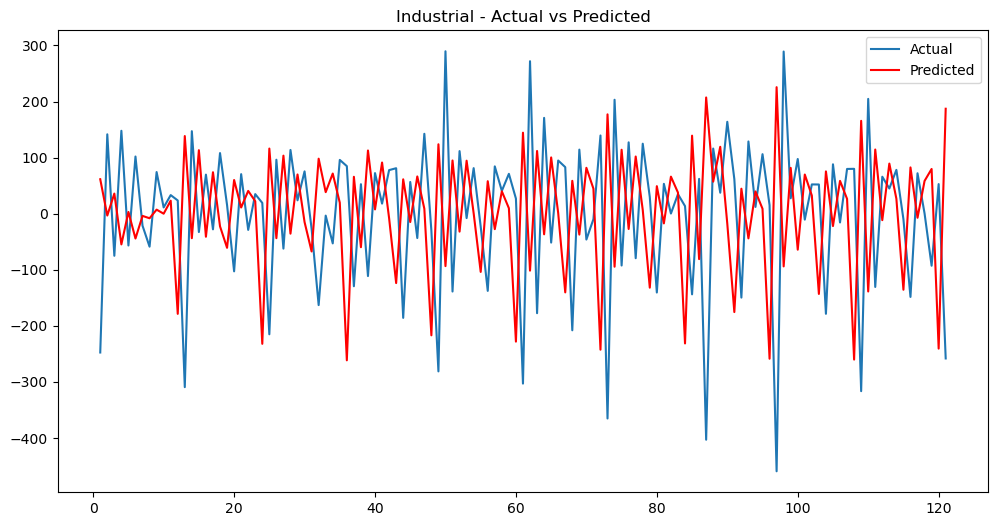

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1281.734, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1244.483, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1279.810, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1248.194, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1225.728, Time=0.25 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1253.403, Time=0.18 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=1214.264, Time=0.34 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=1235.177, Time=0.13 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=1214.3

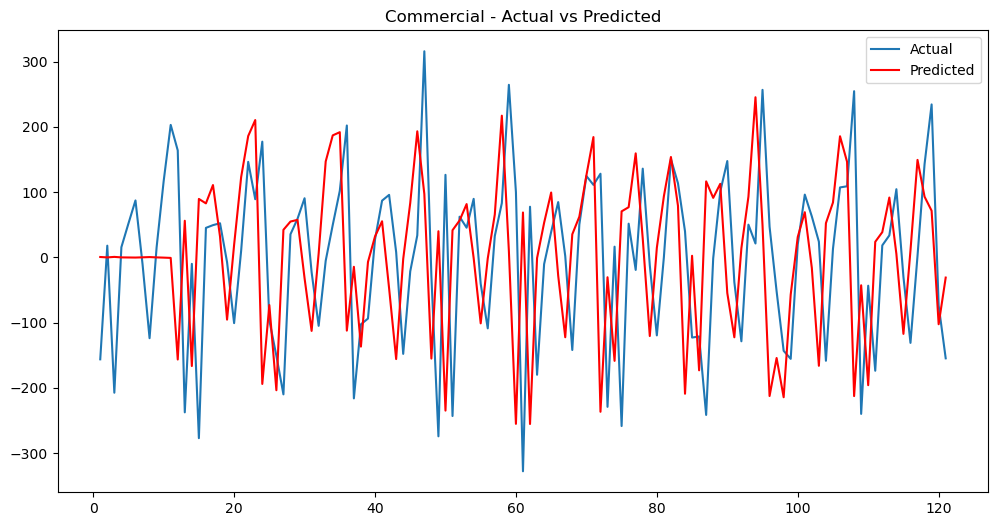

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1537.929, Time=0.00 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1461.091, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1492.123, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1535.931, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1519.312, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1492.065, Time=0.05 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=1459.091, Time=0.09 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1441.495, Time=0.19 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1442.6

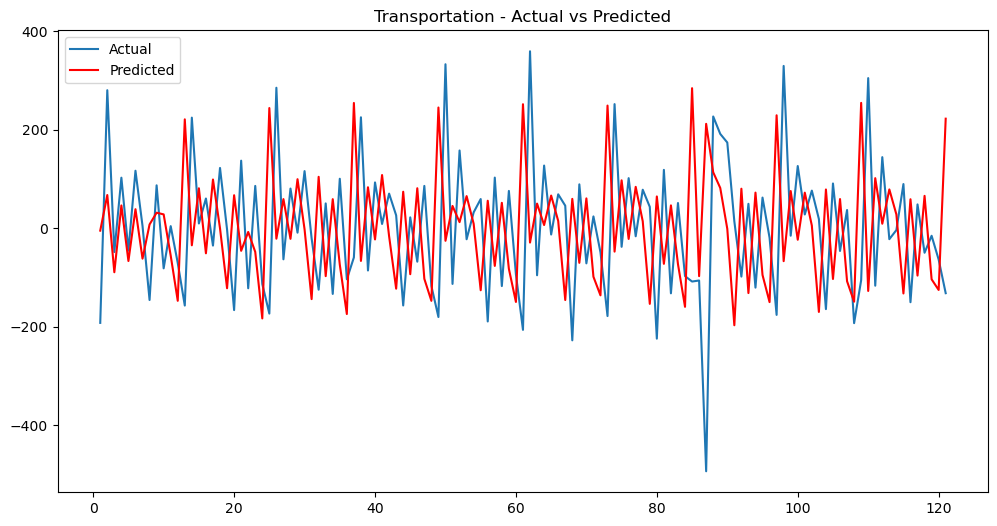

In [136]:
# Loop through all sectors and fit SARIMA model
for column in df_diff.columns:
    if column != 'Month':
        fit_sarima1(df_diff, column)

In [137]:
def compute_mape(actual, forecast):
    """Compute Mean Absolute Percentage Error (MAPE)"""
    return ((abs(actual - forecast) / abs(actual)).mean()) * 100


In [138]:
def fit_sarima2(data, sector_name, split_ratio=0.7):
    # Split the data into training and testing sets
    train_size = int(len(data) * split_ratio)
    train, test = data[sector_name][0:train_size], data[sector_name][train_size:len(data)]
    
    # Determine the best SARIMA order with auto_arima on the training data
    best_fit = auto_arima(train, seasonal=True, m=12, trace=True,
                          error_action='ignore', suppress_warnings=True, stepwise=True)
    
    print(f"Best SARIMA order for {sector_name}: {best_fit.order}")
    print(f"Best seasonal order for {sector_name}: {best_fit.seasonal_order}")
    
    # Fit the SARIMA model using the best orders on the training data
    model = SARIMAX(train, order=best_fit.order, seasonal_order=best_fit.seasonal_order)
    model_fit = model.fit(disp=0)
    
    # Make predictions on the testing set
    predictions = model_fit.get_forecast(steps=len(test)).predicted_mean

    # Ensure predictions length is same as test
    assert len(predictions) == len(test), "Mismatch between lengths of predictions and test!"
    # Set the index of predictions to match test index for plotting
    predictions.index = test.index
    
    # Compute the MAPE (Mean Absolute Percentage Error)
    mape = ((abs(test - predictions) / test) * 100).mean()
    print(f"Mean Absolute Percentage Error for {sector_name}: {mape:.2f}%")
    
    # Plot actual vs predicted values
    plt.figure(figsize=(12, 6))
    plt.plot(train, label="Training Data")
    plt.plot(test.index, test.values, label="Actual Test Data")
    plt.plot(predictions, color='red', label="Predicted Test Data")
    plt.title(f"{sector_name} - Training, Actual vs Predicted Test Data")
    plt.legend()
    plt.show()

    return model_fit


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=944.458, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=936.727, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=921.626, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=942.673, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=928.931, Time=0.06 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=929.568, Time=0.10 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=926.316, Time=0.19 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.34 sec

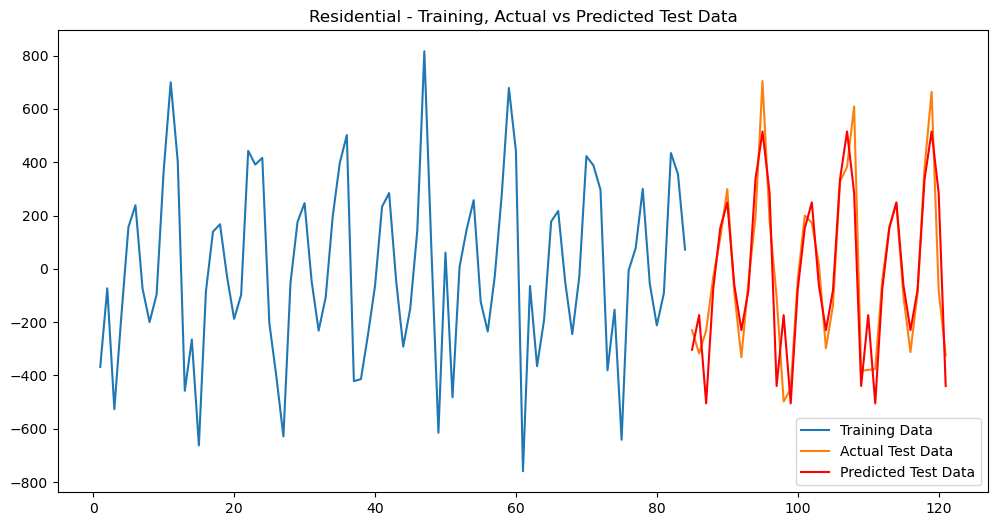

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=811.556, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=801.325, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=809.642, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=807.753, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=796.003, Time=0.26 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=803.840, Time=0.17 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=797.353, Time=0.33 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=790.499, Time=0.30 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=794.427, Time=0.13 sec
 ARIMA(1,0,1)(2,1,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=

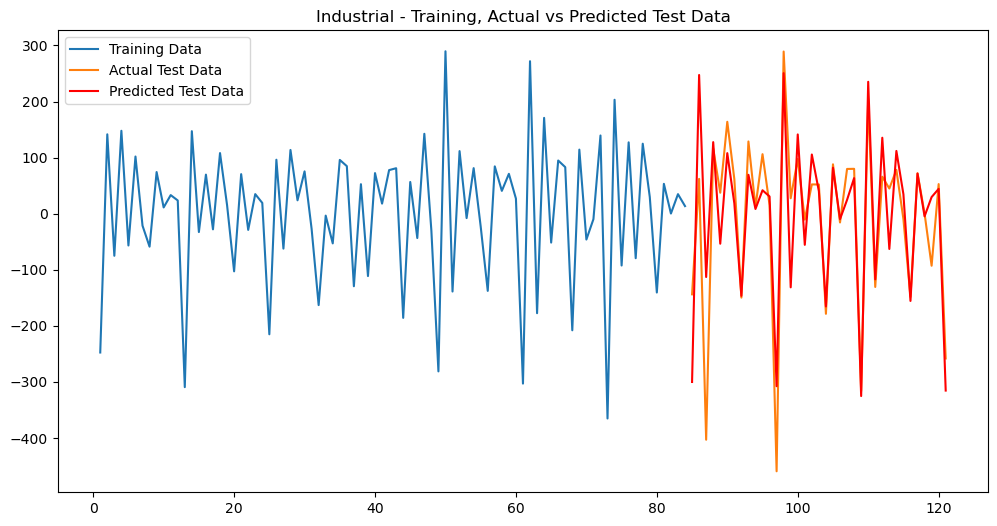

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=831.258, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=818.406, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=829.482, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=819.157, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=806.346, Time=0.19 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=817.417, Time=0.13 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=792.420, Time=0.37 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=804.378, Time=0.18 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=793.710, Time=

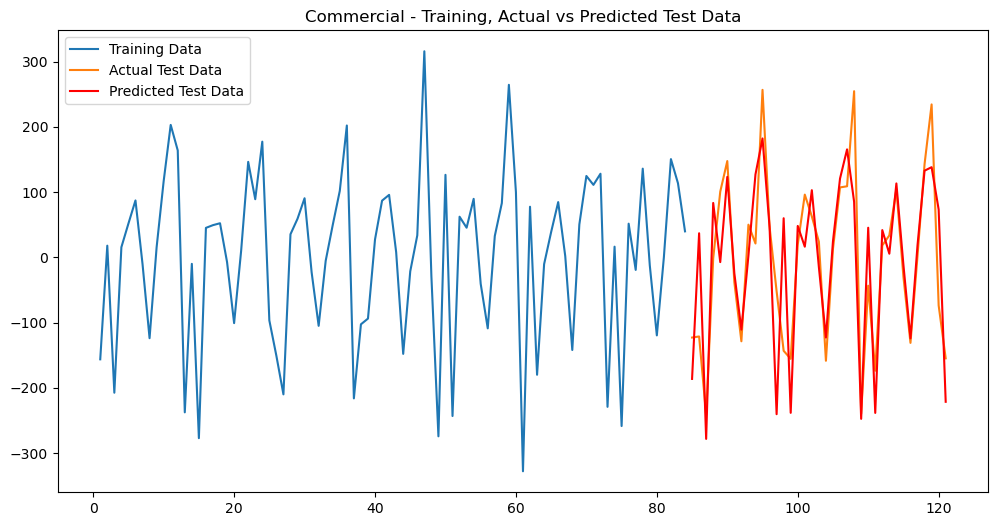

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=760.096, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=731.168, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=758.114, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=736.704, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=729.442, Time=0.16 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=753.872, Time=0.09 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=719.829, Time=0.32 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=722.884, Time=0.14 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=721.734, Time=

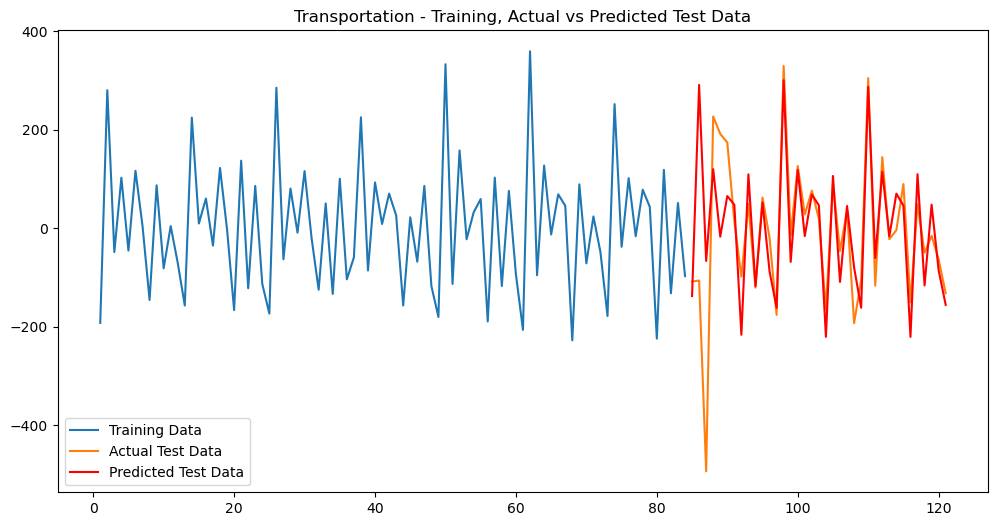

In [139]:
# Loop through all sectors and fit SARIMA model
for column in df_merged.columns:
    if column != 'Month':
        fit_sarima2(df_diff, column) 

In [140]:
from sklearn.model_selection import TimeSeriesSplit

def fit_sarima_cv(data, sector_name, n_splits=5):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    
    mape_scores = []
    
    for train_index, test_index in tscv.split(data):
        train, test = data[sector_name].iloc[train_index], data[sector_name].iloc[test_index]
        
        best_fit = auto_arima(train, seasonal=True, m=12, trace=True,
                              error_action='ignore', suppress_warnings=True, stepwise=True)

        print(f"Best SARIMA order for {sector_name}: {best_fit.order}")
        print(f"Best seasonal order for {sector_name}: {best_fit.seasonal_order}")

        model = SARIMAX(train, order=best_fit.order, seasonal_order=best_fit.seasonal_order)
        model_fit = model.fit(disp=0)
        
        predictions = model_fit.get_forecast(steps=len(test)).predicted_mean

        # Compute the MAPE (Mean Absolute Percentage Error) for this split
        mape = ((abs(test - predictions) / test) * 100).mean()
        mape_scores.append(mape)

        plt.figure(figsize=(12, 6))
        plt.plot(train, label="Training Data")
        plt.plot(test.index, test.values, label="Actual Test Data")
        plt.plot(test.index, predictions, color='red', label="Predicted Test Data")
        plt.title(f"{sector_name} - Training, Actual vs Predicted Test Data")
        plt.legend()
        plt.show()

    # Calculate average MAPE across all splits
    average_mape = np.mean(mape_scores)
    print(f"Average MAPE for {sector_name}: {average_mape:.2f}%")
    
    return average_mape



Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=109.447, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=109.259, Time=0.01 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.12 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.06 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.06 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.11 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.10 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=8.000, Time=0.06 sec
 ARIMA(0,0,2)(1,1,0)[12] intercept   : AIC=10.000, Time=0.08 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=10.000, T

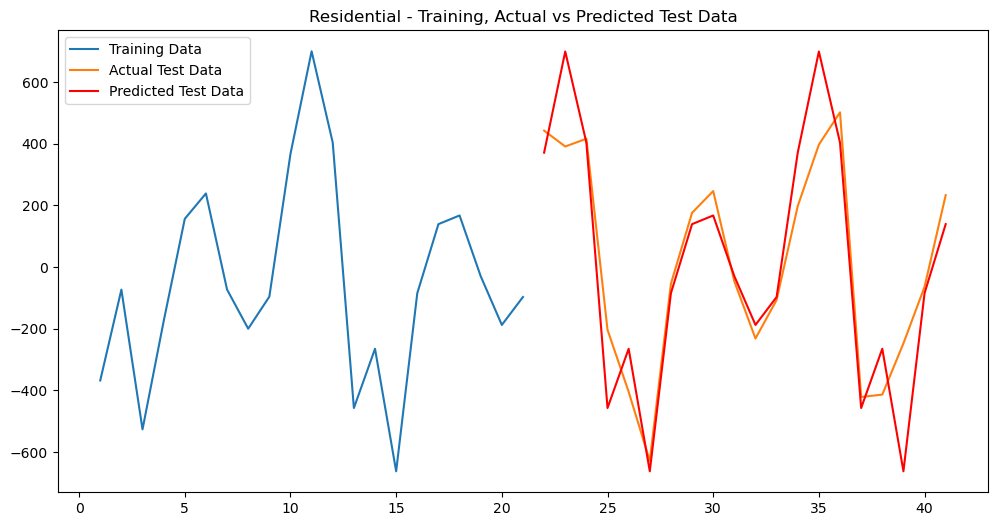

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=374.337, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=371.212, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=374.162, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=373.672, Time=0.08 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=369.389, Time=0.02 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=372.465, Time=0.05 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=372.239, Time=0.05 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=372.874, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=372.495, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=373.383, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 0.974 seconds
Best SARIMA order for Residential: (0, 0, 0)
Best seasonal order for Residential: (0, 1, 0, 12)


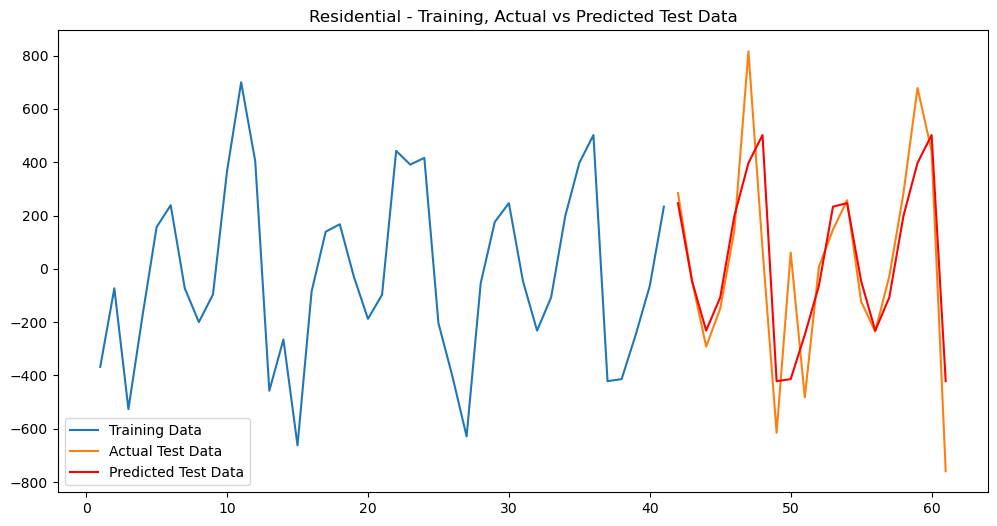

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=647.641, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=643.469, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=637.518, Time=0.14 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=645.649, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=639.872, Time=0.06 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=640.219, Time=0.13 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=641.298, Time=0.06 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=640.286, Time=0.19 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.48

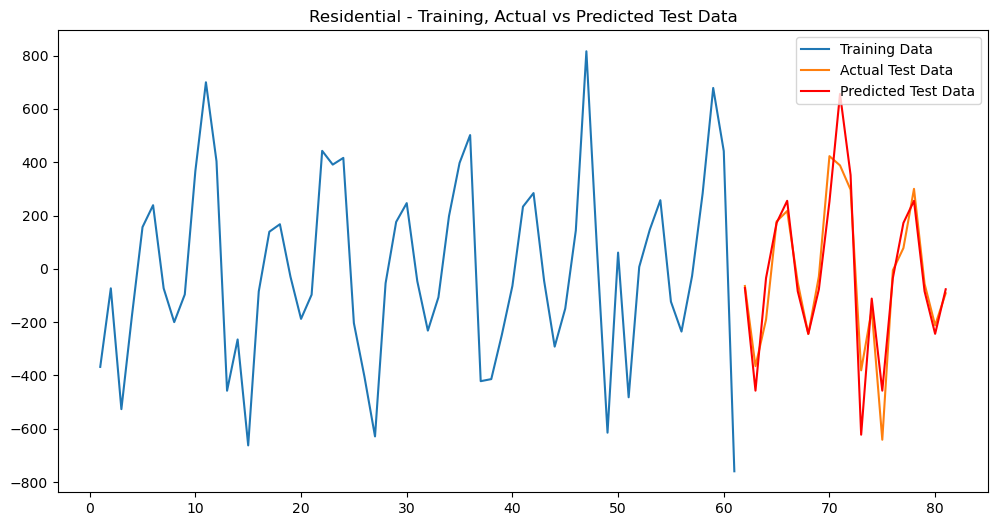

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=906.515, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=897.230, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=904.601, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=899.892, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=890.998, Time=0.22 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=895.080, Time=0.16 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=879.631, Time=0.26 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=886.930, Time=0.15 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=881.507, Time=

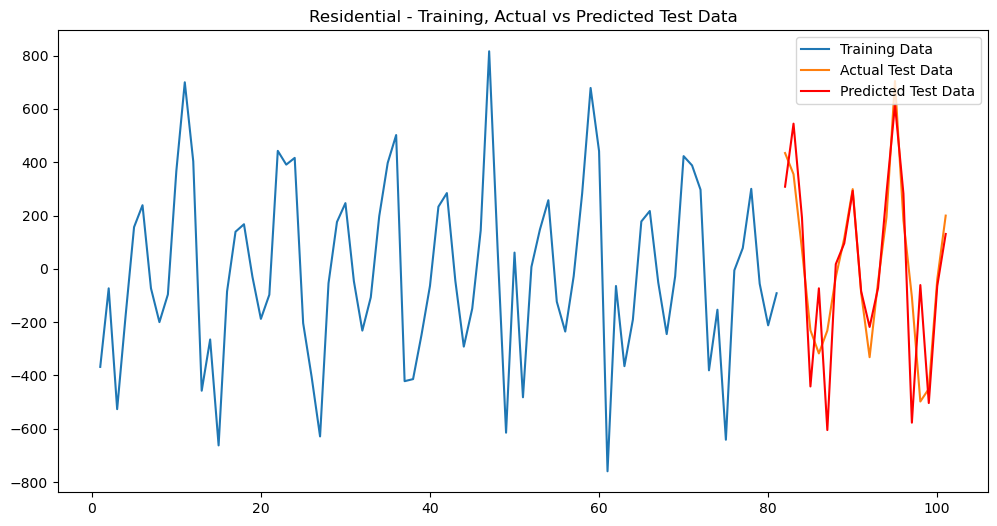

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1168.931, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1156.739, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1166.976, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1160.977, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1150.491, Time=0.25 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1159.961, Time=0.16 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=1143.393, Time=0.32 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=1151.655, Time=0.15 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=1145.2

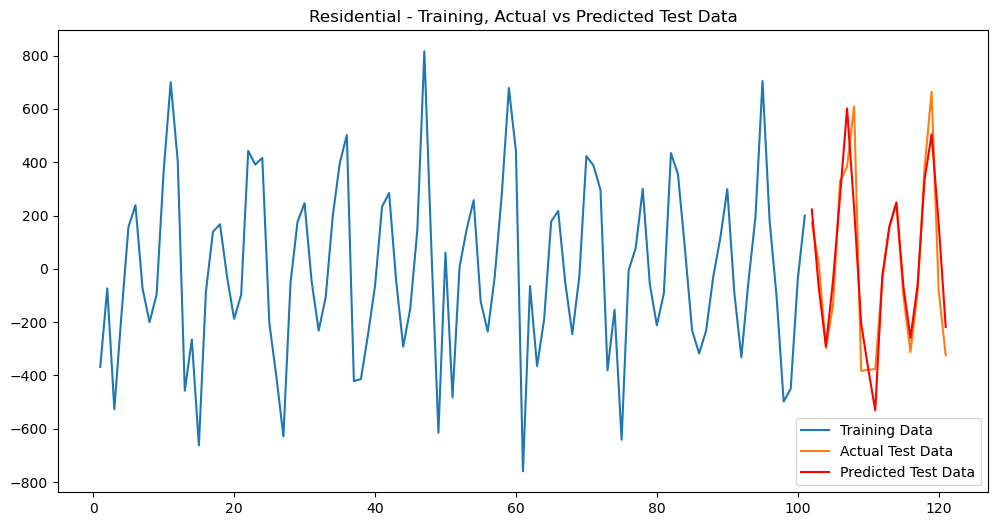

Average MAPE for Residential: -29.12%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=96.549, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=98.318, Time=0.06 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=94.845, Time=0.02 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.08 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.06 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.05 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.06 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.11 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=8.000, Time=0.03 sec
 ARIMA(0,0,2)(1,1,0)[12] intercept   : AIC=10.000, Time=0.06 sec
 ARIMA(0,0,2)

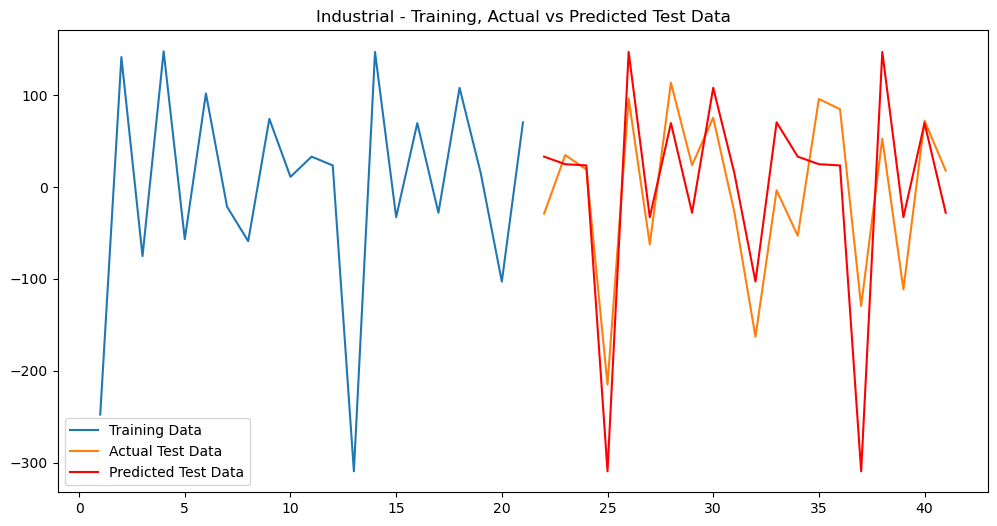

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=501.785, Time=0.00 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=457.536, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=499.806, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=492.694, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=459.047, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=459.032, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=455.813, Time=0.07 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=457.384, Time=0.12 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=457.357, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=

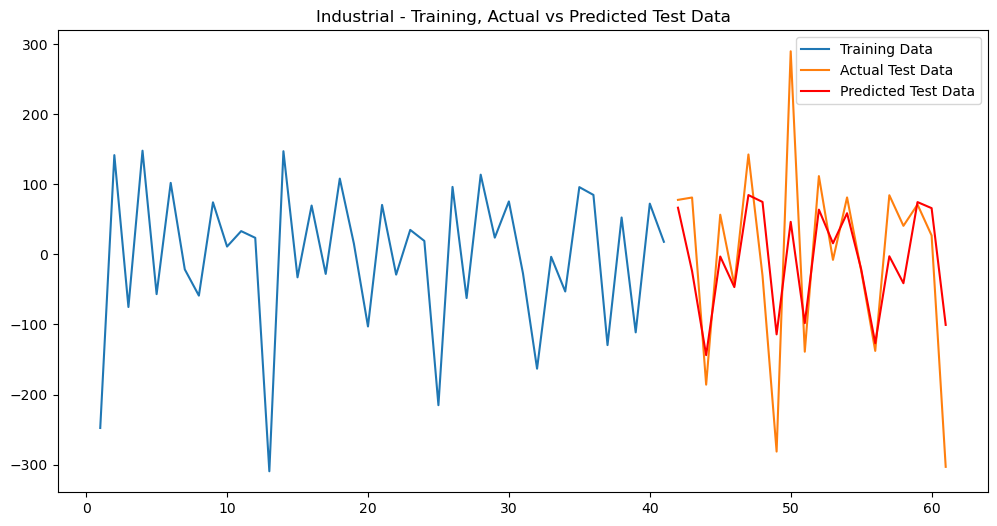

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=553.282, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=551.496, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=551.285, Time=0.02 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=551.344, Time=0.05 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=553.470, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=552.466, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 1.140 seconds
Best SARIMA order for Industrial: (0, 0, 0)
Best seasonal order for Industrial: (0, 1, 0, 12)


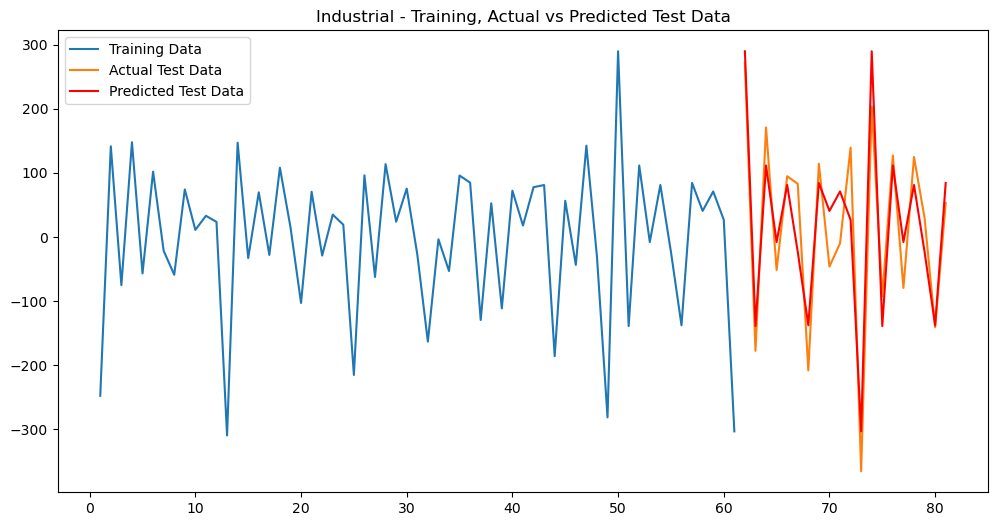

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=776.322, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=769.151, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=774.380, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=773.108, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=765.017, Time=0.27 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=772.075, Time=0.19 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=766.397, Time=0.31 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=760.996, Time=0.25 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=764.330, Time=0.09 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=inf, Time=

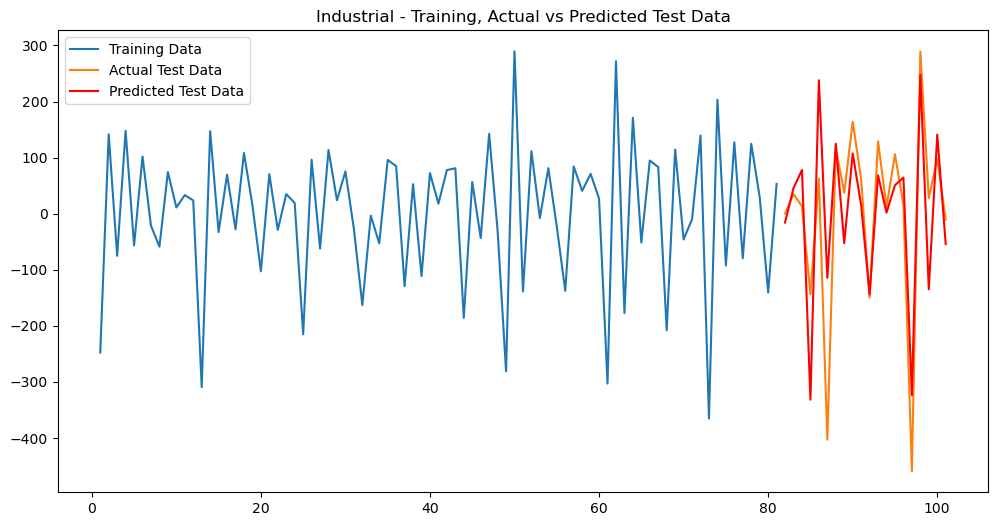

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1071.696, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1045.087, Time=0.16 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1069.747, Time=0.00 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1073.022, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=1040.610, Time=0.32 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=1030.537, Time=0.32 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=1030.439, Time=0.45 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=1031.450, Time=0.26 sec
 ARIMA(2,0,0)(0,1,2)[12] intercept   : AIC=1029.883, Time=0.58 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=i

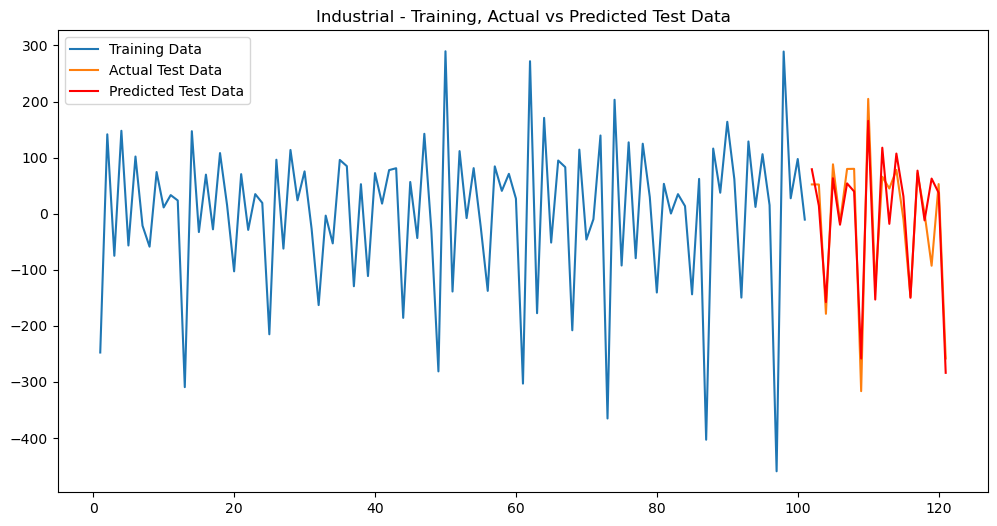

Average MAPE for Industrial: 435.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=224515839.170, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=94.184, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=98.166, Time=0.16 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=94.246, Time=0.02 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=96.181, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=96.181, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 1.012 seconds
Best SARIMA order for Commercial: (0, 0, 0)
Best seasonal order for Commercial: (0, 1, 0, 12)


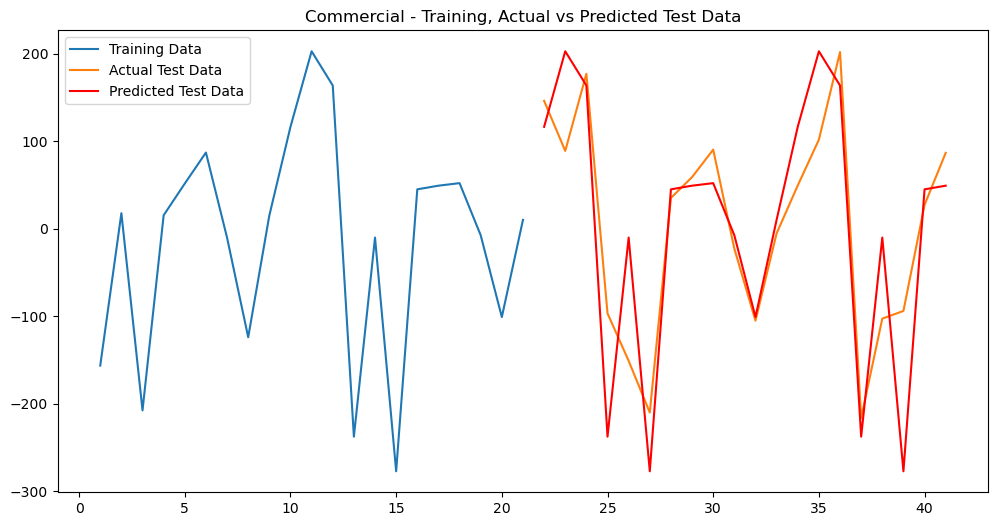

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=326.693, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=325.176, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=323.914, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=324.915, Time=0.00 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=324.338, Time=0.05 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=325.745, Time=0.20 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=324.327, Time=0.08 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=327.745, Time=0.19 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=325.081, Time=0.06 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=324.856, Time=0.08 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=inf, T

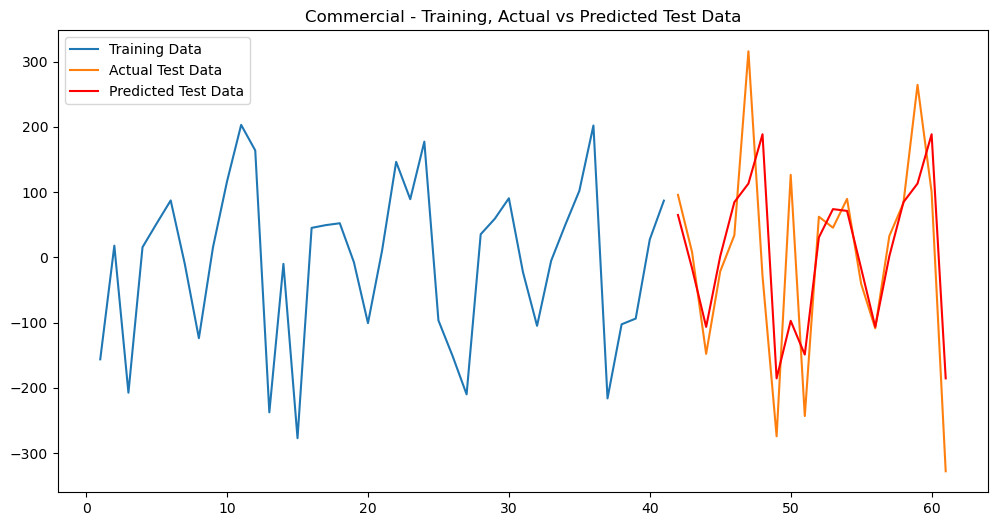

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=575.115, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=567.218, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=557.005, Time=0.11 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=573.139, Time=0.00 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=560.867, Time=0.04 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=561.056, Time=0.08 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=568.763, Time=0.06 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=563.931, Time=0.11 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=557.334, Time=

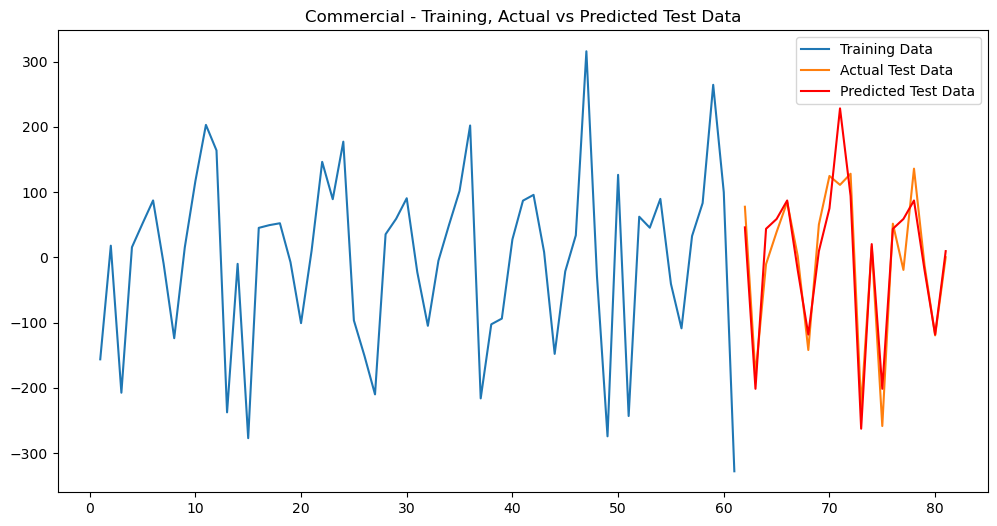

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=798.364, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=785.759, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=796.511, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=786.726, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=774.389, Time=0.21 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=784.385, Time=0.15 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=761.092, Time=0.29 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=772.455, Time=0.21 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=762.537, Time=

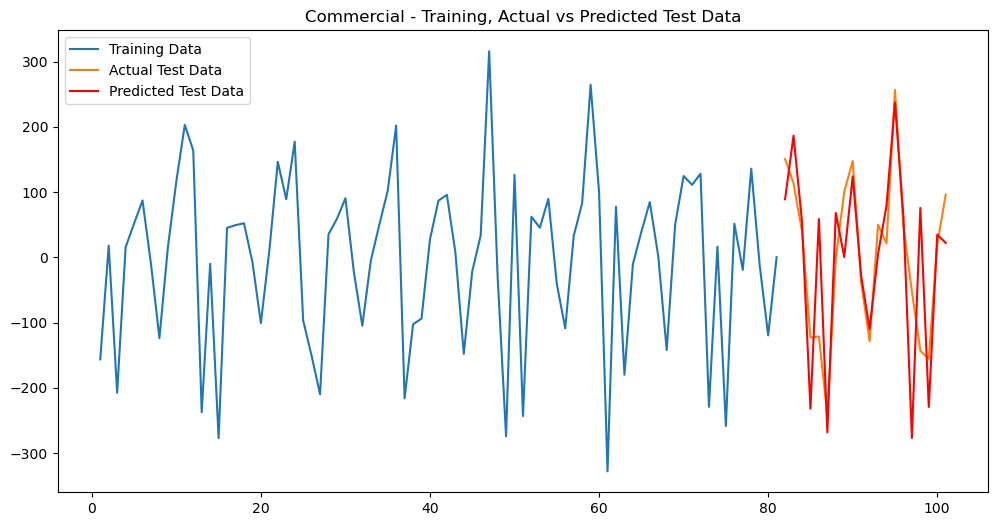

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=1027.570, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=1009.809, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=1025.575, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=1009.845, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=998.249, Time=0.48 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=1016.909, Time=0.20 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=989.769, Time=0.44 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=1001.117, Time=0.21 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=991.029,

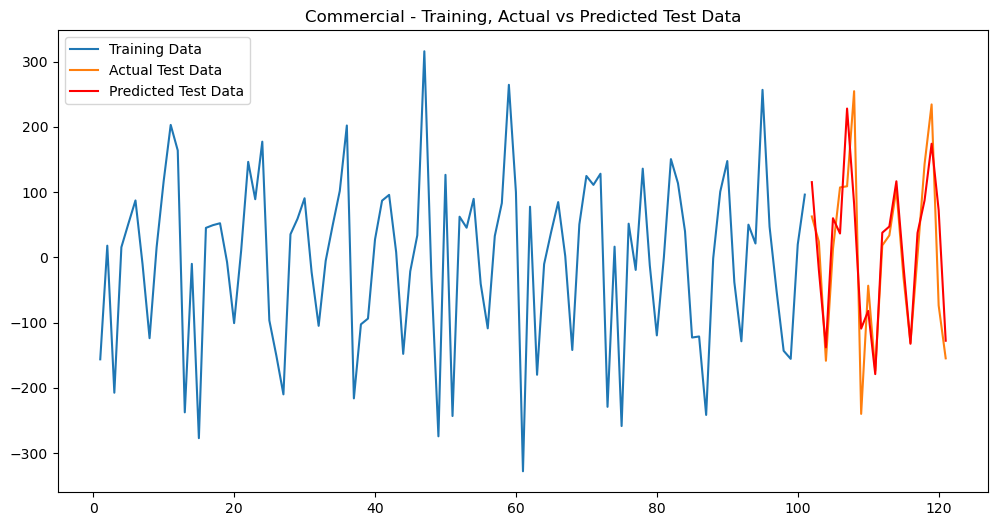

Average MAPE for Commercial: 112.34%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=94.636, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=92.723, Time=0.02 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.11 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.07 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.08 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.05 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.13 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=8.000, Time=0.05 sec
 ARIMA(0,0,2)(1,1,0)[12] intercept   : AIC=10.000, Time=0.08 sec
 ARIMA(0,0,2)(0,1

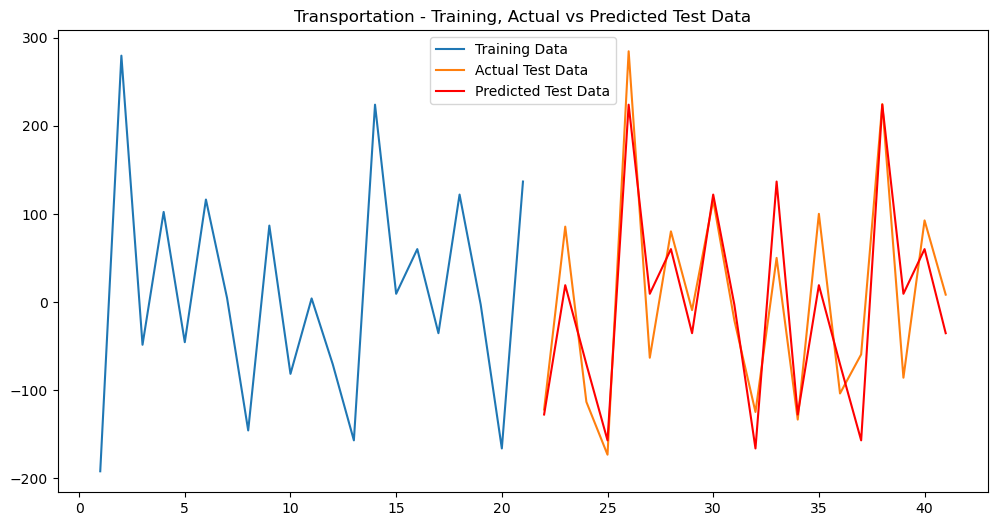

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=307.934, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=301.400, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=305.982, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=300.999, Time=0.03 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=301.605, Time=0.06 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=303.278, Time=0.14 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=300.714, Time=0.05 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=300.878, Time=0.05 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=301.258, Time=0.10 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=302.669, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, T

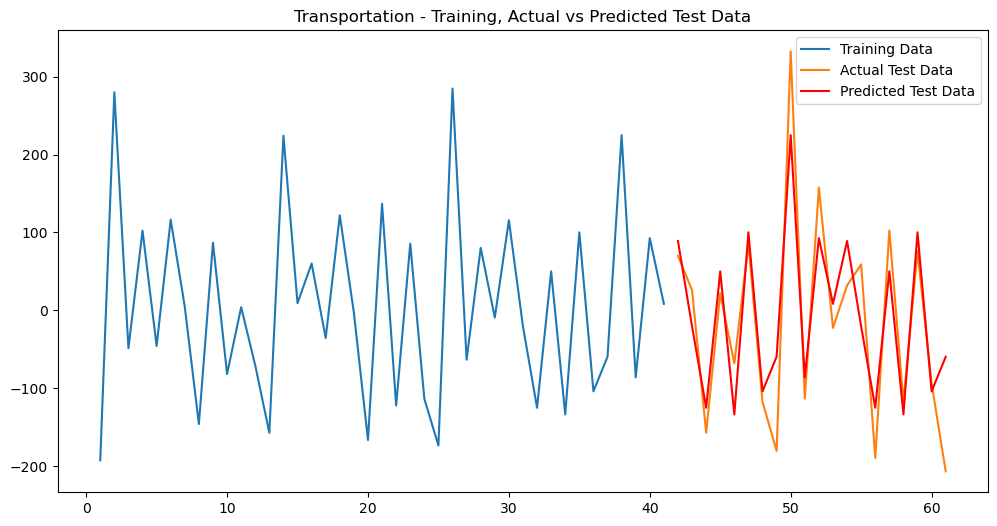

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=524.312, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=506.061, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=522.312, Time=0.00 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=509.316, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=506.731, Time=0.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=504.220, Time=0.06 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=518.702, Time=0.09 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.16 sec

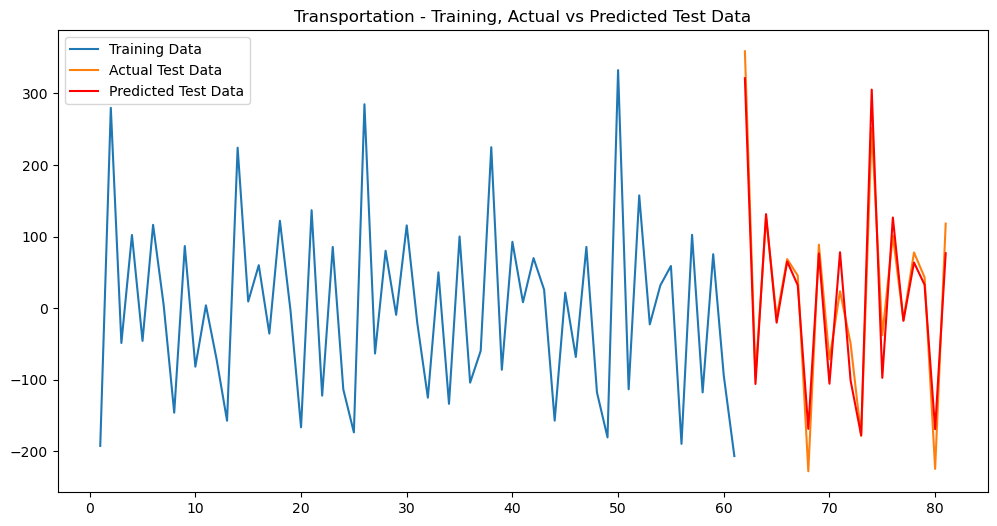

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=728.425, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=702.594, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=726.431, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=707.182, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=700.948, Time=0.17 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=723.894, Time=0.17 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=690.829, Time=0.32 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=693.878, Time=0.14 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(3,0,0)(2,1,0)[12] intercept   : AIC=692.725, Time=

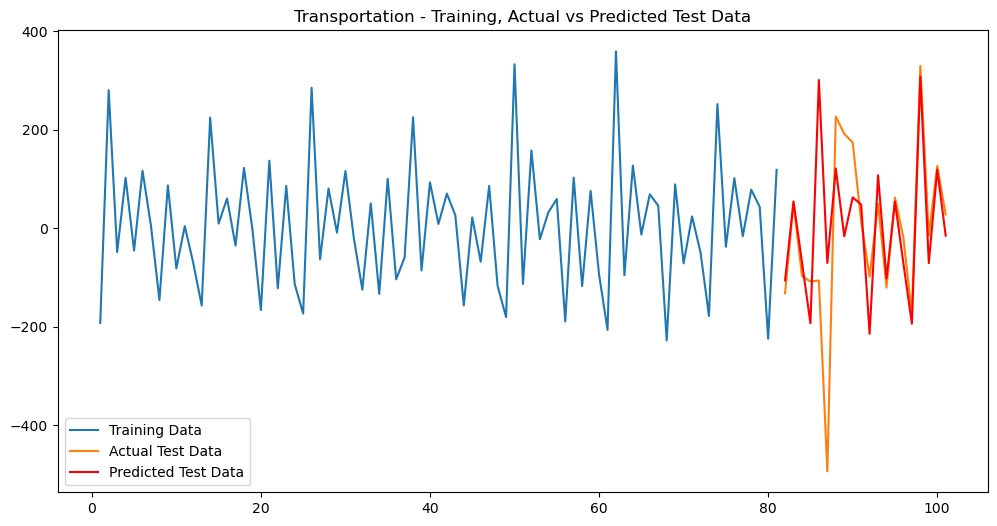

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1289.425, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1231.623, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1254.747, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1287.445, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1274.233, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1201.311, Time=0.30 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1254.744, Time=0.08 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1202.656, Time=0.54 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=1202.469, Time=0.46 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1242.615, Time=0.35 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=1204.863, Time=0.59 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1199.719, Time=0.19 sec
 ARIMA(0,0,0)(0,0,1)[12] inter

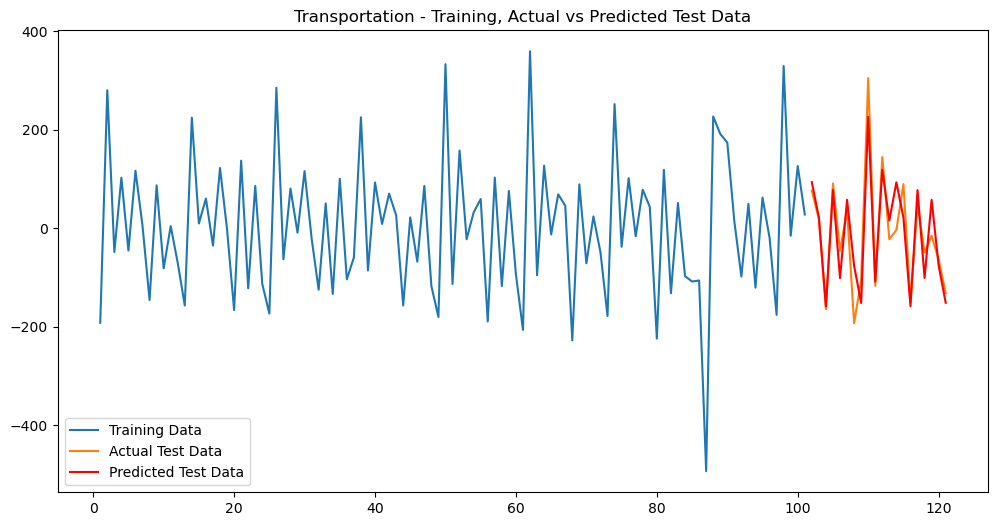

Average MAPE for Transportation: -27.39%


In [141]:
# Loop through all sectors and fit SARIMA model
for column in df_merged.columns:
    if column != 'Month':
        fit_sarima_cv(df_diff, column, n_splits=5)

In [142]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error


def fit_sarima_cv_new(data, sector_name, n_splits=5):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    
    mape_scores = []
    mse_scores = []
    rmse_scores = []
    mae_scores = []
    forecast_data = []

    for train_index, test_index in tscv.split(data):
        train, test = data[sector_name].iloc[train_index], data[sector_name].iloc[test_index]
        
        best_fit = auto_arima(train, seasonal=True, m=12, trace=True,
                              error_action='ignore', suppress_warnings=True, stepwise=True)

        print(f"Best SARIMA order for {sector_name}: {best_fit.order}")
        print(f"Best seasonal order for {sector_name}: {best_fit.seasonal_order}")

        model = SARIMAX(train, order=best_fit.order, seasonal_order=best_fit.seasonal_order)
        model_fit = model.fit(disp=0)
        
        predictions = model_fit.get_forecast(steps=len(test)).predicted_mean
        forecast_data.extend(predictions)

        # Compute the errors for this split
        mape = ((abs(test - predictions) / test) * 100).mean()
        mape_scores.append(mape)
        print(f"mape_scores  for {sector_name}: {mape}")
            
        mse = mean_squared_error(test, predictions)
        mse_scores.append(mse)
        print(f"mse_scores  for {sector_name}: {mse}")
        
        rmse = np.sqrt(mse)
        rmse_scores.append(rmse)
        print(f"rmse_scores  for {sector_name}: {rmse}")
        
        mae = mean_absolute_error(test, predictions)
        mae_scores.append(mae)
        print(f"mae_scores  for {sector_name}: {mae}")
        
        plt.figure(figsize=(12, 6))
        plt.plot(train, label="Training Data")
        plt.plot(test.index, test.values, label="Actual Test Data")
        plt.plot(test.index, predictions, color='red', label="Predicted Test Data")
        plt.title(f"{sector_name} - Training, Actual vs Predicted Test Data")
        plt.legend()
        plt.show()

    # Calculate average errors across all splits
    average_mape = np.mean(mape_scores)
    average_mse = np.mean(mse_scores)
    average_rmse = np.mean(rmse_scores)
    average_mae = np.mean(mae_scores)

    print(f"Average MAPE for {sector_name}: {average_mape:.2f}%")
    print(f"Average MSE for {sector_name}: {average_mse:.2f}")
    print(f"Average RMSE for {sector_name}: {average_rmse:.2f}")
    print(f"Average MAE for {sector_name}: {average_mae:.2f}")

    # Return the results as a dictionary
    results = {
        "forecast": forecast_data,
        "average_mape": average_mape,
        "average_mse": average_mse,
        "average_rmse": average_rmse,
        "average_mae": average_mae
    }

    return results


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=130.143, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=129.822, Time=0.02 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.12 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.06 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.09 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.12 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=inf, Time=0.15

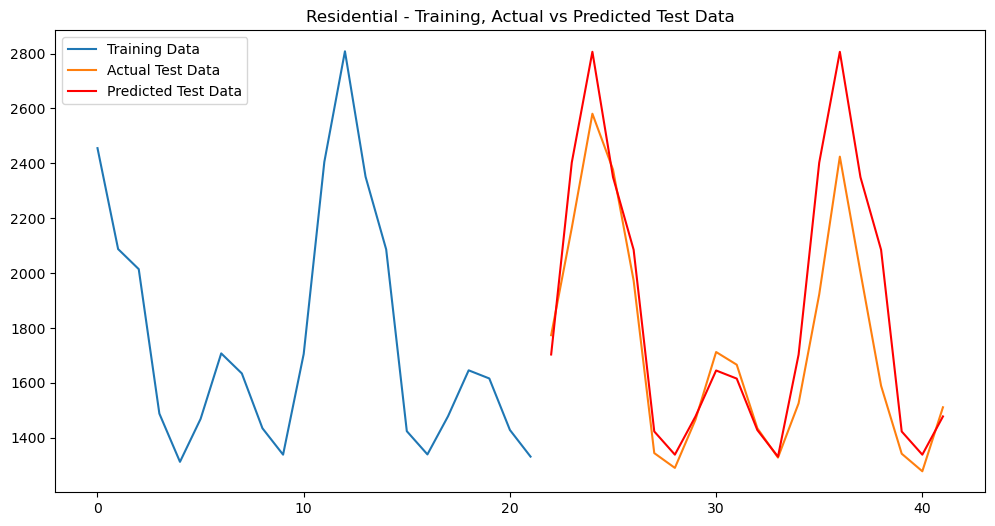

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=392.049, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=381.147, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=380.813, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=392.335, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=378.936, Time=0.04 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=380.896, Time=0.13 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=380.200, Time=0.08 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=380.462, Time=0.08 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=379.497, Time=0.06 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=377.749, Time=0.02 sec
 ARIMA(0,0,1)(1,1,0)[12]             : AIC=379.719, Time=0.06 sec
 ARIMA(0,0,1)(0,1,1)[12]             : AIC=37

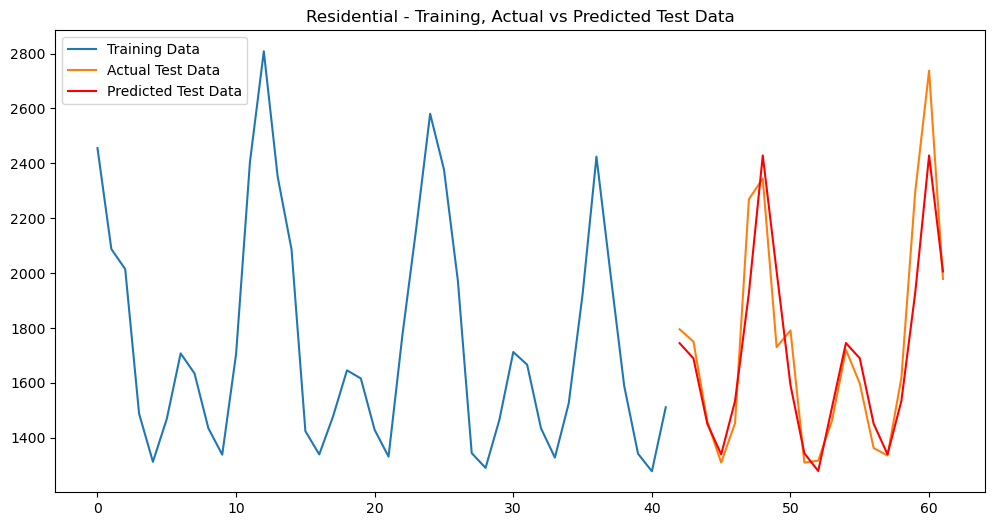

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=655.309, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=646.886, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=640.749, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=653.514, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=647.692, Time=0.05 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=647.414, Time=0.11 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=652.404, Time=0.10 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=642.742, Time=0.25 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=642.746, Time=0.21 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=641.441, Time=0.13 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=644.47

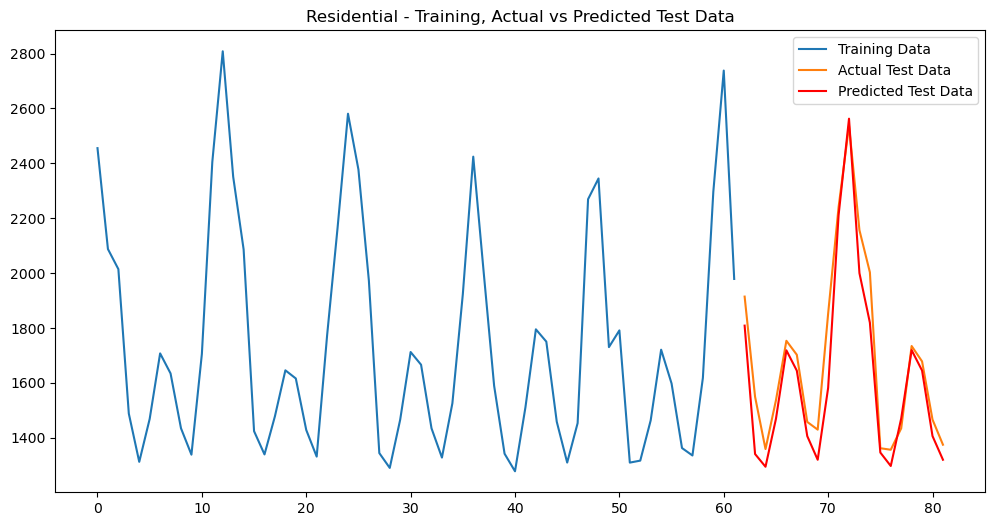

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=906.622, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=895.003, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=904.634, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=896.837, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=886.454, Time=0.35 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=893.386, Time=0.30 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=888.334, Time=0.62 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=887.672, Time=0.47 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=886.246, Time=0.49 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=895.075, Time=0.21 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=inf, T

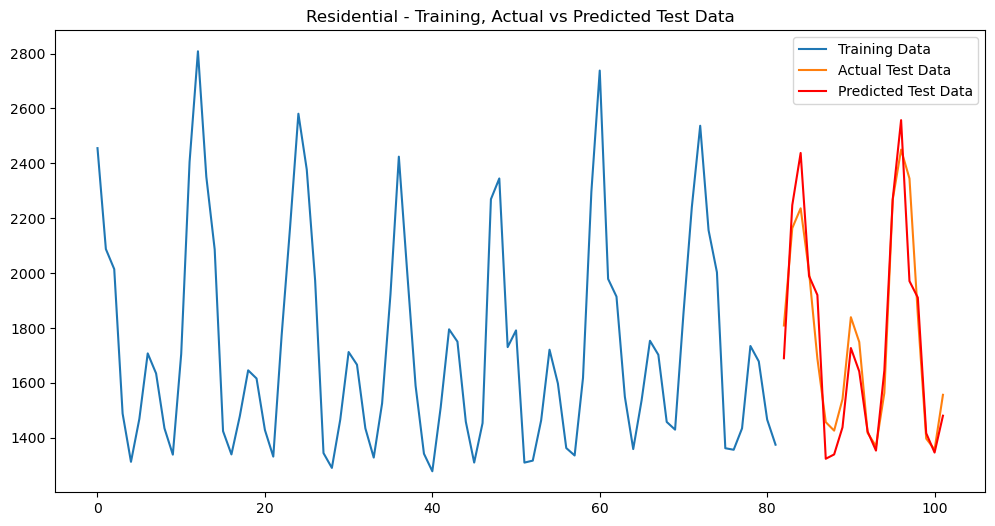

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1365.959, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1506.285, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1389.016, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1818.244, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=1366.927, Time=0.27 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=1368.798, Time=0.92 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=1404.282, Time=0.13 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=1347.726, Time=0.51 sec
 ARIMA(1,0,2)(0,0,2)[12] intercept   : AIC=1353.214, Time=0.36 sec
 ARIMA(2,0,1)(0,0,2)[12] intercept   : AIC=1348.736, Time=0.49 sec
 ARIMA(3,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(2,0,3)(0,0,2)[12] intercept   : 

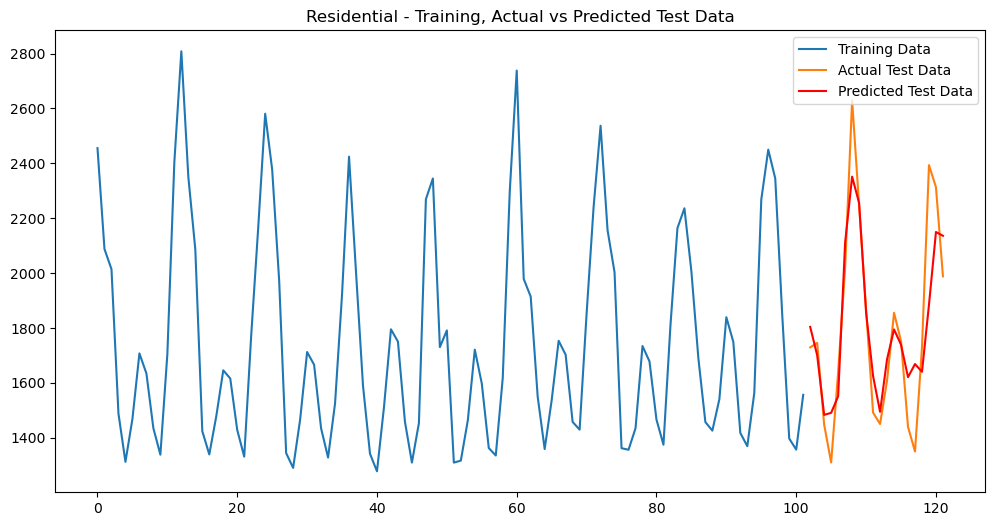

Average MAPE for Residential: 6.25%
Average MSE for Residential: 26268.25
Average RMSE for Residential: 157.76
Average MAE for Residential: 113.83


In [143]:
# Example of usage Residential
results = fit_sarima_cv_new(df_merged, 'Residential', n_splits=5)


In [144]:
# Accessing the results for Residential forecating values and error metrics
forecast_RE = results['forecast']
mape_RE = results['average_mape']
mse_RE = results['average_mse']
rmse_RE = results['average_rmse']
mae_RE = results['average_mae']


In [145]:
mape_RE,mse_RE,rmse_RE, mae_RE

(6.2461923211495645, 26268.24715614842, 157.75815945325468, 113.8342644955799)

In [146]:
len(forecast_RE)

100

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=98.431, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=102.087, Time=0.00 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.11 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.06 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.08 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.10 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.07 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=98.909, Time=0.04 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=inf, Time=0.

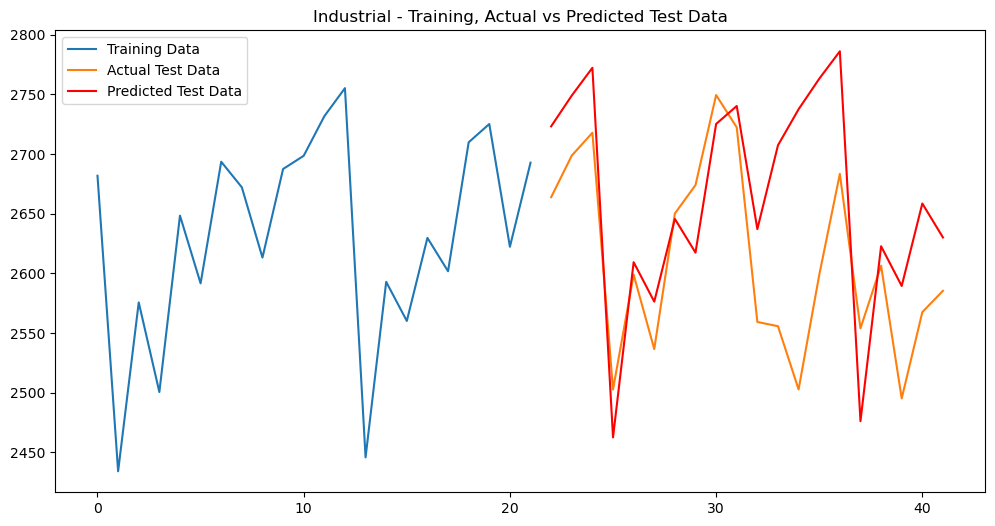

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=483.372, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=493.781, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=489.658, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=782.427, Time=0.00 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=478.786, Time=0.22 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=483.633, Time=0.49 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=487.611, Time=0.57 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=478.955, Time=0.16 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=481.337, Time=0.24 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=480.329, T

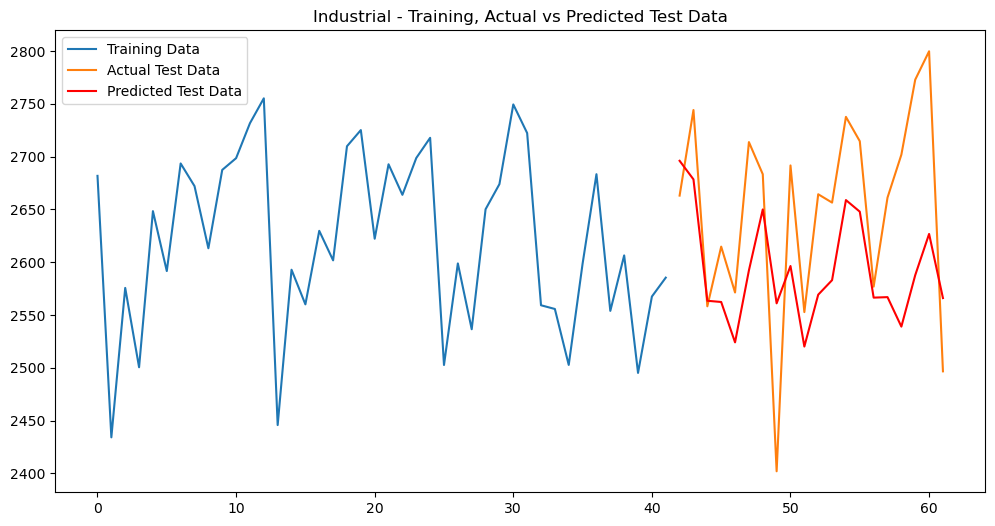

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=567.833, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=551.210, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=566.895, Time=0.01 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=553.288, Time=0.02 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=545.989, Time=0.25 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=555.759, Time=0.19 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=547.983, Time=0.32 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=547.986, Time=0.30 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=549.058, Time=0.19 sec
 ARIMA(2,0,1)(2,1,0)[12] intercept   : AIC=548.790, Time=0.50 sec
 ARIMA(1,0,0)(2,1,0)[12]             : AIC=544.72

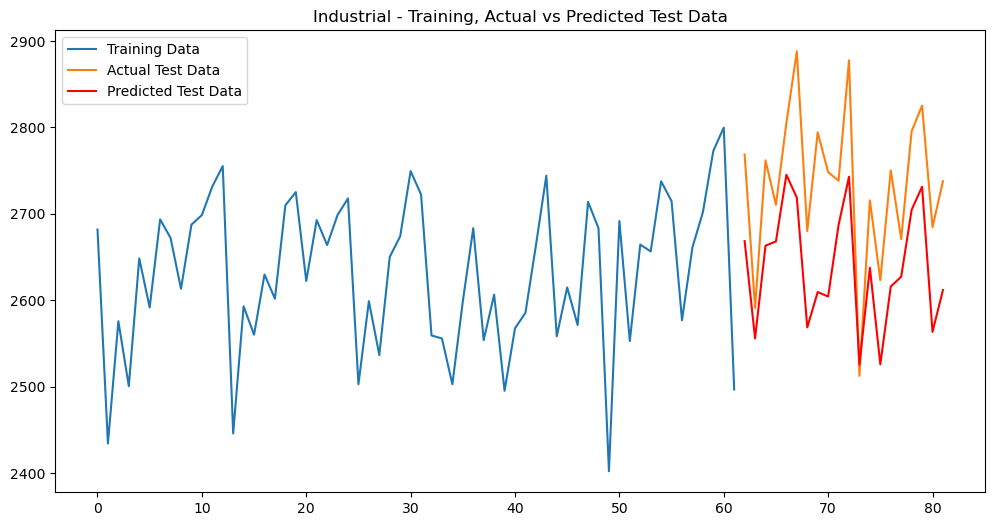

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=793.118, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=768.888, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=771.537, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=795.110, Time=0.00 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=771.168, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=765.473, Time=0.27 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=785.264, Time=0.22 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=765.721, Time=0.35 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=766.047, Time=0.37 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=773.219, Time=0.32 sec
 ARIMA(2,0,1)(2,1,0)[12] intercept   : AIC=767.424, Time=0.66 sec
 ARIMA(1,0,0)(2,1,0)[12]             : AIC=76

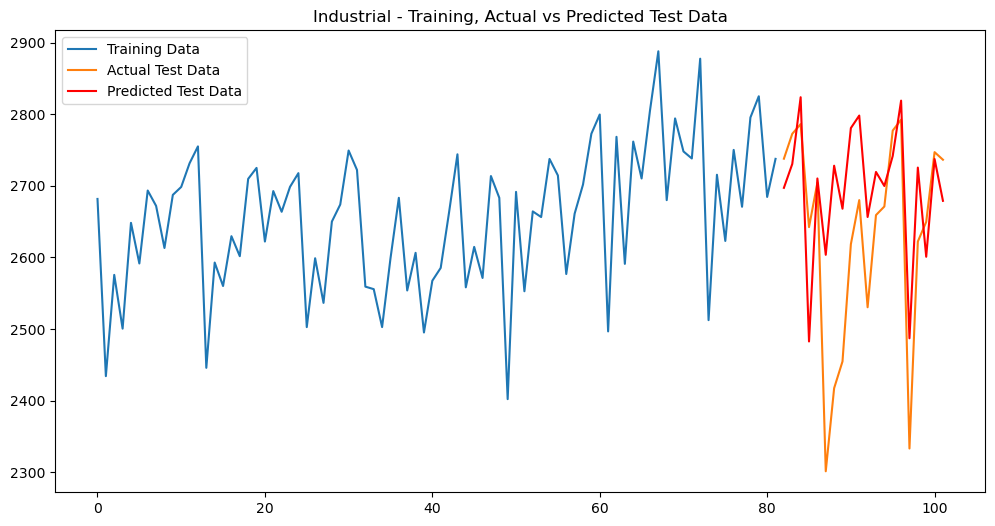

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1227.323, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1252.401, Time=0.00 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1240.373, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1230.040, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1899.694, Time=0.00 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=1233.033, Time=0.31 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=1221.061, Time=0.35 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=1248.893, Time=0.24 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=1222.845, Time=0.61 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=1223.437, Time=0.73 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=1215.154, Time=0.29 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=1247.947, Time=0.05 sec
 ARIMA(1,0,2)(2,0,0)[12] intercept   : AIC=1219.787, Time=0.45 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=1223.611, Time=0.32 sec
 ARIMA(1,0,2)(0,0,1

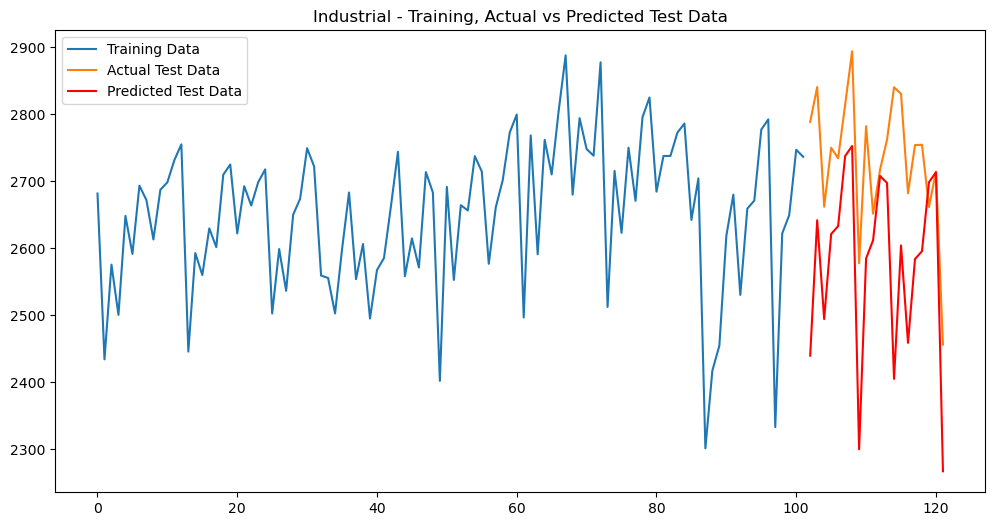

Average MAPE for Industrial: 3.85%
Average MSE for Industrial: 16946.89
Average RMSE for Industrial: 124.66
Average MAE for Industrial: 102.36


In [147]:
# Example of usage Industrial
results_Ind = fit_sarima_cv_new(df_merged, 'Industrial', n_splits=5)

In [148]:
# Accessing the results for Industrial forecating values and error metrics
forecast_Ind = results_Ind['forecast']
mape_Ind = results_Ind['average_mape']
mse_Ind = results_Ind['average_mse']
rmse_Ind = results_Ind['average_rmse']
mae_Ind = results_Ind['average_mae']

In [149]:
mape_Ind,mse_Ind,rmse_Ind,mae_Ind

(3.8474047403874265, 16946.88657572277, 124.6598818291333, 102.35724591635692)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=112.696, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=114.392, Time=0.02 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.08 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.23 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.05 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.06 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.08 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=109.478, Time=0.05 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=112.899, T

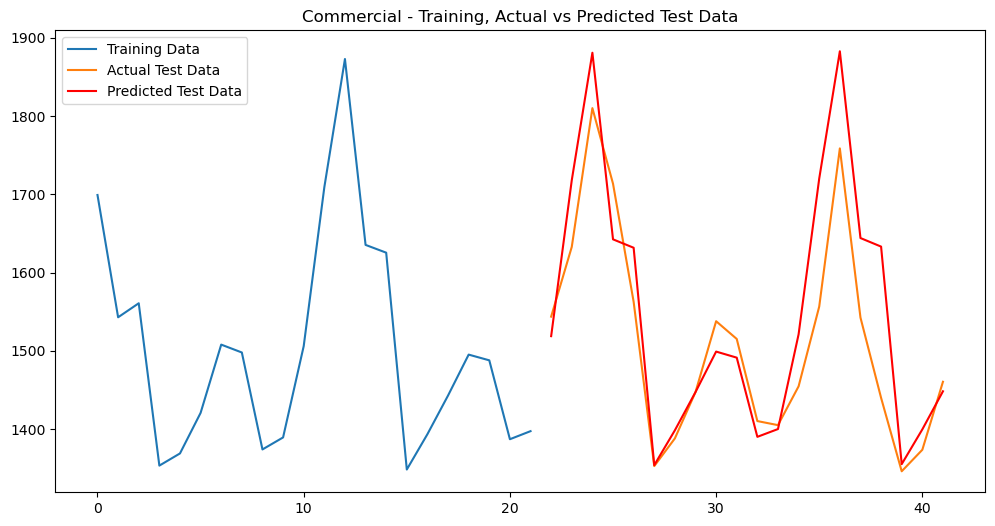

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=324.915, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=323.615, Time=0.03 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=322.593, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=323.079, Time=0.02 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=324.454, Time=0.10 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=322.987, Time=0.03 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=326.455, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=323.301, Time=0.03 sec
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=324.263, Time=0.06 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=324.270, Time=0.06 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=323.291, Time=0.06 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=32

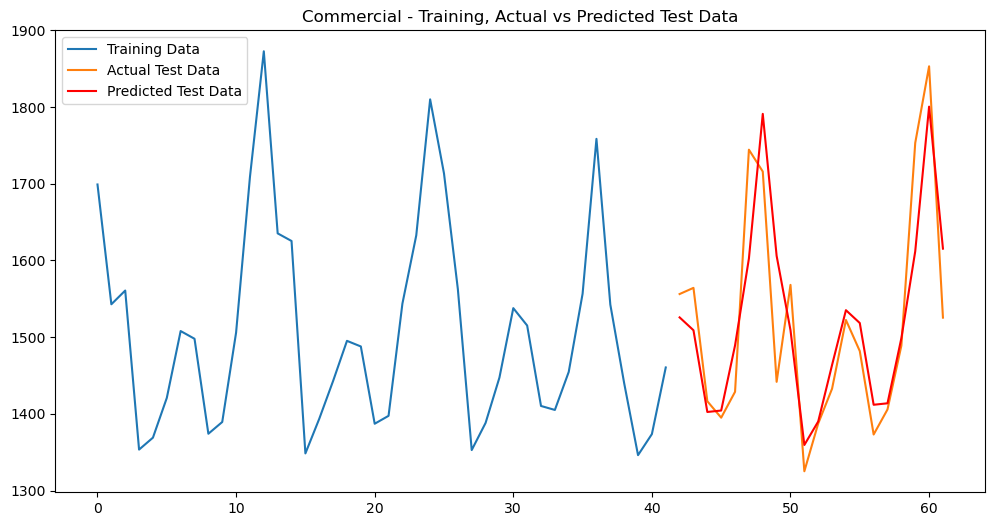

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=569.207, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=567.722, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=560.918, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=567.355, Time=0.00 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=568.144, Time=0.06 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=567.936, Time=0.10 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=561.532, Time=0.16 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=562.532, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=561.276, Time=0.10 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=

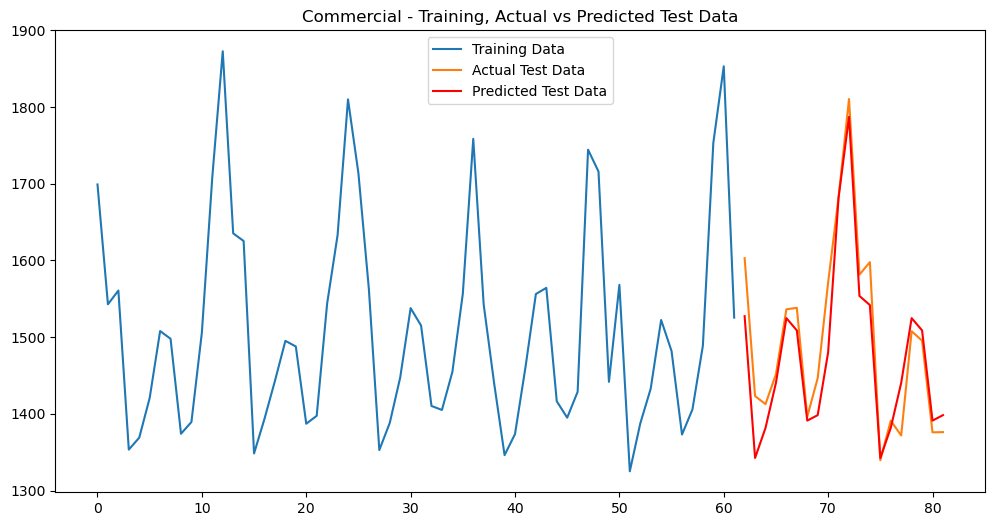

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1036.931, Time=0.00 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=973.763, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=967.165, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1435.437, Time=0.00 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=1016.064, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=946.658, Time=0.28 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1016.963, Time=0.06 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=1233.301, Time=0.38 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=951.886, Time=0.40 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=949.880, Time=0.28 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1012.712, Time=0.38 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=979.814, Time=0.47 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept 

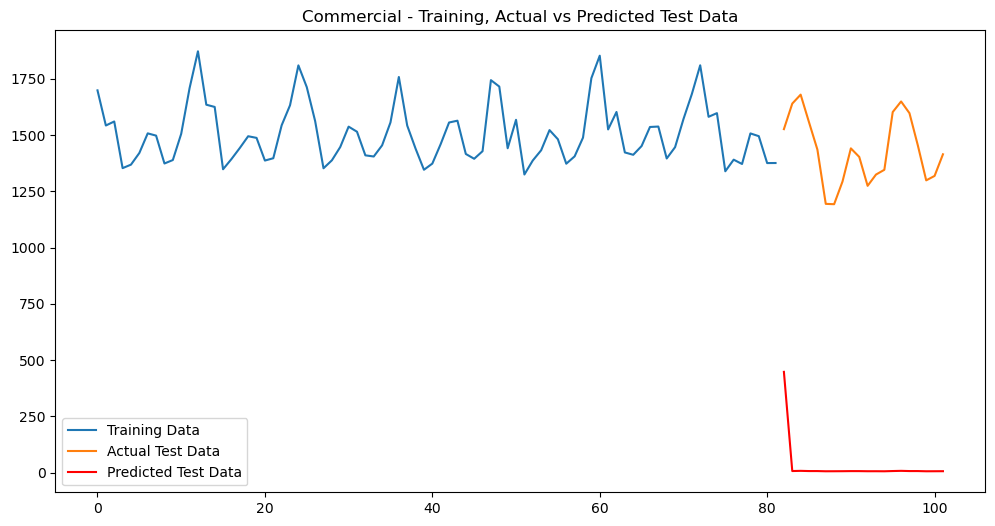

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1193.550, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1299.020, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1208.460, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1201.037, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1783.171, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=1184.590, Time=0.29 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=1177.257, Time=0.55 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=1184.797, Time=0.91 sec
 ARIMA(1,0,2)(0,0,2)[12] intercept   : AIC=1181.781, Time=0.41 sec
 ARIMA(2,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(3,0,2)(0,0,2)[12] intercept   : AIC=1192.354, Time=0.60 sec
 ARIMA(2,0,3)(0,0,2)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=1180.478, Time=0.24 sec
 ARIMA(1,0,3)(0,0,2)[12] intercept

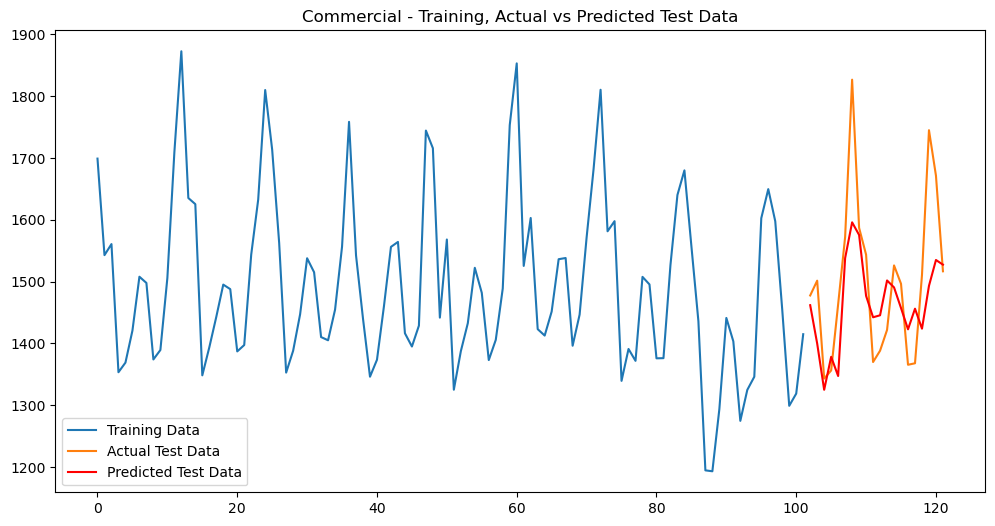

Average MAPE for Commercial: 22.43%
Average MSE for Commercial: 404185.61
Average RMSE for Commercial: 340.94
Average MAE for Commercial: 324.36


In [150]:
# Example of usage for Commercial
results_Comm = fit_sarima_cv_new(df_merged, 'Commercial', n_splits=5)

In [151]:
# Accessing the results
forecast_Comm = results_Comm['forecast']
mape_Comm = results_Comm['average_mape']
mse_Comm = results_Comm['average_mse']
rmse_Comm = results_Comm['average_rmse']
mae_Comm = results_Comm['average_mae']

In [152]:
mape_Comm,mse_Comm,rmse_Comm,mae_Comm

(22.428185335049207, 404185.6108156835, 340.9351029122953, 324.3640672110372)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=16.000, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=92.110, Time=0.00 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=88.223, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=95.952, Time=0.02 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=14.000, Time=0.08 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=12.000, Time=0.05 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=14.000, Time=0.08 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=10.000, Time=0.05 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=12.000, Time=0.07 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=12.000, Time=0.08 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=14.000, Time=0.09 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.03 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=87.534, Time=0.05 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=inf, Time=

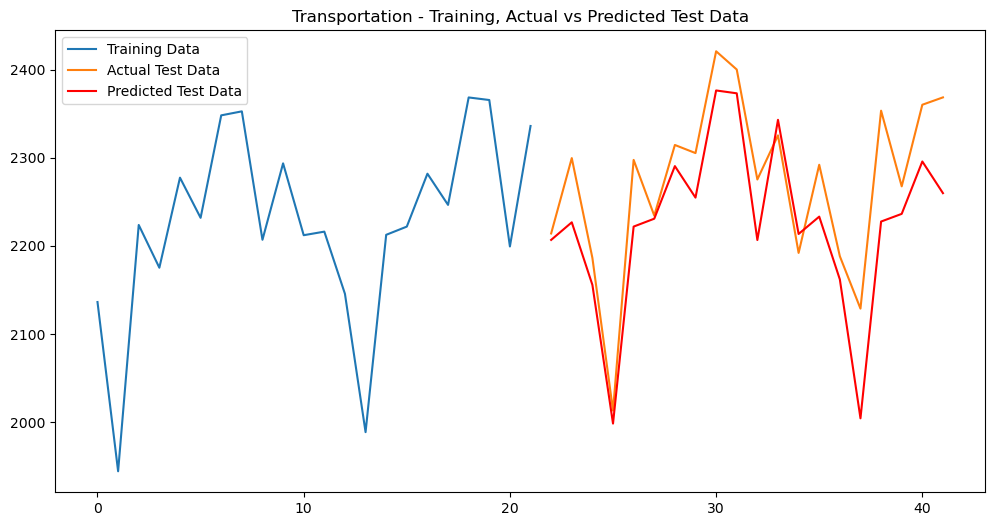

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=308.315, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=298.255, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=300.394, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=300.434, Time=0.05 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=316.319, Time=0.00 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=298.595, Time=0.08 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=298.546, Time=0.03 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=300.540, Time=0.08 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=300.233, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=300.236, Time=0.03 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=302.209, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 0.735 seconds
Best SARIMA order for Transportation: (0, 0, 0)
Best seasonal order for Transportation: (0, 1, 0, 12)
mape_scores  for Transportation: 2.22415937627581
m

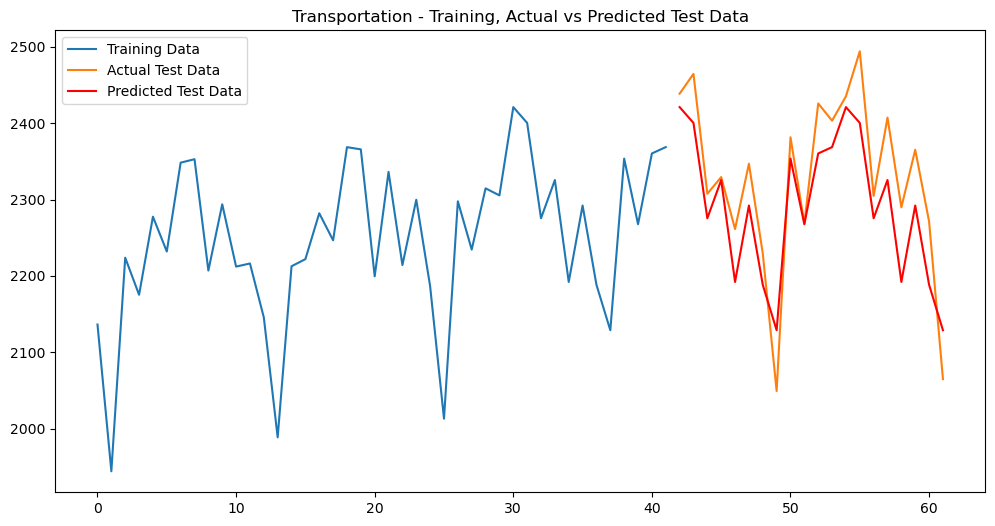

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=496.482, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=495.762, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=492.773, Time=0.08 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=523.962, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=498.292, Time=0.05 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=495.778, Time=0.11 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=491.109, Time=0.06 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=493.957, Time=0.07 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=0.28

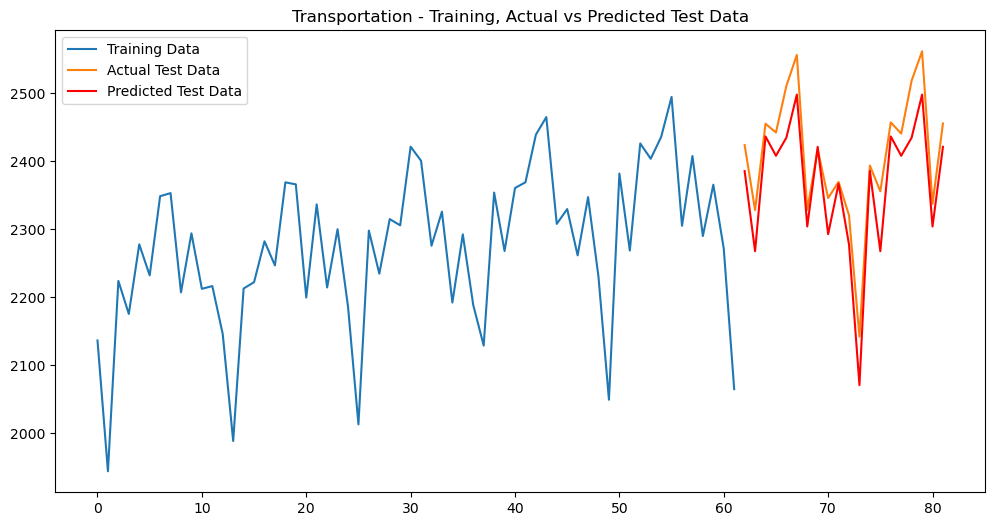

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=687.187, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=682.796, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=676.467, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=728.882, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=689.104, Time=0.05 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=682.816, Time=0.11 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=675.001, Time=0.08 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=681.126, Time=0.08 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=0.31

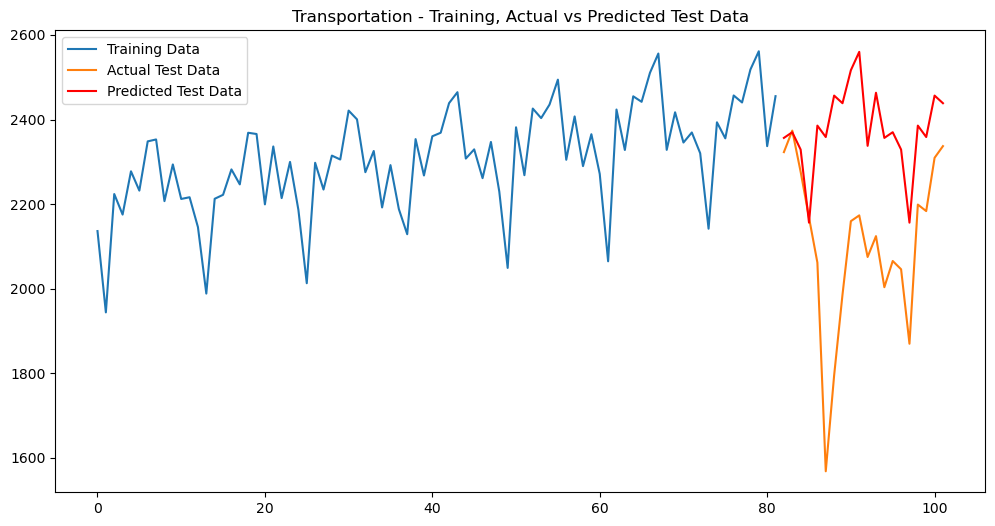

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1254.088, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1330.441, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1264.901, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1282.608, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1868.113, Time=0.00 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=1260.835, Time=0.25 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=1251.047, Time=0.30 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=1280.360, Time=0.13 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=1250.395, Time=0.62 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=1249.393, Time=0.97 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=1254.467, Time=0.81 sec
 ARIMA(1,0,2)(2,0,1)[12] intercept   : AIC=1250.785, Time=0.56 sec
 ARIMA(2,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(3,0,2)(2,0,1)[12] inte

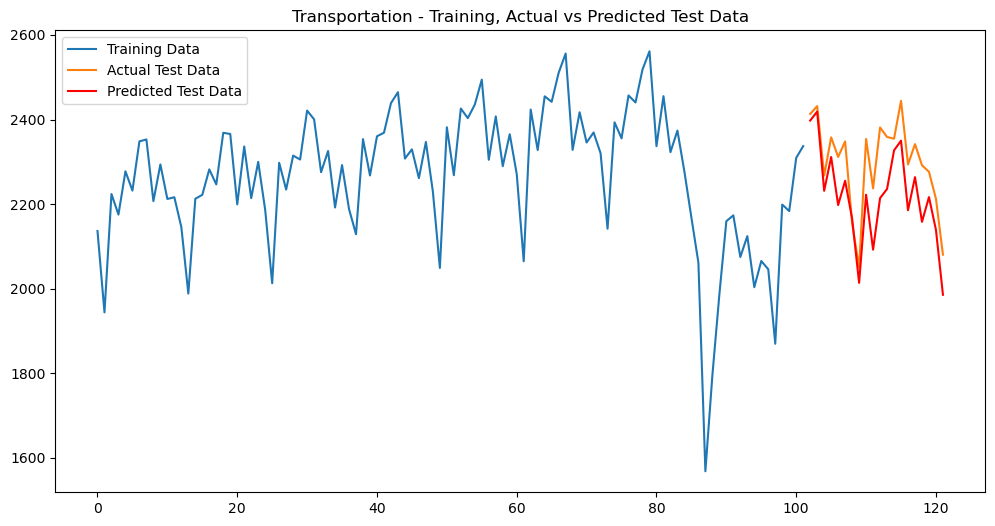

Average MAPE for Transportation: 4.75%
Average MSE for Transportation: 26797.79
Average RMSE for Transportation: 120.59
Average MAE for Transportation: 99.89


In [153]:
# Example of usage
results_Transp = fit_sarima_cv_new(df_merged, 'Transportation', n_splits=5)

In [154]:
# Accessing the results
forecast_Transp = results_Transp['forecast']
mape_Transp = results_Transp['average_mape']
mse_Transp = results_Transp['average_mse']
rmse_Transp = results_Transp['average_rmse']
mae_Transp = results_Transp['average_mae']

In [155]:
mape_Transp,mse_Transp,rmse_Transp,mae_Transp

(4.749236338623545, 26797.788368072168, 120.59325468420734, 99.88905957786473)

In [156]:
#create a new prediction dates
last_date = df_merged['Month'].max()
forecast_dates = [(last_date + pd.DateOffset(months=i)).date() for i in range(1, 101)]

In [157]:
#forecast_dates

In [158]:
df_forecast = pd.DataFrame({
    'Month': forecast_dates,
    'Residential':forecast_RE,
    'Industrial':forecast_Ind,
    'Commercial':forecast_Comm,
    'Transportation':forecast_Transp
})
    



In [159]:
df_forecast.head()

,Month,Residential,Industrial,Commercial,Transportation
0,2023-03-28,1703.556565,2723.241455,1518.751476,2206.842329
1,2023-04-28,2402.910374,2749.033104,1718.014490,2226.815352
2,2023-05-28,2806.586285,2772.289139,1880.852840,2155.750042
3,2023-06-28,2349.780852,2462.600326,1642.449242,1998.229757
4,2023-07-28,2085.116374,2609.407578,1631.701214,2221.976813


In [160]:
print(df_forecast.columns)
print(df_merged.columns)

Index(['Month', 'Residential', 'Industrial', 'Commercial', 'Transportation'], dtype='object')
Index(['Month', 'Residential', 'Industrial', 'Commercial', 'Transportation'], dtype='object')


In [161]:
print(len(forecast_dates))
print(len(forecast_RE))
print(len(forecast_Ind))
print(len(forecast_Comm))
print(len(forecast_Transp))

100
100
100
100
100


In [162]:
df_final = pd.concat([df_merged, df_forecast], ignore_index=True)

In [163]:
df_final.head()

,Month,Residential,Industrial,Commercial,Transportation
0,2013-01-31 00:00:00,2455.465,2681.823,1699.120,2136.279
1,2013-02-28 00:00:00,2087.734,2434.210,1542.877,1944.032
2,2013-03-31 00:00:00,2014.591,2575.716,1560.782,2223.824
3,2013-04-30 00:00:00,1488.318,2500.597,1353.361,2175.260
4,2013-05-31 00:00:00,1312.459,2648.410,1368.918,2277.548


In [164]:
df_final.tail()

,Month,Residential,Industrial,Commercial,Transportation
217,2031-02-28,1668.689637,2584.002388,1456.198034,2263.825048
218,2031-03-28,1640.600103,2595.675514,1423.862349,2158.150813
219,2031-04-28,1884.527040,2698.751366,1493.231187,2216.594681
220,2031-05-28,2149.902686,2713.554363,1535.018355,2138.854689
221,2031-06-28,2136.046082,2267.110002,1527.475255,1985.672571


In [165]:
print(df_final.columns)

Index(['Month', 'Residential', 'Industrial', 'Commercial', 'Transportation'], dtype='object')


In [166]:
for col in df_final.columns:
    if 'Month' in col:
        print(repr(col)) 

'Month'


In [167]:
# Convert 'Month' column to Timestamp
#df_final['Month'] = pd.to_datetime(df_final['Month'])

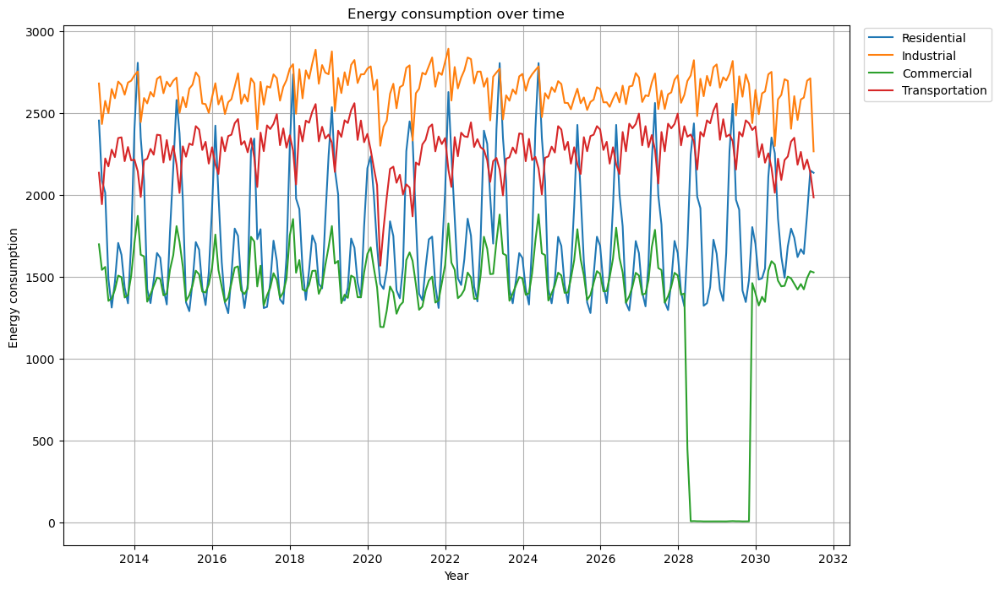

In [168]:
#Now we can check timeseries for all sectors
df_final.set_index('Month').plot(figsize=(12,8))
plt.title('Energy consumption over time')
plt.legend(loc ='upper center', bbox_to_anchor =(1.1,1.0), ncol=1, borderaxespad =0.2)
plt.xlabel('Year')
plt.ylabel('Energy consumption ')
plt.grid(True)
plt.show()

In [169]:
# Define a color mapping for each sector before and after the date
color_map = {
    'Residential': {'before': 'blue', 'after': 'skyblue'},
    'Industrial': {'before': 'red', 'after': 'pink'},
    'Commercial': {'before': 'green', 'after': 'green'},
    'Transportation': {'before': 'orange', 'after': 'yellow'}
}


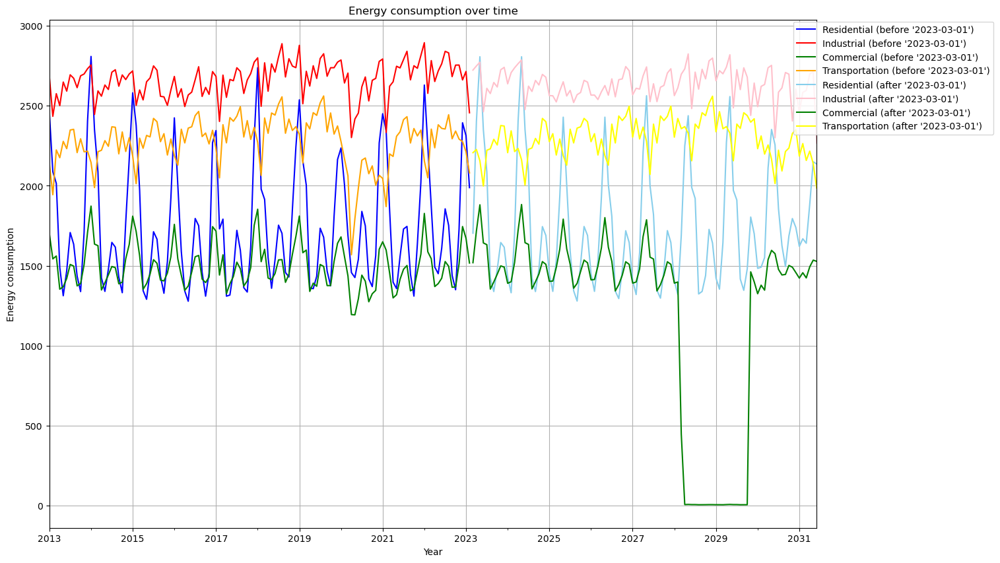

In [170]:
import matplotlib.pyplot as plt

# Convert 'Month' column to datetime (if it's not already)
df_final['Month'] = pd.to_datetime(df_final['Month'])

# Split the data
df_before = df_final[df_final['Month'] <= '2023-03-01']
df_after = df_final[df_final['Month'] > '2023-03-01']

fig, ax = plt.subplots(figsize=(15,10))

# Plot data before the date
for column in df_before.columns:
    if column != 'Month' and column in color_map:
        df_before.set_index('Month')[column].plot(ax=ax, color=color_map[column]['before'], label=column + " (before '2023-03-01')")

# Plot data after the date
for column in df_after.columns:
    if column != 'Month' and column in color_map:
        df_after.set_index('Month')[column].plot(ax=ax, color=color_map[column]['after'], label=column + " (after '2023-03-01')")

plt.title('Energy consumption over time')
plt.legend(loc ='upper center', bbox_to_anchor =(1.1,1.0), ncol=1, borderaxespad=0.2)
plt.xlabel('Year')
plt.ylabel('Energy consumption')
plt.grid(True)
plt.show()


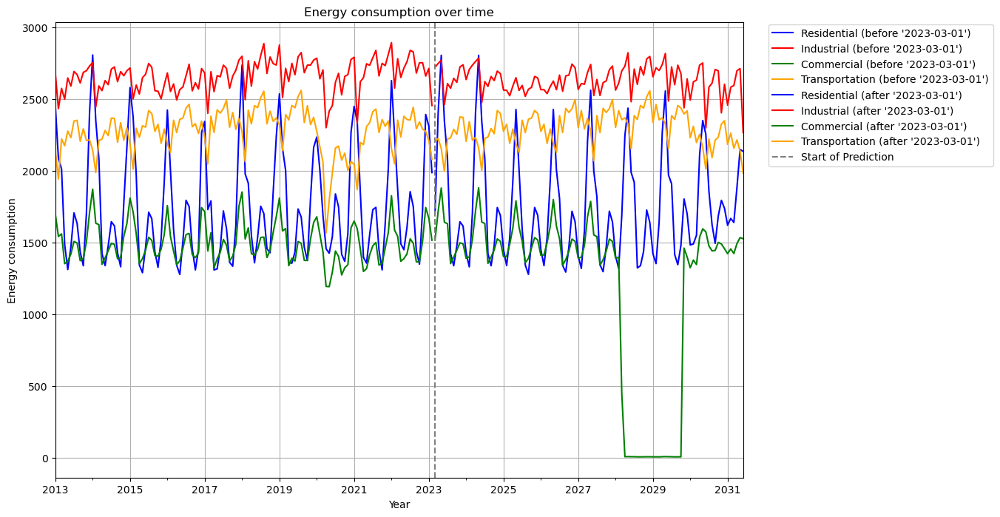

In [171]:
import matplotlib.pyplot as plt

# Convert 'Month' column to datetime (if it's not already)
df_final['Month'] = pd.to_datetime(df_final['Month'])

# Define a color mapping for each sector before and after the date
color_map = {
    'Residential': {'before': 'blue', 'after': 'blue'},
    'Industrial': {'before': 'red', 'after': 'red'},
    'Commercial': {'before': 'green', 'after': 'green'},
    'Transportation': {'before': 'orange', 'after': 'orange'}
}

# Split the data
df_before = df_final[df_final['Month'] <= '2023-03-01']
df_after = df_final[df_final['Month'] > '2023-03-01']

fig, ax = plt.subplots(figsize=(12,8))

# Plot data before the date
for column in df_before.columns:
    if column != 'Month' and column in color_map:
        df_before.set_index('Month')[column].plot(ax=ax, color=color_map[column]['before'], label=column + " (before '2023-03-01')")

# Plot data after the date
for column in df_after.columns:
    if column != 'Month' and column in color_map:
        df_after.set_index('Month')[column].plot(ax=ax, color=color_map[column]['after'], label=column + " (after '2023-03-01')")

# Add a vertical line at '2023-03-01'
ax.axvline('2023-03-01', color='gray', linestyle='--', label='Start of Prediction')

plt.title('Energy consumption over time')
plt.legend(loc='upper center', bbox_to_anchor=(1.2,1.0), ncol=1, borderaxespad=0.2)
plt.xlabel('Year')
plt.ylabel('Energy consumption')
plt.grid(True)
plt.show()
